In [20]:
import qetpy as qp
from detprocess import Noise, Template, DIDVAnalysis
from qetpy.core.didv._templates_didv import get_didv_template
import pytesdaq.io as h5io
from pytesdaq.io.hdf5 import H5Reader
h5 = h5io.H5Reader()

import scipy as sp
import pandas as pd
import numpy as np
import pickle
import glob
import os
import pprint

import matplotlib as mpl
from matplotlib import pyplot as plt
mpl.rcParams['figure.figsize'] = [10, 6.5]

In [92]:
spreadsheet_path = '/home/maggie_reed/Downloads/r58_data_track.xlsx'
excel_data = pd.ExcelFile(spreadsheet_path)
channels = ['Mv4025pcBF4mmLeft', 'Mv4025pcBF4mmRight','Mv4025pcBF1mmLeft','Mv4025pcBF1mmRight']
fs = 1.25e6
tl = 7.5e-3
tlms = 7.5
timearr = np.arange(0, tl, 1/fs)

base_path = '/sdata1/runs/run58'
calibration_path_A = '/sdata1/runs/run57/processed/calibrations/photoncal_Mv4025pcBF4mmLeft_122724_450'
calibration_path_B = '/sdata1/runs/run57/processed/calibrations/photoncal_Mv4025pcBF4mmRight_122724_450'
calibration_path_C = '/sdata1/runs/run57/processed/calibrations/photoncal_Mv4025pcBF1mmLeft_122724_450'
calibration_path_D = '/sdata1/runs/run57/processed/calibrations/photoncal_Mv4025pcBF1mmRight_122724_450'
cal_path_list = [calibration_path_A,calibration_path_B,calibration_path_C,calibration_path_D]

In [51]:
iv_list_A = ['iv_didv_I2_D20250205_T173759/ivsweep_analysis_D20250210_T103811.hdf5',
             'iv_didv_I2_D20250207_T104730/ivsweep_analysis_D20250210_T121311.hdf5',
             'iv_didv_I2_D20250207_T104730/ivsweep_analysis_D20250210_T121311.hdf5',
             'iv_didv_I2_D20250210_T110001/ivsweep_analysis_D20250212_T135629.hdf5'
            ]
iv_list_B = ['iv_didv_I2_D20250205_T173759/ivsweep_analysis_D20250210_T111931.hdf5',
             'iv_didv_I2_D20250207_T104730/ivsweep_analysis_D20250210_T125910.hdf5',
             'iv_didv_I2_D20250207_T104730/ivsweep_analysis_D20250210_T125910.hdf5',
             'iv_didv_I2_D20250210_T110001/ivsweep_analysis_D20250212_T135826.hdf5'
            ]
iv_list_C = ['iv_didv_I2_D20250205_T234521/ivsweep_analysis_D20250207_T144336.hdf5',
             'iv_didv_I2_D20250207_T140714/ivsweep_analysis_D20250210_T102306.hdf5',
             'iv_didv_I2_D20250207_T140714/ivsweep_analysis_D20250210_T102306.hdf5',
             'iv_didv_I2_D20250210_T134420/ivsweep_analysis_D20250211_T142135.hdf5'
            ]
iv_list_D = ['iv_didv_I2_D20250205_T234521/ivsweep_analysis_D20250207_T144632.hdf5',
             'iv_didv_I2_D20250207_T140714/ivsweep_analysis_D20250210_T102636.hdf5',
             'iv_didv_I2_D20250207_T140714/ivsweep_analysis_D20250210_T102636.hdf5',
             'iv_didv_I2_D20250210_T134420/ivsweep_analysis_D20250211_T142920.hdf5'
            ]
iv_list = [iv_list_A, iv_list_B, iv_list_C, iv_list_D]

In [22]:
continuous_excel = pd.read_excel(spreadsheet_path, sheet_name=excel_data.sheet_names[1])
continuous_excel.applymap(lambda x: x.strip() if isinstance(x, str) else x)
iv_excel = pd.read_excel(spreadsheet_path, sheet_name=excel_data.sheet_names[0])
iv_excel.applymap(lambda x: x.strip() if isinstance(x, str) else x)

,channel,data_type,path,neutralization
0,A,IV Sweep,iv_didv_I2_D20250201_T193154/ivsweep_analysis_...,pre
1,A,IV Sweep,iv_didv_I2_D20250205_T173759/ivsweep_analysis_...,pre
2,A,IV Sweep,iv_didv_I2_D20250207_T104730/ivsweep_analysis_...,post
3,B,IV Sweep,iv_didv_I2_D20250201_T193154/ivsweep_analysis_...,pre
4,B,IV Sweep,iv_didv_I2_D20250205_T173759/ivsweep_analysis_...,pre
5,B,IV Sweep,iv_didv_I2_D20250207_T104730/ivsweep_analysis_...,post
6,C,IV Sweep,iv_didv_I2_D20250201_T161045/ivsweep_analysis_...,pre
7,C,IV Sweep,iv_didv_I2_D20250205_T234521/ivsweep_analysis_...,pre
8,C,IV Sweep,iv_didv_I2_D20250207_T140714/ivsweep_analysis_...,post
9,D,IV Sweep,iv_didv_I2_D20250201_T161045/ivsweep_analysis_...,pre


In [23]:
continuous_excel

,data_type,path,neutralization,feature_path
0,continuous_background,continuous_I2_D20250202_T143720,pre,feature_I2_D20250204_T153153
1,continuous_background,continuous_I2_D20250206_T090218,pre,NaN
2,continuous_background,continuous_I2_D20250206_T202247,post,NaN
3,didv,continuous_I2_D20250202_T143720/didv_analysis_...,pre,NaN
4,continuous_background,continuous_I2_D20250207_T190322,post,NaN
5,continuous_background,continuous_I2_D20250210_T162213,post,NaN


In [53]:
def process_continuous(continuous_data):
    raw_list = []
    noise_list = []
    for index, row in continuous_data.iterrows():
        data_type = row['data_type']
        path = row['path']
        neutralization = row['neutralization']
        feature_path = row.get('feature_path','')
        
        if pd.notna(feature_path) and feature_path != '':
            print(f"Skipping {path} as feature_path is not empty.")
            continue
    
        # Extract date from path (assuming date is part of the path in 'DYYYYMMDD' format)
        date_str = next((part for part in path.split('_') if part.startswith('D')), 'D00000000')[1:]
        time_str = next((part for part in path.split('_') if part.startswith('T')), 'T000000')[1:]
        noise_filename = f"noise_{date_str}_{time_str}_{neutralization}.hdf5"
        full_noise_filename = '~/processing/run58/filterdata/' + noise_filename
        full_path = base_path + '/raw/' + path
        print(f'----------processing noise data: {full_path}--------------')
        if data_type == 'continuous_background':
            noise_processor = Noise(verbose=True)
            noise_processor.clear_data()
            try:
                noise_processor.generate_randoms(full_path, series=None, nevents=500, ncores=4)
                noise_processor.calc_psd(channels, 
                   trace_length_msec=tlms, 
                   pretrigger_length_msec=tlms/2,
                   nevents=1000)
                noise_processor.plot_psd(channels,unit='pA')
                raw_list.append(full_path)
                noise_list.append(full_noise_filename)
                plt.show()
                noise_processor.save_hdf5(full_noise_filename, overwrite=True)
            except Exception as e:
                print(f'Error occured: {e}')
                
        else:
            continue
    return raw_list, noise_list



In [69]:
def fit_didvs(raw_list, iv_list, noise_list):
    didv_list = []
    for index, file_path in enumerate(raw_list):
        print(f'-------starting didv for {file_path}--------')
        didv_save_name = 'didv'+noise_list[index]
        didvanalysis_temp = DIDVAnalysis(verbose=True, auto_save_hdf5=True, file_path_name=base_path+'/filterdata/'+didv_save_name)
        didv_list.append(didv_save_name)
        all_files = list(os.listdir(file_path))
        all_files.sort()
        
        names_didv = []
        i = 0
        while i < len(all_files):
            if 'didv' in all_files[i]:
                names_didv.append(all_files[i])
            i += 1
        
        i = 0
        path_to_data = base_path + names_didv[i]
        
        strip_didvbor = []
        for i in range(len(names_didv)):
            temp_string = names_didv[i]
            stripped = temp_string.replace('didv_bor_', '')
            stripped = stripped[:-11]
            
            strip_didvbor.append(stripped)
        didvanalysis_temp.process_raw_data(channels, file_path, series=strip_didvbor[0])
        for ichan, chan in enumerate(channels):
            print(f'{chan}')
            ivsweep_file = base_path + '/filterdata/' + iv_list[ichan][index]
            print(ivsweep_file)
            didvanalysis_temp.set_ivsweep_results_from_file(chan, file_name=ivsweep_file, include_bias_parameters=True)
            
            print(f'{chan} IV Sweep Results:\n')
            ivsweep_results = didvanalysis_temp.get_ivsweep_results(chan)
        didvanalysis_temp.dofit([2,3], lgc_plot=True)
        didvanalysis_temp.calc_smallsignal_params(channels=channels)
    return didv_list
        #print(strip_didvbor)
            

In [86]:
def gen_templates(raw_list, noise_list, didv_list):
    for index, file_path in enumerate(raw_list):
        noise_path = '~/processing/run58/filterdata/'+noise_list[index]
        #didv_path = base_path+'/filterdata/'+didv_list[index]
        didv_path = './'+didv_list[index]
        template_temp = Template(verbose=True)
        template_temp.load_hdf5(noise_path)
        didv_results = DIDVAnalysis(verbose=True, auto_save_hdf5=False)
        didv_results.load_hdf5(didv_path)
        for ichan, chan in enumerate(channels):
            results3 = didv_results.get_didv_results(chan, 3)
            template_didv = get_didv_template(timearr, tl/2, results3, lgcplot=True)
            template_temp.set_template(chan, template_didv, fs, tlms/2)
            template_temp.save_hdf5(noise_path, overwrite=True)

In [99]:
def set_phonon_templates(raw_list, noise_list, didv_list, cal_path_list):
    for index, file_path in enumerate(raw_list):
        noise_path = '~/processing/run58/filterdata/'+noise_list[index]
        didv_path = './'+didv_list[index]
        template_temp = Template(verbose=True)
        didv_results = DIDVAnalysis(verbose=True, auto_save_hdf5=False)
        didv_results.load_hdf5(didv_path)
        template_temp.load_hdf5(noise_path)
        for ichan,chan in enumerate(channels):
            results3 = didv_results.get_didv_results(chan, 3)
            cal_path = cal_path_list[ichan]
            with open(cal_path,'rb') as file:
                cal_veto_obj = pickle.load(file)
            phonon_temp = cal_veto_obj.get_current_template(1,didvresult=results3,t_arr=timearr, start_time=tl/2,fs=fs, lgc_plot=False)
            template_temp.set_template(chan, phonon_temp, fs, tlms/2, tag='phonon')
        template_temp.save_hdf5(noise_path, overwrite=True)

Skipping continuous_I2_D20250202_T143720 as feature_path is not empty.
----------processing noise data: /sdata1/runs/run58/raw/continuous_I2_D20250206_T090218--------------
INFO: Building file map for raw data group continuous_I2_D20250206_T090218
INFO: Total raw data duration = 180.0 minutes (1080 events)
INFO: Processing with be split between 4 cores!
INFO Node #1: Acquiring randoms for series I2_D20250206_T090619INFO Node #2: Acquiring randoms for series I2_D20250206_T101446

INFO Node #4: Acquiring randoms for series I2_D20250206_T115722INFO Node #3: Acquiring randoms for series I2_D20250206_T112309

INFO Node #2: Acquiring randoms for series I2_D20250206_T104857
INFO Node #1: Acquiring randoms for series I2_D20250206_T094033
INFO: Randoms acquisition done!
INFO: Processing PSD for channel Mv4025pcBF4mmLeft
INFO: 492 events found in raw data for channel(s) Mv4025pcBF4mmLeft
INFO: Number of events after cuts = 65, efficiency = 13.21%
INFO: Processing PSD for channel Mv4025pcBF4mmRig

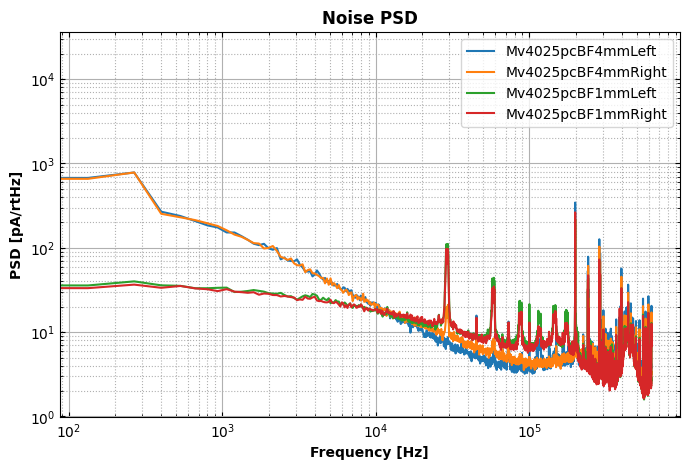

INFO: Saving filter/TES data to file ~/processing/run58/filterdata/noise_20250206_090218_pre.hdf5! (overwrite=True)
----------processing noise data: /sdata1/runs/run58/raw/continuous_I2_D20250206_T202247--------------
INFO: Building file map for raw data group continuous_I2_D20250206_T202247
INFO: Total raw data duration = 157.66666666666666 minutes (946 events)
INFO: Processing with be split between 4 cores!
INFO Node #1: Acquiring randoms for series I2_D20250206_T202647INFO Node #2: Acquiring randoms for series I2_D20250206_T213514

INFO Node #4: Acquiring randoms for series I2_D20250206_T231747INFO Node #3: Acquiring randoms for series I2_D20250206_T224336

INFO Node #2: Acquiring randoms for series I2_D20250206_T220925
INFO Node #1: Acquiring randoms for series I2_D20250206_T210101
INFO: Randoms acquisition done!
INFO: Processing PSD for channel Mv4025pcBF4mmLeft
INFO: 500 events found in raw data for channel(s) Mv4025pcBF4mmLeft
INFO: Number of events after cuts = 252, efficiency 

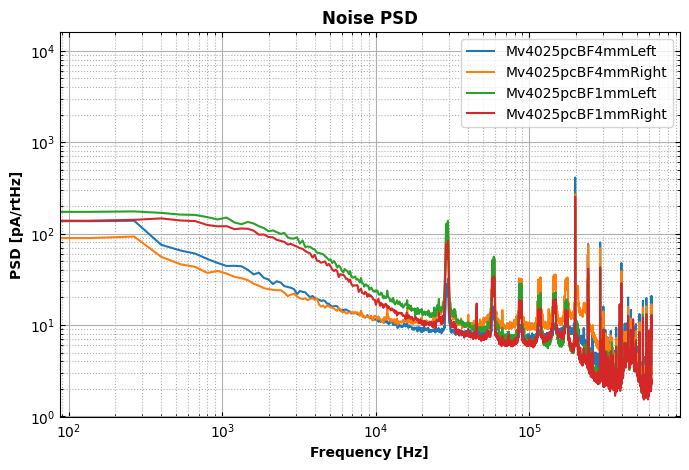

INFO: Saving filter/TES data to file ~/processing/run58/filterdata/noise_20250206_202247_post.hdf5! (overwrite=True)
----------processing noise data: /sdata1/runs/run58/raw/continuous_I2_D20250202_T143720/didv_analysis_D20250204_T125801.hdf5--------------
----------processing noise data: /sdata1/runs/run58/raw/continuous_I2_D20250207_T190322--------------
INFO: Building file map for raw data group continuous_I2_D20250207_T190322
INFO: Total raw data duration = 180.0 minutes (1080 events)
INFO: Processing with be split between 4 cores!
INFO Node #1: Acquiring randoms for series I2_D20250207_T190723INFO Node #2: Acquiring randoms for series I2_D20250207_T201546

INFO Node #3: Acquiring randoms for series I2_D20250207_T212408INFO Node #4: Acquiring randoms for series I2_D20250207_T215820

INFO Node #2: Acquiring randoms for series I2_D20250207_T204957
INFO Node #1: Acquiring randoms for series I2_D20250207_T194135
INFO: Randoms acquisition done!
INFO: Processing PSD for channel Mv4025pcBF

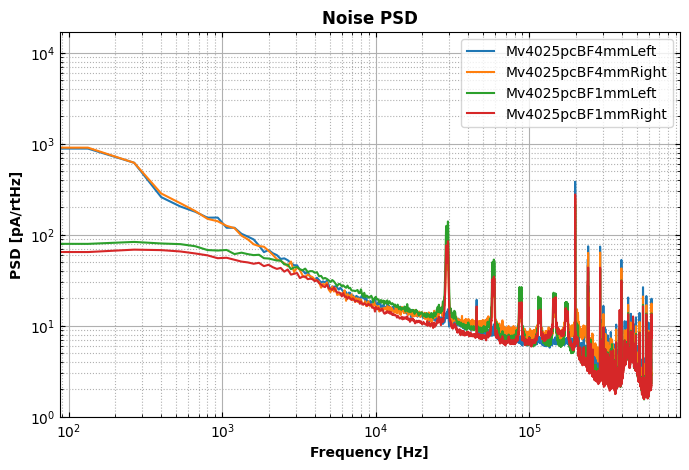

INFO: Saving filter/TES data to file ~/processing/run58/filterdata/noise_20250207_190322_post.hdf5! (overwrite=True)
----------processing noise data: /sdata1/runs/run58/raw/continuous_I2_D20250210_T162213--------------
INFO: Building file map for raw data group continuous_I2_D20250210_T162213
INFO: Total raw data duration = 180.0 minutes (1080 events)
INFO: Processing with be split between 4 cores!
INFO Node #2: Acquiring randoms for series I2_D20250210_T173438INFO Node #1: Acquiring randoms for series I2_D20250210_T162615

INFO Node #4: Acquiring randoms for series I2_D20250210_T191716INFO Node #3: Acquiring randoms for series I2_D20250210_T184302

INFO Node #2: Acquiring randoms for series I2_D20250210_T180849
INFO Node #1: Acquiring randoms for series I2_D20250210_T170027
INFO: Randoms acquisition done!
INFO: Processing PSD for channel Mv4025pcBF4mmLeft
INFO: 492 events found in raw data for channel(s) Mv4025pcBF4mmLeft
INFO: Number of events after cuts = 69, efficiency = 14.02%
INF

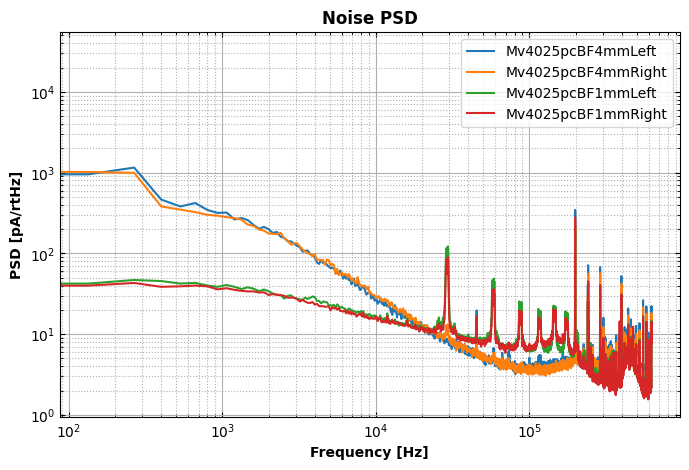

INFO: Saving filter/TES data to file ~/processing/run58/filterdata/noise_20250210_162213_post.hdf5! (overwrite=True)


In [30]:
raw_data_list, noise_raw_list = process_continuous(continuous_excel)

In [54]:
noise_raw_list = ['noise_20250206_090218_pre.hdf5','noise_20250206_202247_post.hdf5','noise_20250207_190322_post.hdf5']

In [ ]:
raw_data_list= raw_data_list[:-1]

-------starting didv for /sdata1/runs/run58/raw/continuous_I2_D20250206_T090218--------
INFO: Results will be automatically saved in /sdata1/runs/run58/filterdata/didvnoise_20250206_090218_pre.hdf5
INFO: Getting raw data and processing channel Mv4025pcBF4mmLeft
INFO: Getting raw data and processing channel Mv4025pcBF4mmRight
INFO: Getting raw data and processing channel Mv4025pcBF1mmLeft
INFO: Getting raw data and processing channel Mv4025pcBF1mmRight
Mv4025pcBF4mmLeft
/sdata1/runs/run58/filterdata/iv_didv_I2_D20250205_T173759/ivsweep_analysis_D20250210_T103811.hdf5
INFO: Loading filter data from file /sdata1/runs/run58/filterdata/iv_didv_I2_D20250205_T173759/ivsweep_analysis_D20250210_T103811.hdf5
Mv4025pcBF4mmLeft IV Sweep Results:

Mv4025pcBF4mmRight
/sdata1/runs/run58/filterdata/iv_didv_I2_D20250205_T173759/ivsweep_analysis_D20250210_T111931.hdf5
INFO: Loading filter data from file /sdata1/runs/run58/filterdata/iv_didv_I2_D20250205_T173759/ivsweep_analysis_D20250210_T111931.hdf5
Mv

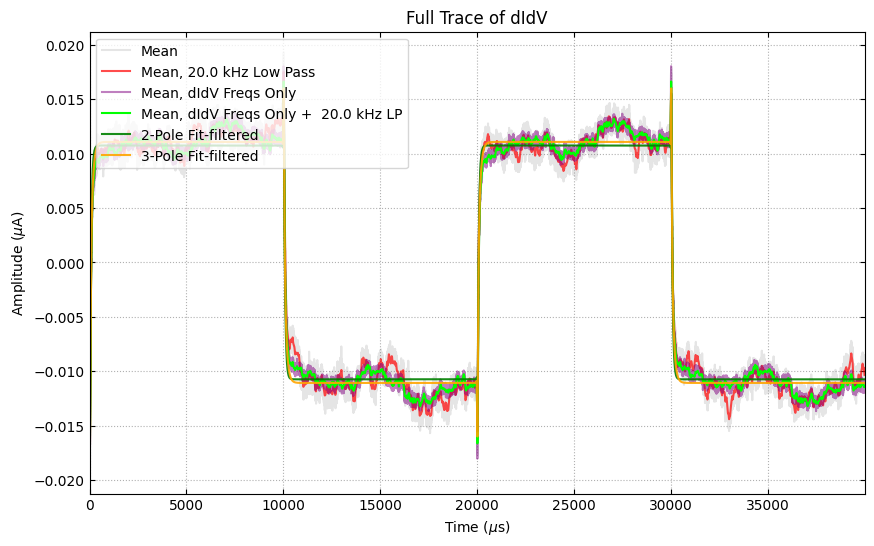

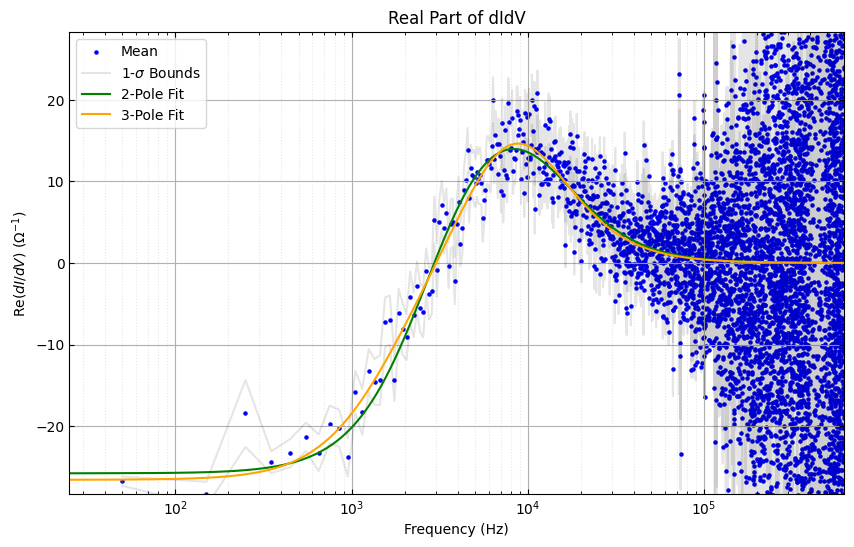

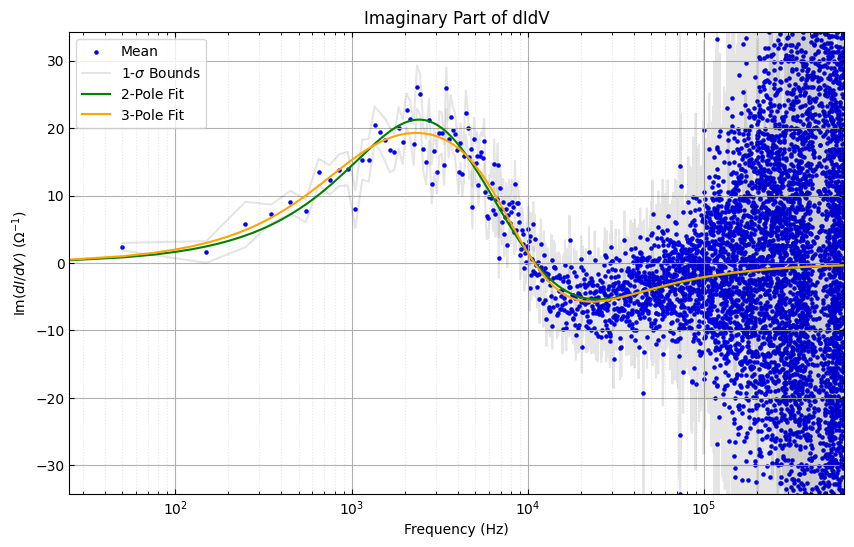


Mv4025pcBF4mmRight dIdV 2-poles Fit Result:
Fit chi2/Ndof = 0.256

Fit time constants, NOT dIdV Poles: 
Tau1: 3.02e-05 s
Tau2: 4.29e-06 s
Tau3: 0 s
 

True dIdV Poles: 
Tau_plus: 5.39e-06 s
Tau_minus: 7e-05 s
Tau_third: 0 s

Mv4025pcBF4mmRight dIdV 3-poles Fit Result:
Fit chi2/Ndof = 0.256

Fit time constants, NOT dIdV Poles: 
Tau1: 3.11e-05 s
Tau2: 4.66e-06 s
Tau3: 0.0001235 s
 

True dIdV Poles: 
Tau_plus: 6.13e-06 s
Tau_minus: 4.64e-05 s
Tau_third: 0.0001686 s

Mv4025pcBF4mmRight dIdV Fit Plots:


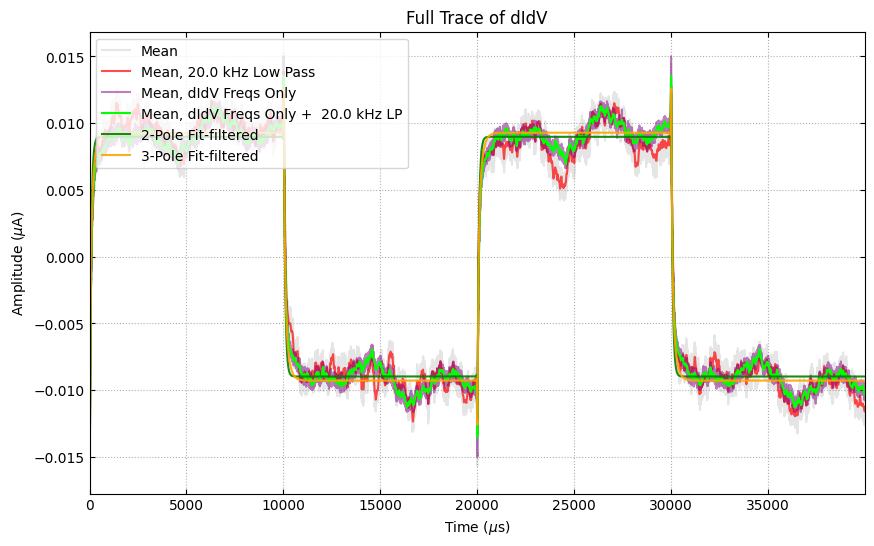

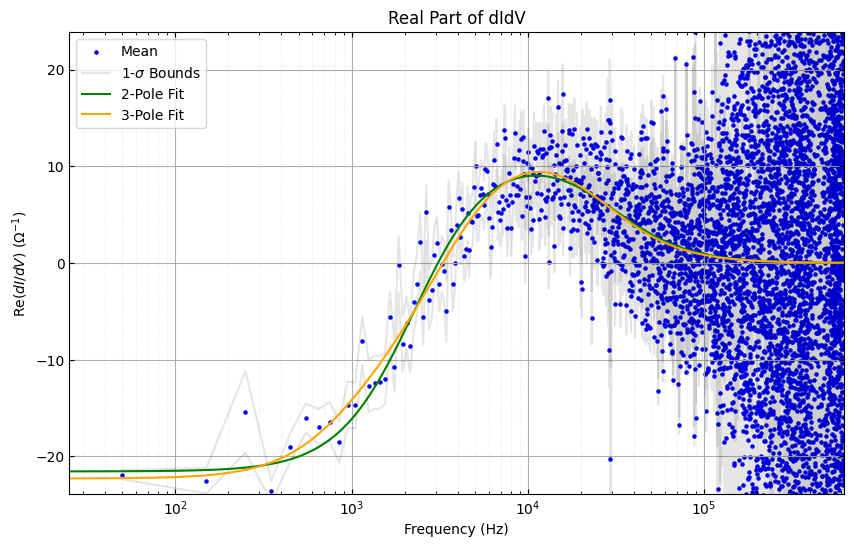

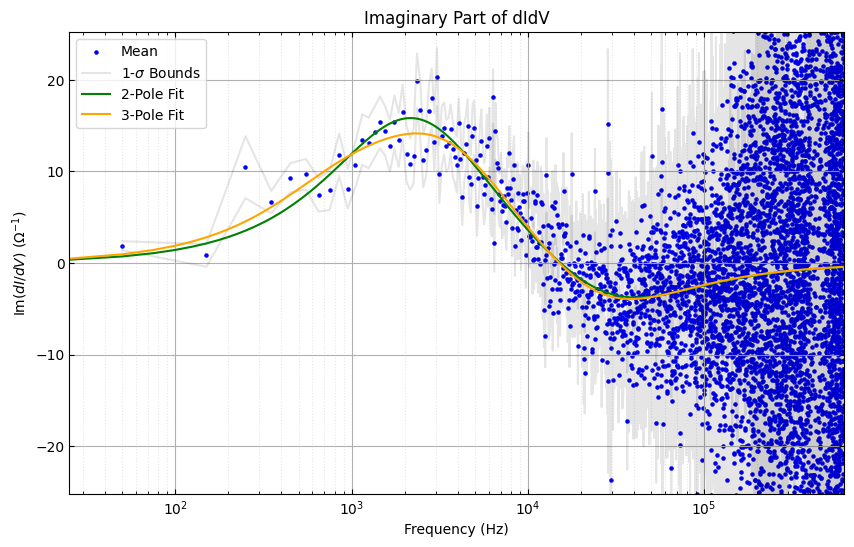


Mv4025pcBF1mmLeft dIdV 2-poles Fit Result:
Fit chi2/Ndof = 0.252

Fit time constants, NOT dIdV Poles: 
Tau1: 1.35e-05 s
Tau2: 1.68e-06 s
Tau3: 0 s
 

True dIdV Poles: 
Tau_plus: 2.09e-06 s
Tau_minus: 2.42e-05 s
Tau_third: 0 s

Mv4025pcBF1mmLeft dIdV 3-poles Fit Result:
Fit chi2/Ndof = 0.252

Fit time constants, NOT dIdV Poles: 
Tau1: 1.35e-05 s
Tau2: 1.75e-06 s
Tau3: 0.0001163 s
 

True dIdV Poles: 
Tau_plus: 2.2e-06 s
Tau_minus: 2.29e-05 s
Tau_third: 0.0001194 s

Mv4025pcBF1mmLeft dIdV Fit Plots:


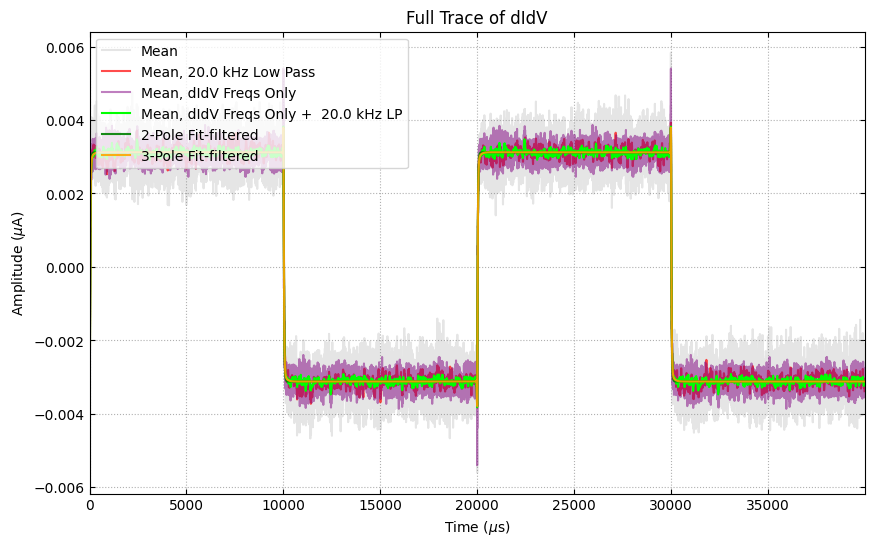

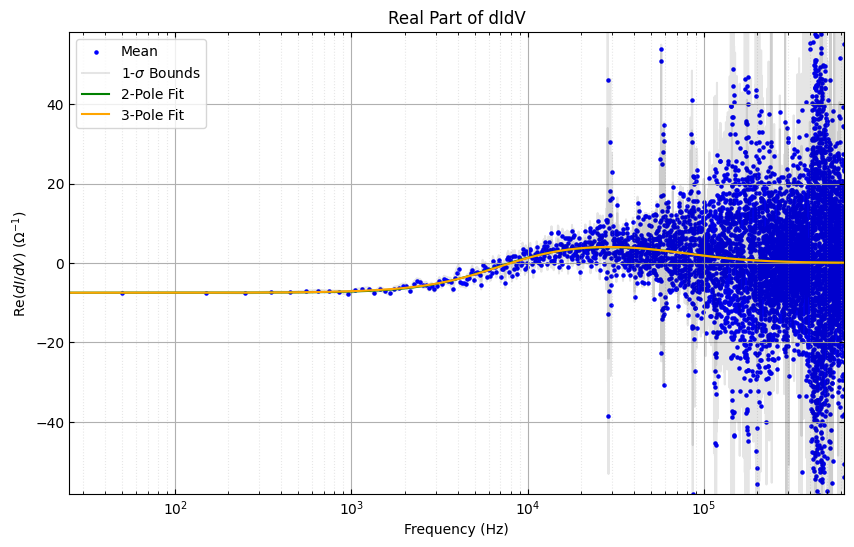

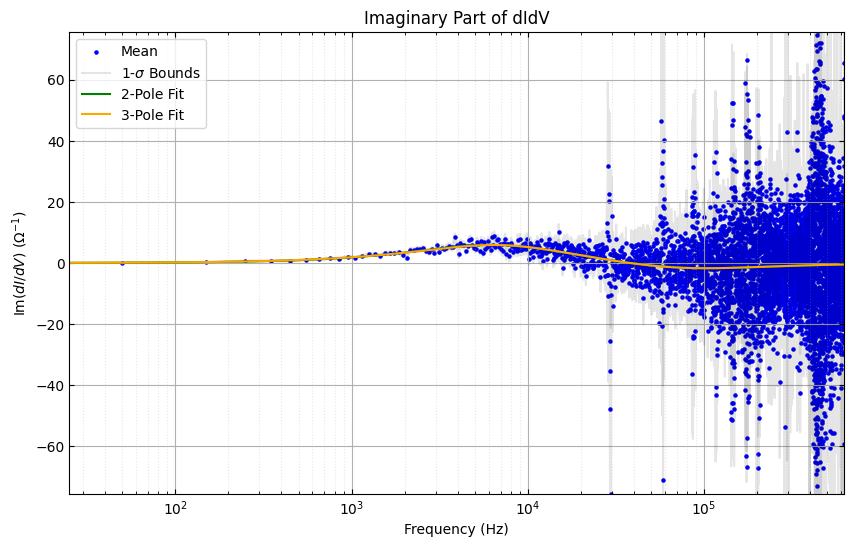


Mv4025pcBF1mmRight dIdV 2-poles Fit Result:
Fit chi2/Ndof = 0.257

Fit time constants, NOT dIdV Poles: 
Tau1: 1.52e-05 s
Tau2: 2.46e-06 s
Tau3: 0 s
 

True dIdV Poles: 
Tau_plus: 3.4e-06 s
Tau_minus: 2.19e-05 s
Tau_third: 0 s

Mv4025pcBF1mmRight dIdV 3-poles Fit Result:
Fit chi2/Ndof = 0.257

Fit time constants, NOT dIdV Poles: 
Tau1: 1.52e-05 s
Tau2: 2.53e-06 s
Tau3: 0.0004148 s
 

True dIdV Poles: 
Tau_plus: 3.56e-06 s
Tau_minus: 2.09e-05 s
Tau_third: 0.0004212 s

Mv4025pcBF1mmRight dIdV Fit Plots:


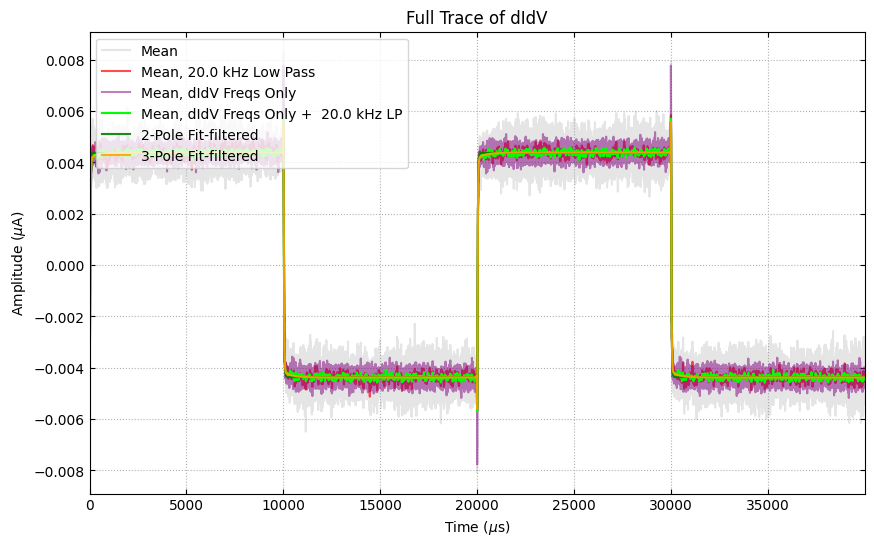

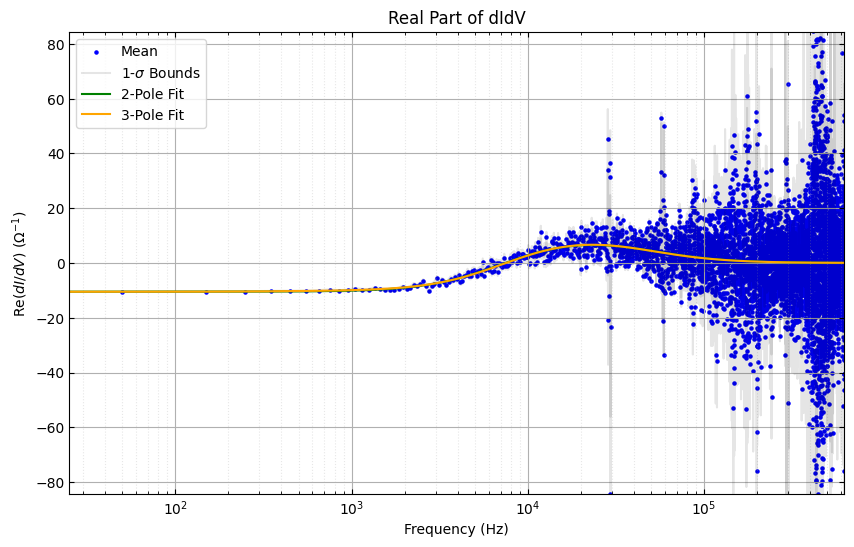

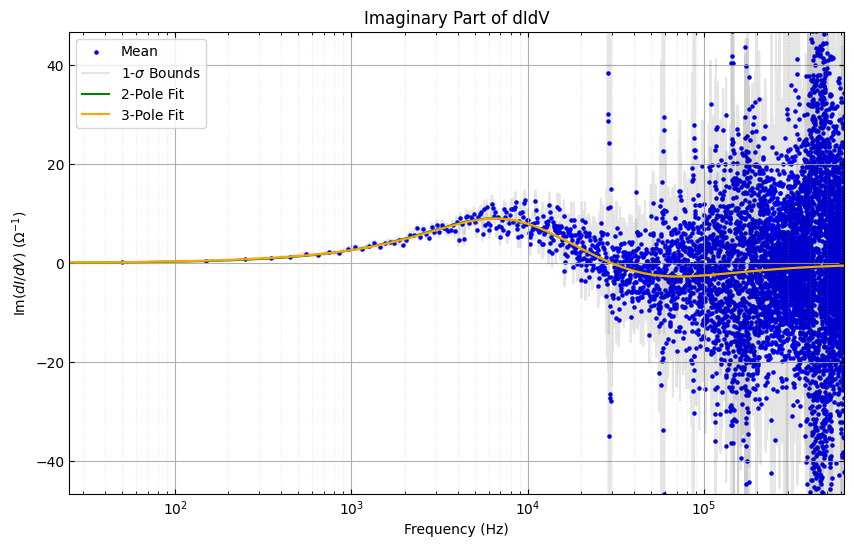

INFO: Saving filter/TES data to file ./didvnoise_20250206_090218_pre.hdf5! (overwrite=True)
INFO: Calculating small signal parameters uncertainties for channel Mv4025pcBF4mmLeft
INFO: Calculating small signal parameters for 2-poles model 
INFO: Calculating small signal parameters for 3-poles model 
INFO: Calculating small signal parameters uncertainties for channel Mv4025pcBF4mmRight
INFO: Calculating small signal parameters for 2-poles model 
INFO: Calculating small signal parameters for 3-poles model 
INFO: Calculating small signal parameters uncertainties for channel Mv4025pcBF1mmLeft
INFO: Calculating small signal parameters for 2-poles model 
INFO: Calculating small signal parameters for 3-poles model 
INFO: Calculating small signal parameters uncertainties for channel Mv4025pcBF1mmRight
INFO: Calculating small signal parameters for 2-poles model 
INFO: Calculating small signal parameters for 3-poles model 
INFO: Saving filter/TES data to file ./didvnoise_20250206_090218_pre.hdf5!

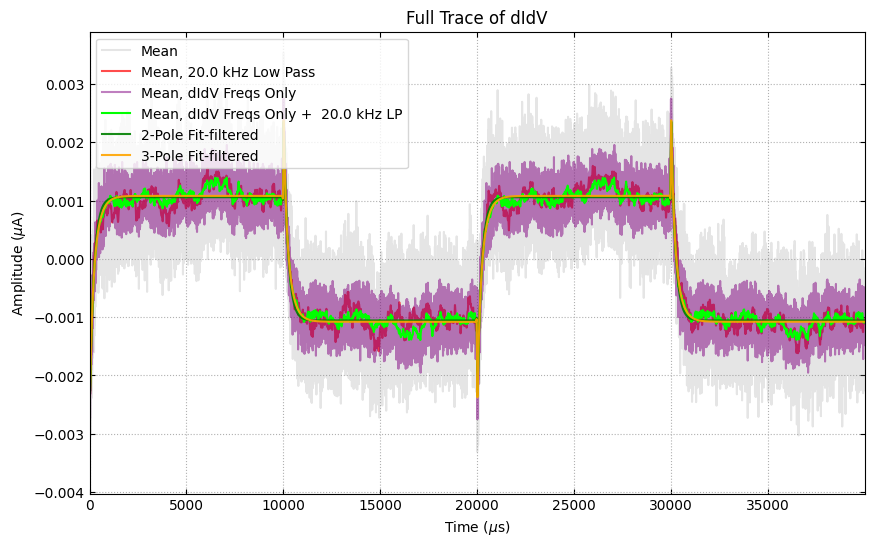

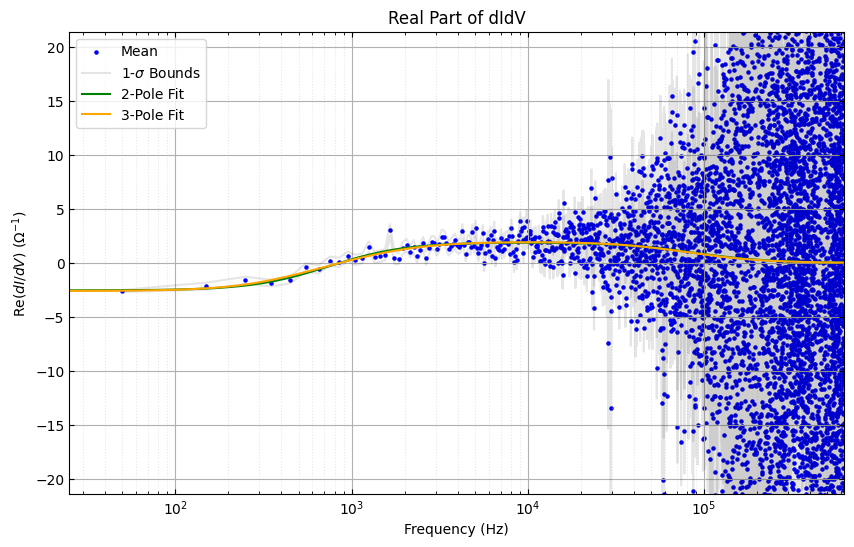

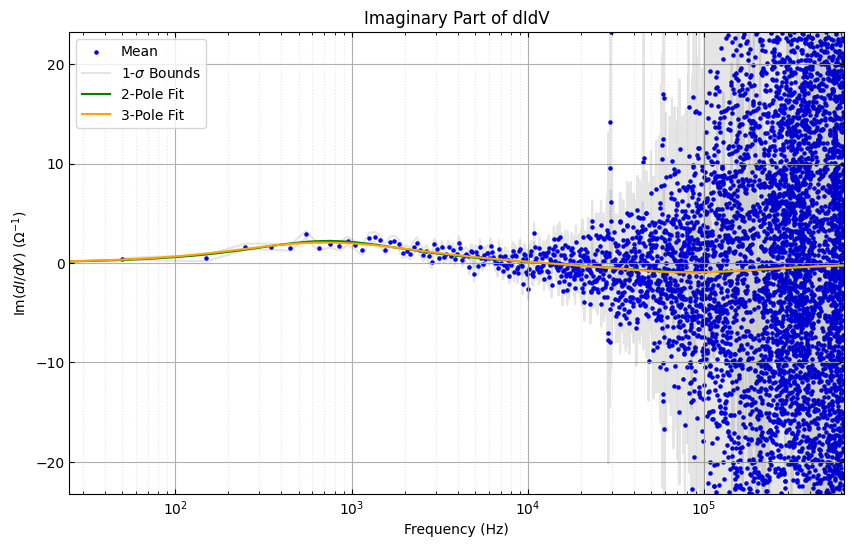


Mv4025pcBF4mmRight dIdV 2-poles Fit Result:
Fit chi2/Ndof = 0.258

Fit time constants, NOT dIdV Poles: 
Tau1: 0.000417 s
Tau2: 1.33e-06 s
Tau3: 0 s
 

True dIdV Poles: 
Tau_plus: 1.34e-06 s
Tau_minus: 0.000202 s
Tau_third: 0 s

Mv4025pcBF4mmRight dIdV 3-poles Fit Result:
Fit chi2/Ndof = 0.258

Fit time constants, NOT dIdV Poles: 
Tau1: 0.00042 s
Tau2: 1.33e-06 s
Tau3: 0.006147 s
 

True dIdV Poles: 
Tau_plus: 1.35e-06 s
Tau_minus: 0.000197 s
Tau_third: 0.006563 s

Mv4025pcBF4mmRight dIdV Fit Plots:


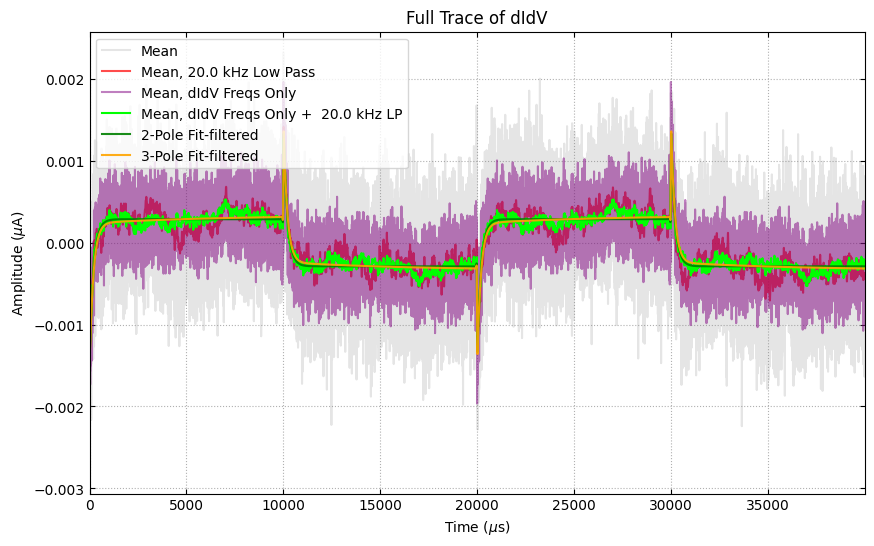

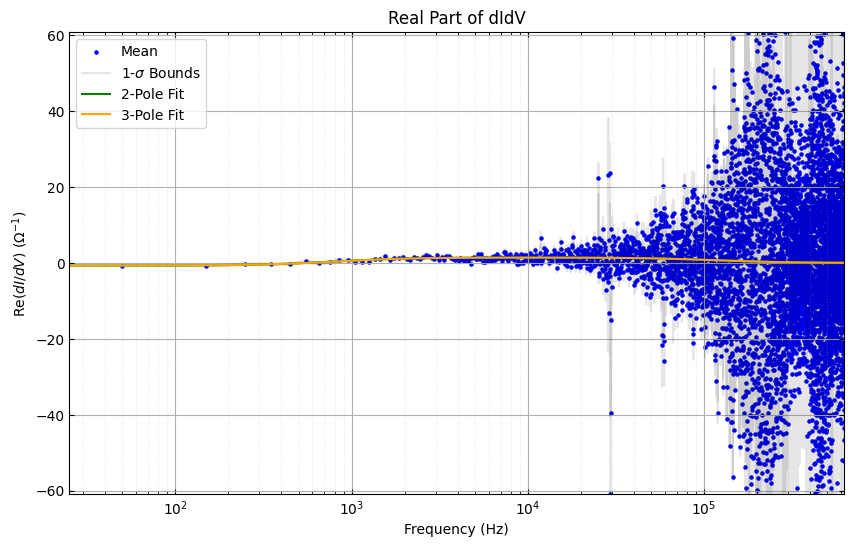

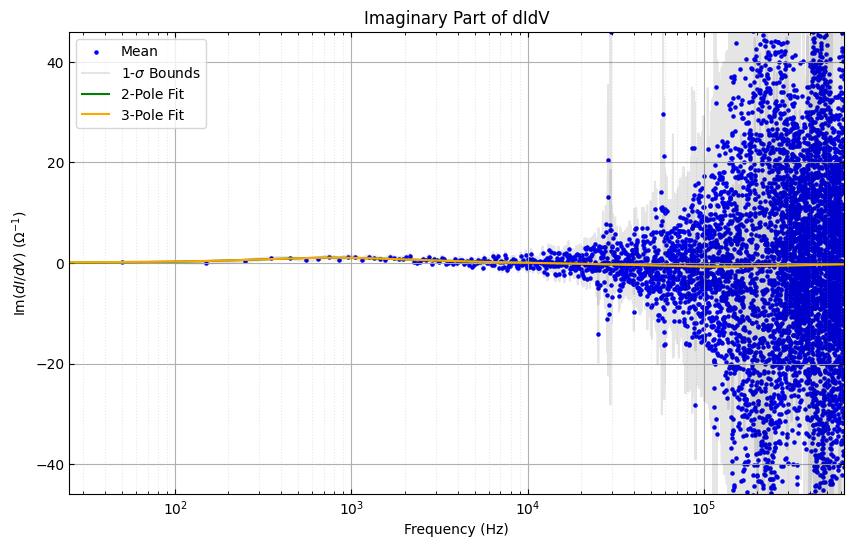


Mv4025pcBF1mmLeft dIdV 2-poles Fit Result:
Fit chi2/Ndof = 0.252

Fit time constants, NOT dIdV Poles: 
Tau1: 1.94e-05 s
Tau2: 2.07e-06 s
Tau3: 0 s
 

True dIdV Poles: 
Tau_plus: 2.49e-06 s
Tau_minus: 3.33e-05 s
Tau_third: 0 s

Mv4025pcBF1mmLeft dIdV 3-poles Fit Result:
Fit chi2/Ndof = 0.252

Fit time constants, NOT dIdV Poles: 
Tau1: 1.97e-05 s
Tau2: 2.1e-06 s
Tau3: 0.001496 s
 

True dIdV Poles: 
Tau_plus: 2.53e-06 s
Tau_minus: 3.2e-05 s
Tau_third: 0.001559 s

Mv4025pcBF1mmLeft dIdV Fit Plots:


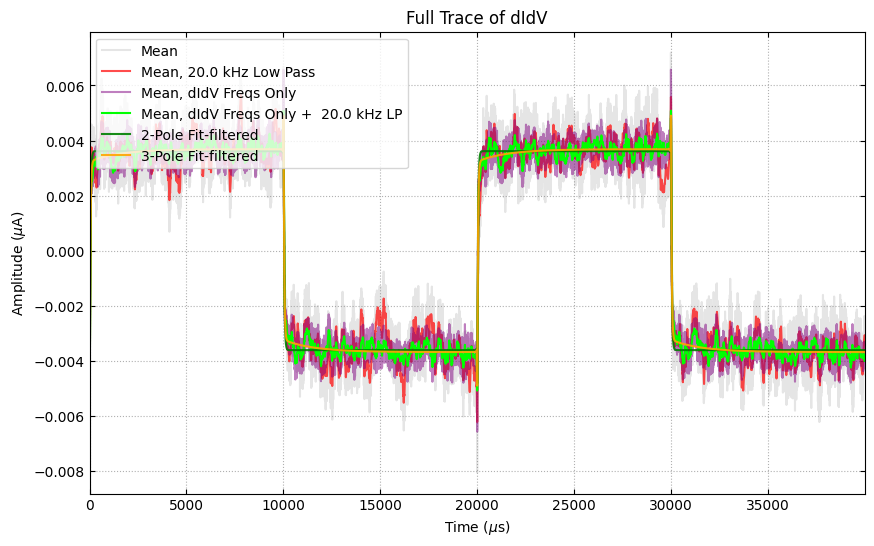

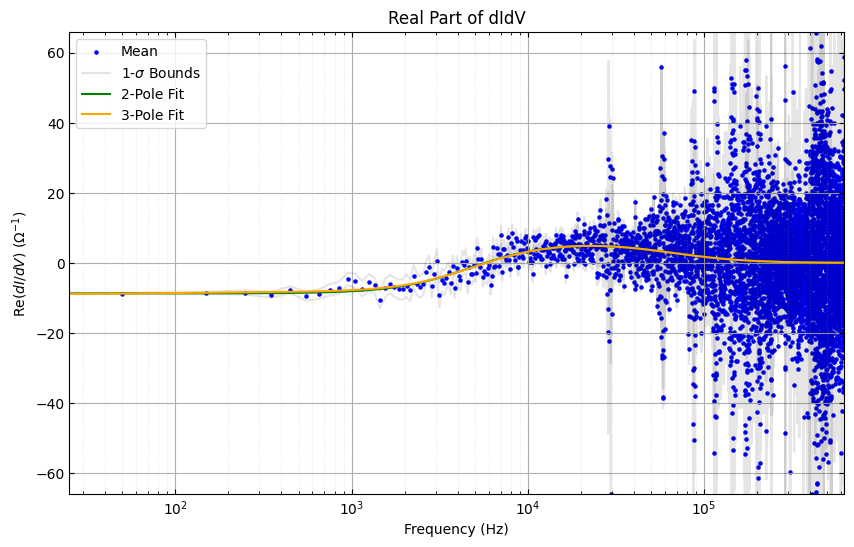

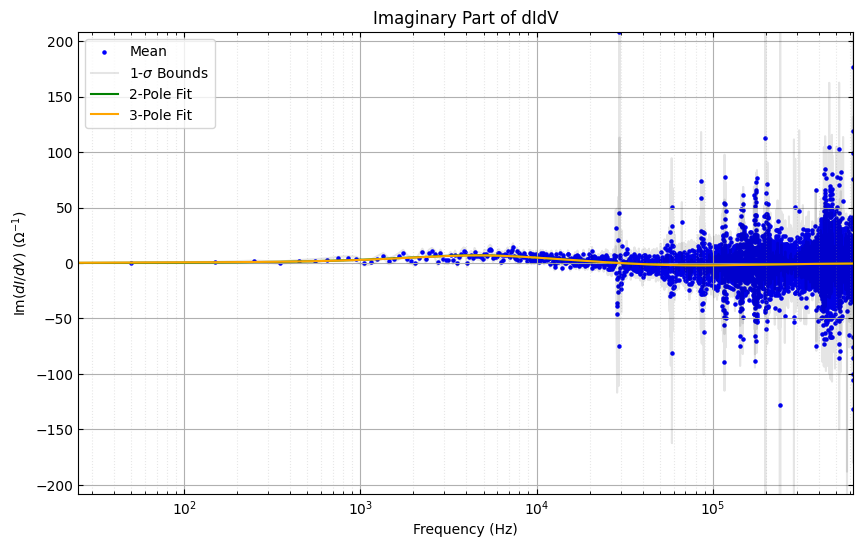


Mv4025pcBF1mmRight dIdV 2-poles Fit Result:
Fit chi2/Ndof = 0.258

Fit time constants, NOT dIdV Poles: 
Tau1: 2.28e-05 s
Tau2: 1.93e-06 s
Tau3: 0 s
 

True dIdV Poles: 
Tau_plus: 2.25e-06 s
Tau_minus: 3.23e-05 s
Tau_third: 0 s

Mv4025pcBF1mmRight dIdV 3-poles Fit Result:
Fit chi2/Ndof = 0.258

Fit time constants, NOT dIdV Poles: 
Tau1: 2.3e-05 s
Tau2: 1.94e-06 s
Tau3: 0.0007557 s
 

True dIdV Poles: 
Tau_plus: 2.27e-06 s
Tau_minus: 3.15e-05 s
Tau_third: 0.0007727 s

Mv4025pcBF1mmRight dIdV Fit Plots:


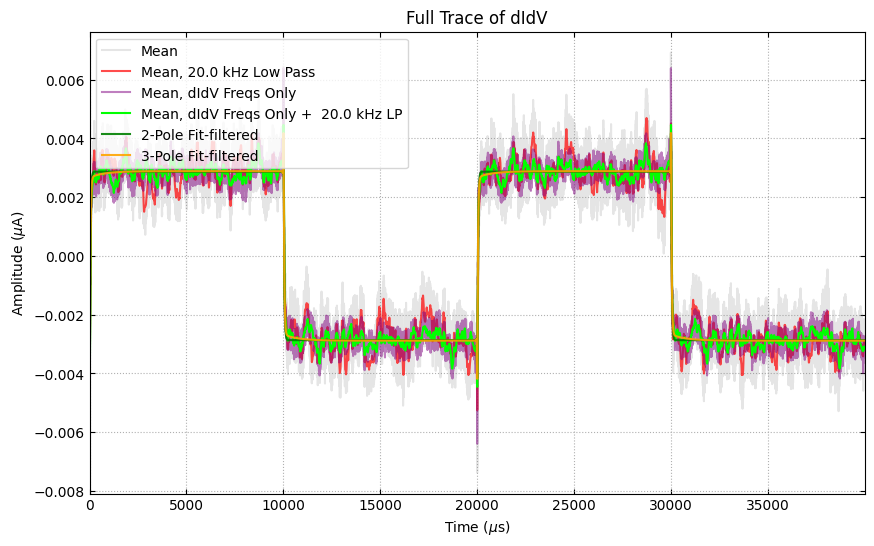

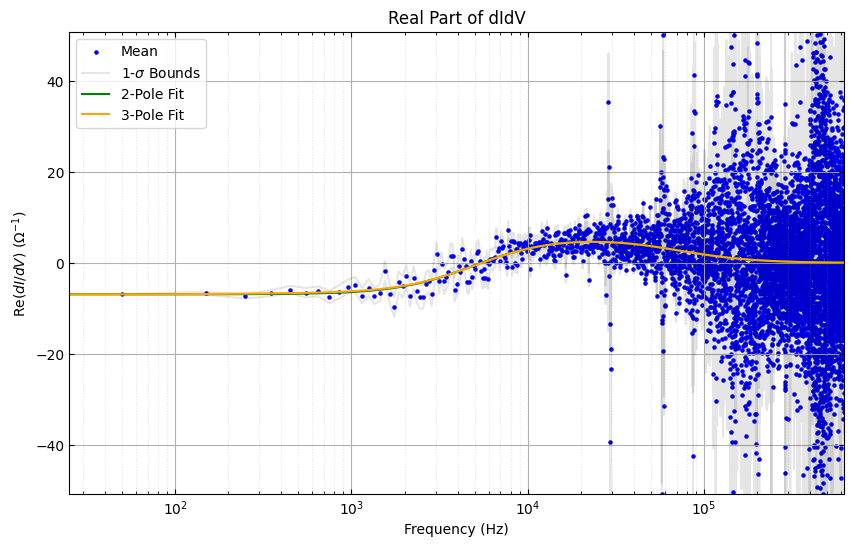

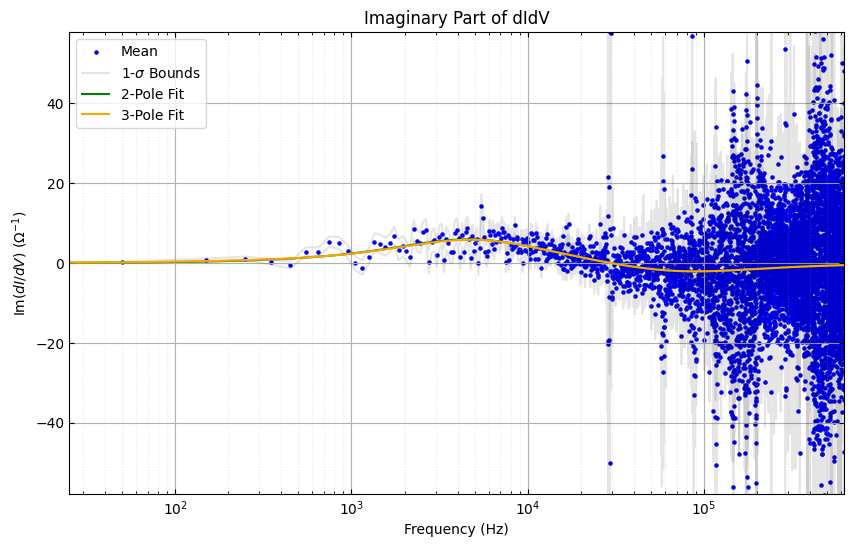

INFO: Saving filter/TES data to file ./didvnoise_20250206_202247_post.hdf5! (overwrite=True)
INFO: Calculating small signal parameters uncertainties for channel Mv4025pcBF4mmLeft
INFO: Calculating small signal parameters for 2-poles model 
INFO: Calculating small signal parameters for 3-poles model 
INFO: Calculating small signal parameters uncertainties for channel Mv4025pcBF4mmRight
INFO: Calculating small signal parameters for 2-poles model 
INFO: Calculating small signal parameters for 3-poles model 
INFO: Calculating small signal parameters uncertainties for channel Mv4025pcBF1mmLeft
INFO: Calculating small signal parameters for 2-poles model 
INFO: Calculating small signal parameters for 3-poles model 
INFO: Calculating small signal parameters uncertainties for channel Mv4025pcBF1mmRight
INFO: Calculating small signal parameters for 2-poles model 
INFO: Calculating small signal parameters for 3-poles model 
INFO: Saving filter/TES data to file ./didvnoise_20250206_202247_post.hdf

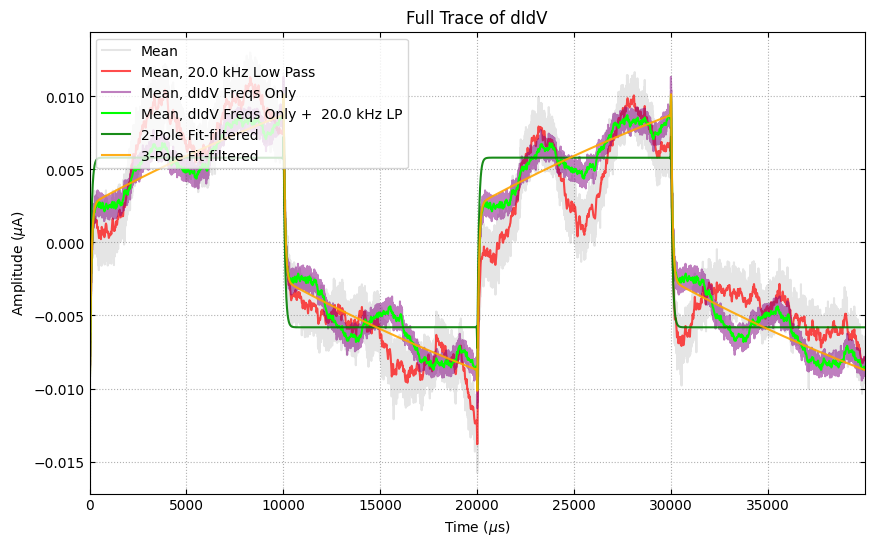

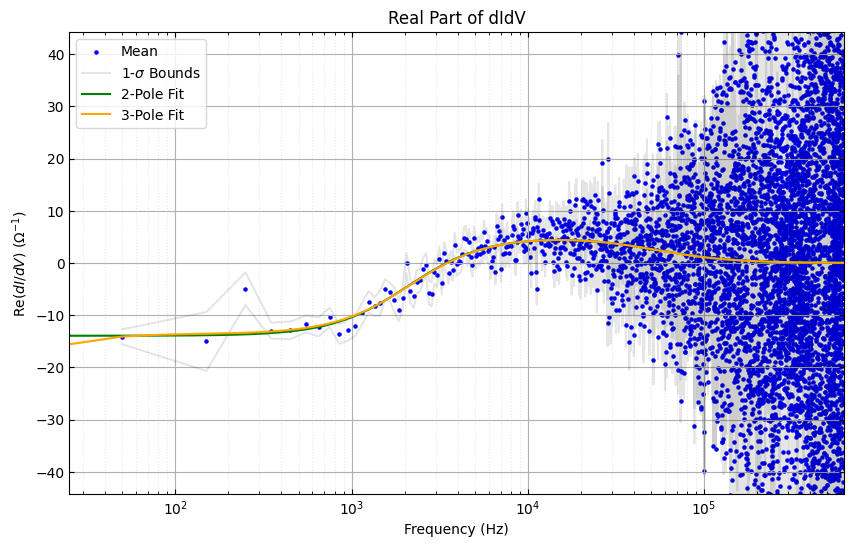

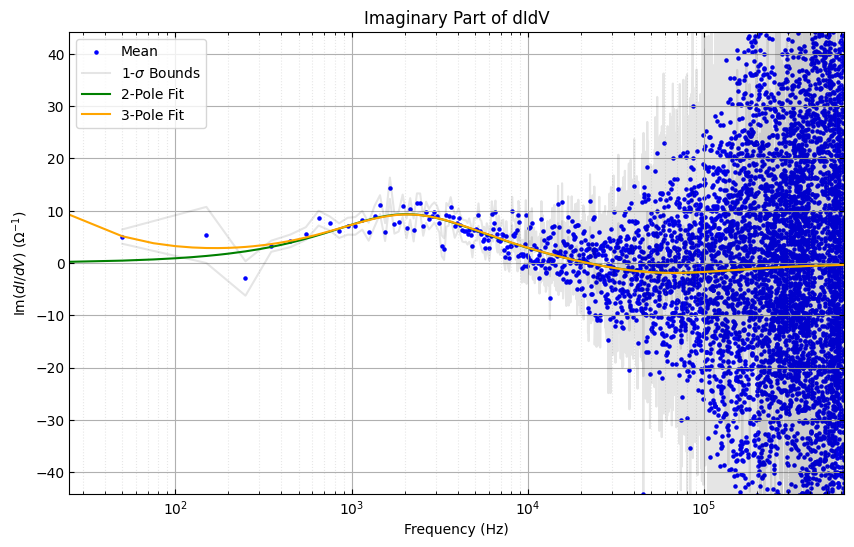


Mv4025pcBF4mmRight dIdV 2-poles Fit Result:
Fit chi2/Ndof = 0.254

Fit time constants, NOT dIdV Poles: 
Tau1: 2.22e-05 s
Tau2: 1.91e-06 s
Tau3: 0 s
 

True dIdV Poles: 
Tau_plus: 2.16e-06 s
Tau_minus: 6.2e-05 s
Tau_third: 0 s

Mv4025pcBF4mmRight dIdV 3-poles Fit Result:
Fit chi2/Ndof = 0.254

Fit time constants, NOT dIdV Poles: 
Tau1: 2.25e-05 s
Tau2: 2.2e-06 s
Tau3: 7.163e-05 s
 

True dIdV Poles: 
Tau_plus: 2.57e-06 s
Tau_minus: 3.87e-05 s
Tau_third: 0.0001045 s

Mv4025pcBF4mmRight dIdV Fit Plots:


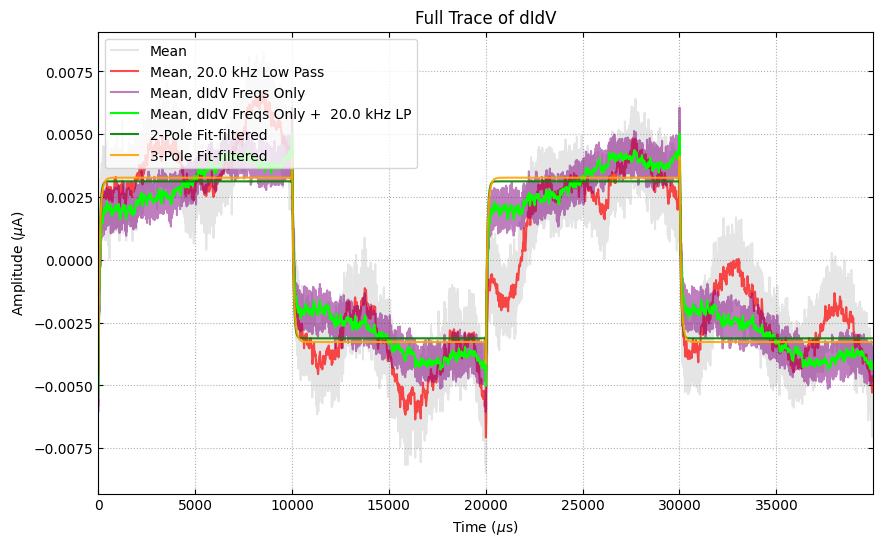

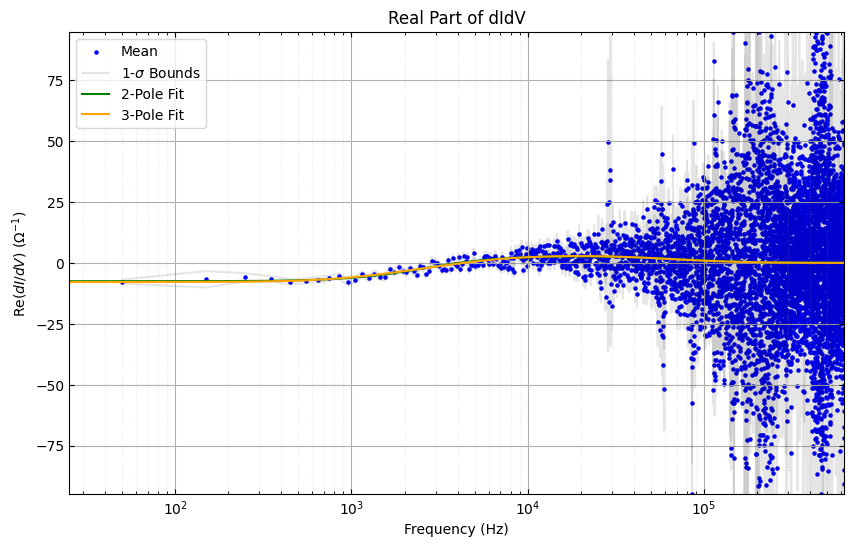

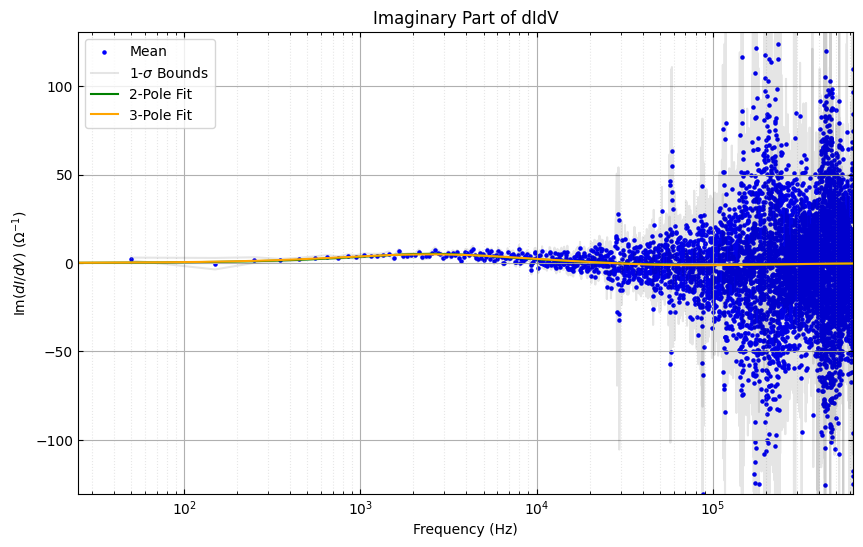


Mv4025pcBF1mmLeft dIdV 2-poles Fit Result:
Fit chi2/Ndof = 0.254

Fit time constants, NOT dIdV Poles: 
Tau1: 1.55e-05 s
Tau2: 2.2e-06 s
Tau3: 0 s
 

True dIdV Poles: 
Tau_plus: 2.83e-06 s
Tau_minus: 2.71e-05 s
Tau_third: 0 s

Mv4025pcBF1mmLeft dIdV 3-poles Fit Result:
Fit chi2/Ndof = 0.254

Fit time constants, NOT dIdV Poles: 
Tau1: 1.58e-05 s
Tau2: 2.35e-06 s
Tau3: 4.059e-05 s
 

True dIdV Poles: 
Tau_plus: 3.12e-06 s
Tau_minus: 2.23e-05 s
Tau_third: 4.626e-05 s

Mv4025pcBF1mmLeft dIdV Fit Plots:


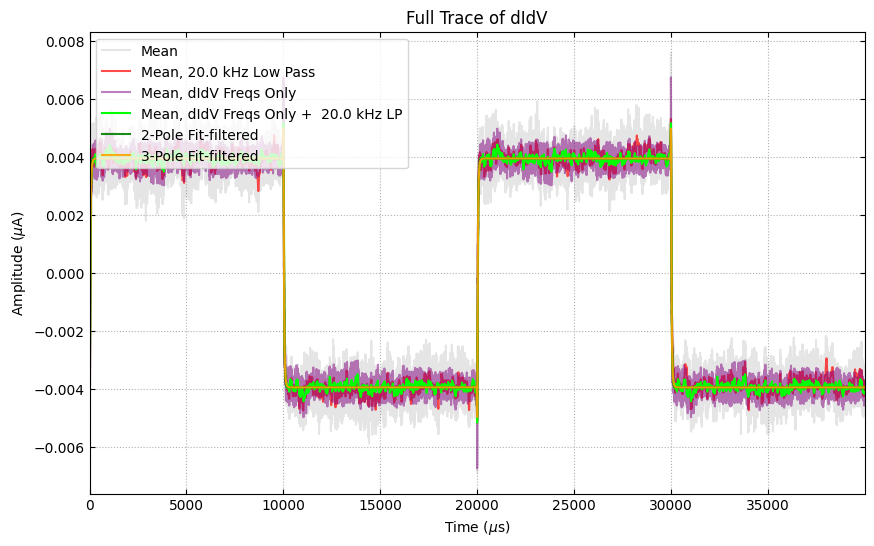

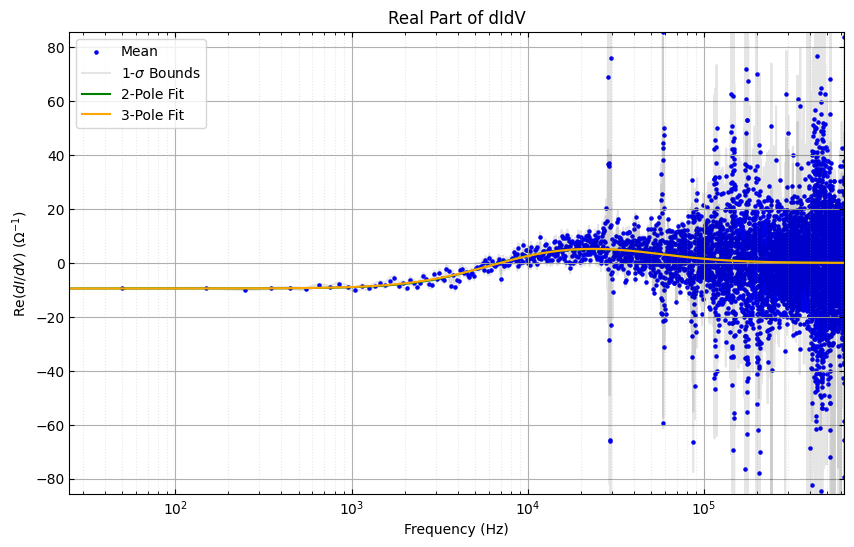

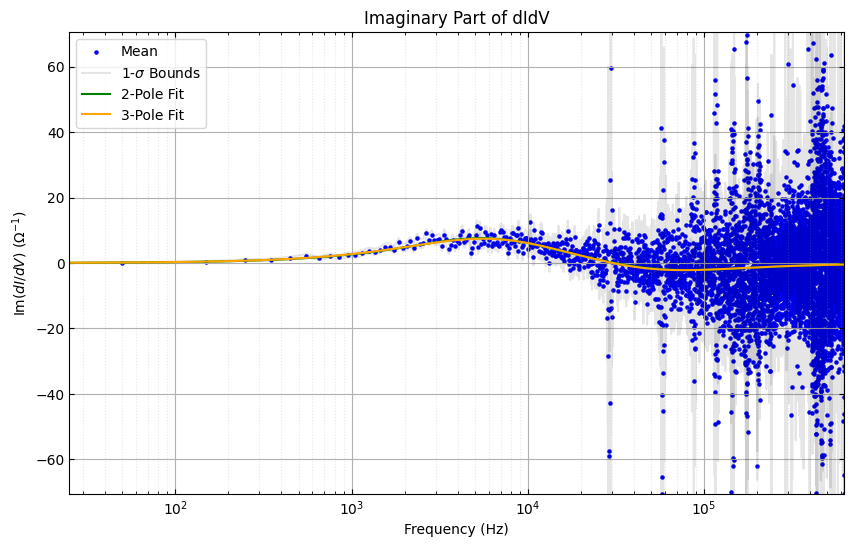


Mv4025pcBF1mmRight dIdV 2-poles Fit Result:
Fit chi2/Ndof = 0.254

Fit time constants, NOT dIdV Poles: 
Tau1: 1.61e-05 s
Tau2: 1.72e-06 s
Tau3: 0 s
 

True dIdV Poles: 
Tau_plus: 2.09e-06 s
Tau_minus: 2.6e-05 s
Tau_third: 0 s

Mv4025pcBF1mmRight dIdV 3-poles Fit Result:
Fit chi2/Ndof = 0.254

Fit time constants, NOT dIdV Poles: 
Tau1: 1.67e-05 s
Tau2: 1.97e-06 s
Tau3: 3.463e-05 s
 

True dIdV Poles: 
Tau_plus: 2.5e-06 s
Tau_minus: 1.87e-05 s
Tau_third: 4.337e-05 s

Mv4025pcBF1mmRight dIdV Fit Plots:


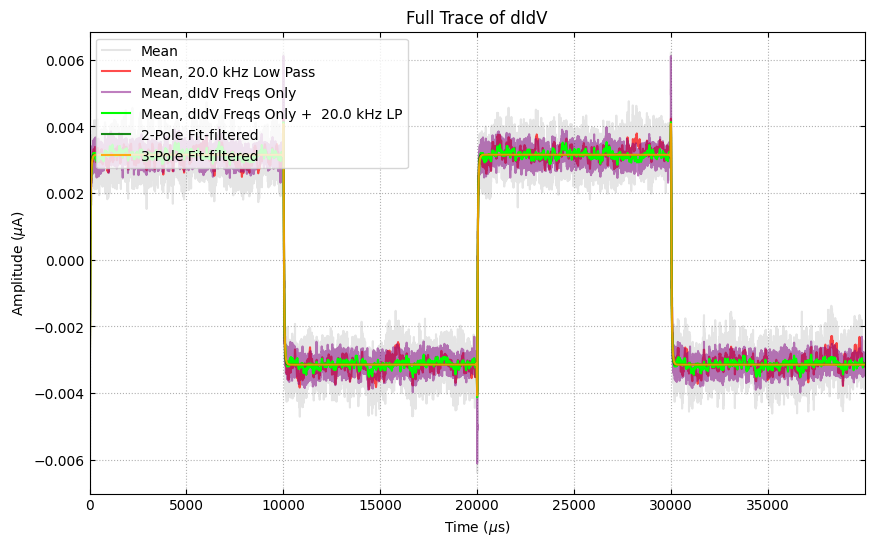

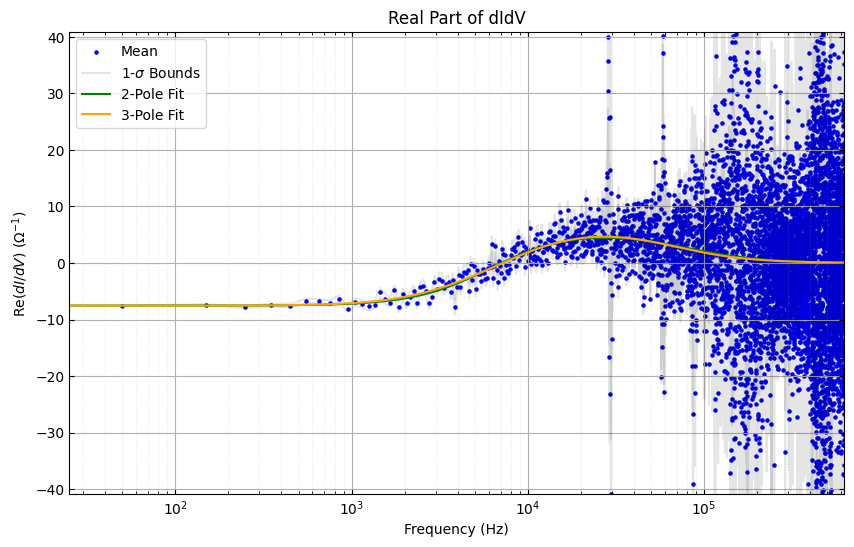

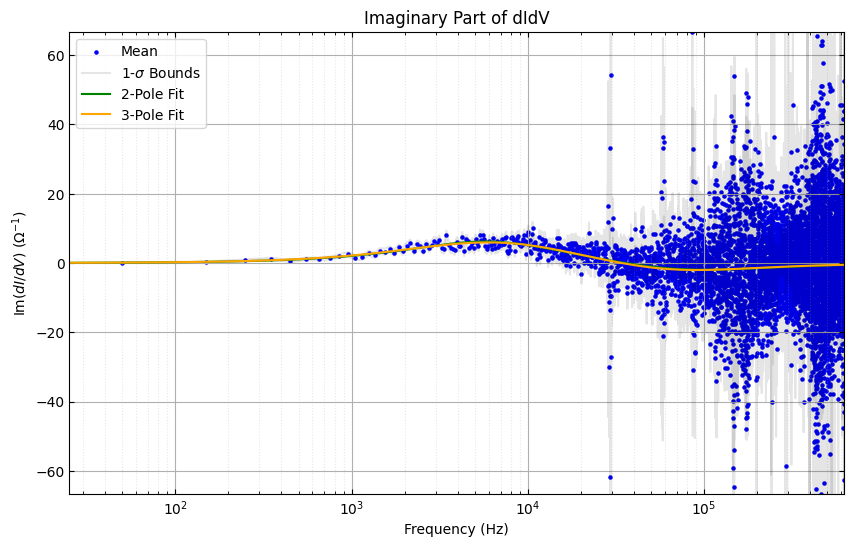

INFO: Saving filter/TES data to file ./didvnoise_20250207_190322_post.hdf5! (overwrite=True)
INFO: Calculating small signal parameters uncertainties for channel Mv4025pcBF4mmLeft
INFO: Calculating small signal parameters for 2-poles model 
INFO: Calculating small signal parameters for 3-poles model 
INFO: Calculating small signal parameters uncertainties for channel Mv4025pcBF4mmRight
INFO: Calculating small signal parameters for 2-poles model 
INFO: Calculating small signal parameters for 3-poles model 
INFO: Calculating small signal parameters uncertainties for channel Mv4025pcBF1mmLeft
INFO: Calculating small signal parameters for 2-poles model 
INFO: Calculating small signal parameters for 3-poles model 
INFO: Calculating small signal parameters uncertainties for channel Mv4025pcBF1mmRight
INFO: Calculating small signal parameters for 2-poles model 
INFO: Calculating small signal parameters for 3-poles model 
INFO: Saving filter/TES data to file ./didvnoise_20250207_190322_post.hdf

In [70]:
didv_test_list = fit_didvs(raw_data_list, iv_list, noise_raw_list)

In [72]:
didvanalysis = DIDVAnalysis(verbose=True)
didvanalysis.load_hdf5('/sdata1/runs/run58/filterdata/didvnoise_20250207_190322_post.hdf5', overwrite=False)

INFO: Loading filter data from file /sdata1/runs/run58/filterdata/didvnoise_20250207_190322_post.hdf5


INFO: Loading filter data from file ~/processing/run58/filterdata/noise_20250206_090218_pre.hdf5
INFO: Loading filter data from file ./didvnoise_20250206_090218_pre.hdf5


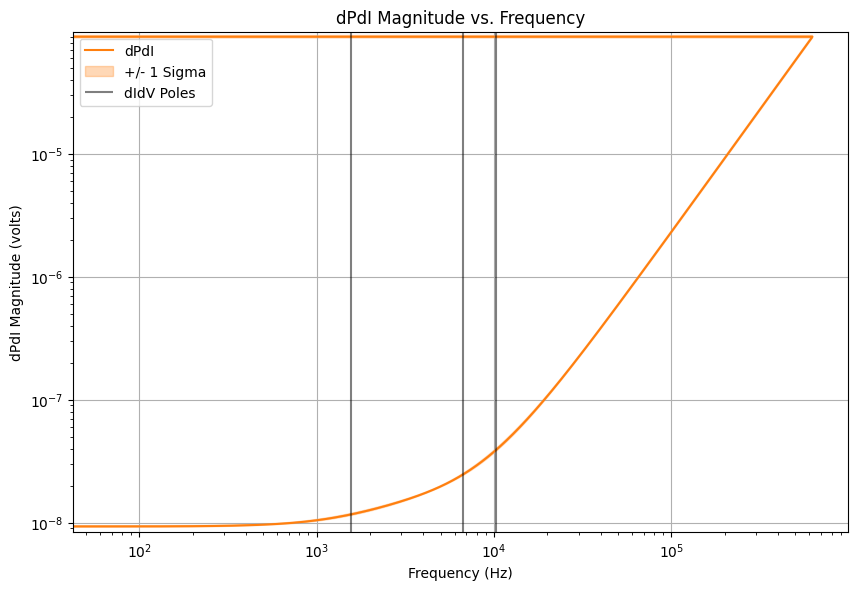

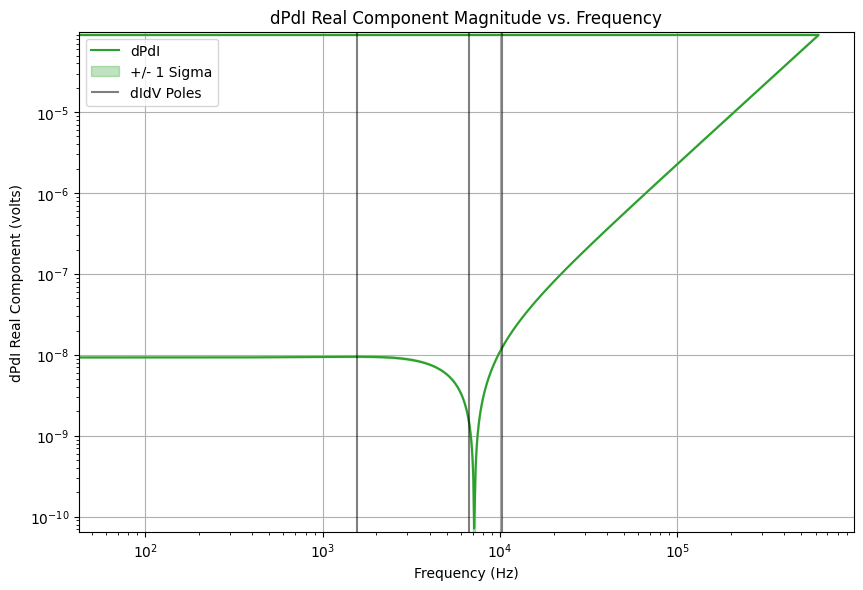

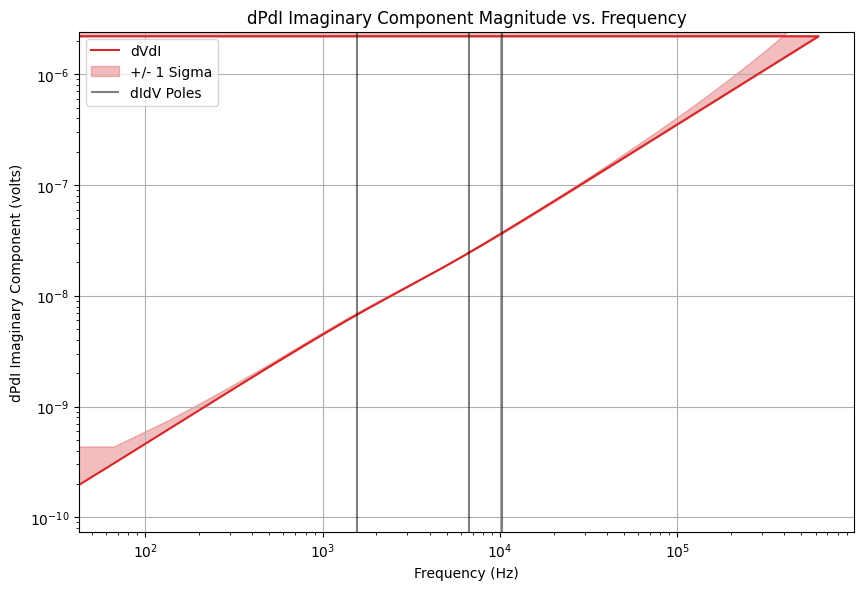

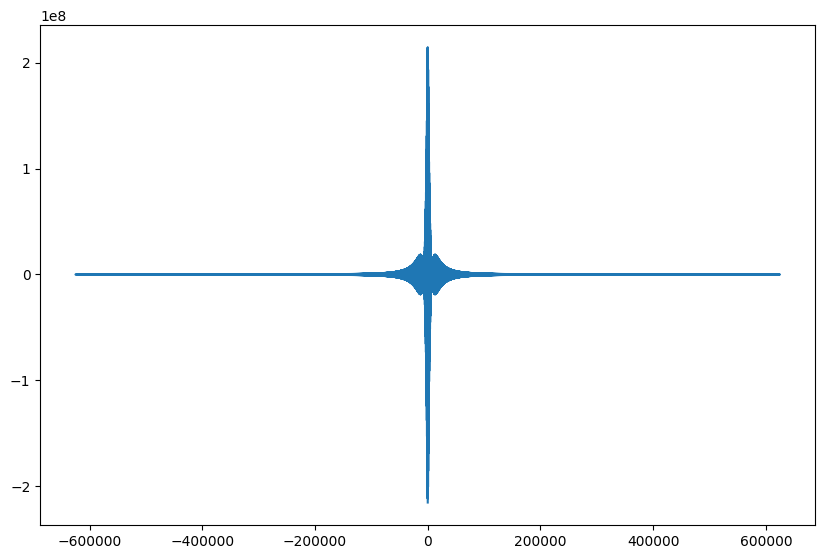

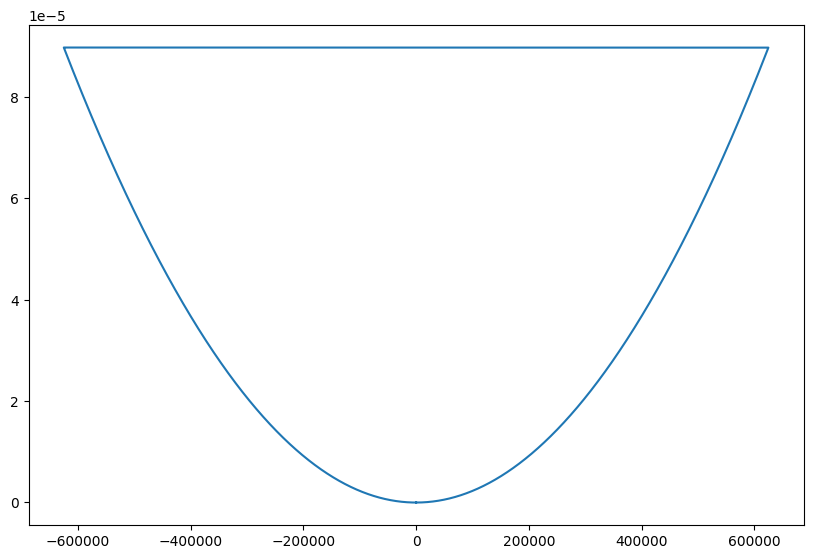

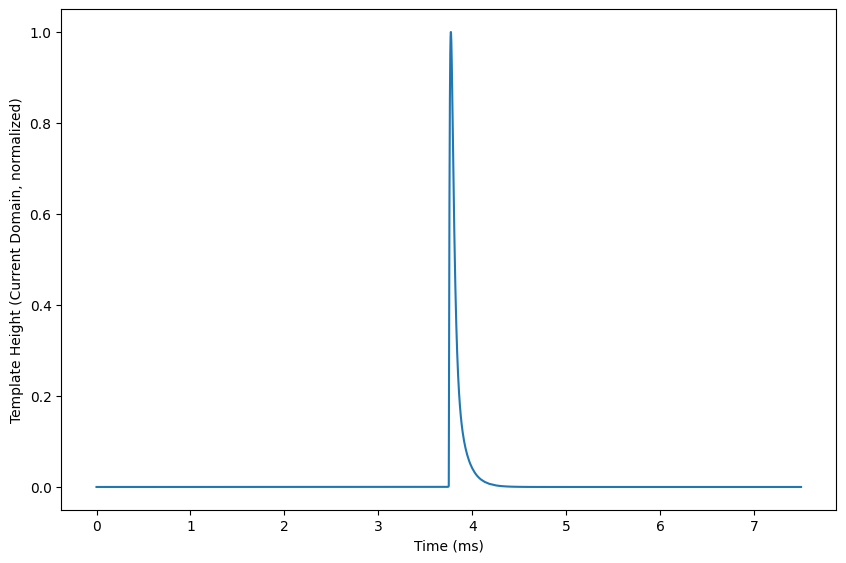

INFO: Saving filter/TES data to file ~/processing/run58/filterdata/noise_20250206_090218_pre.hdf5! (overwrite=True)


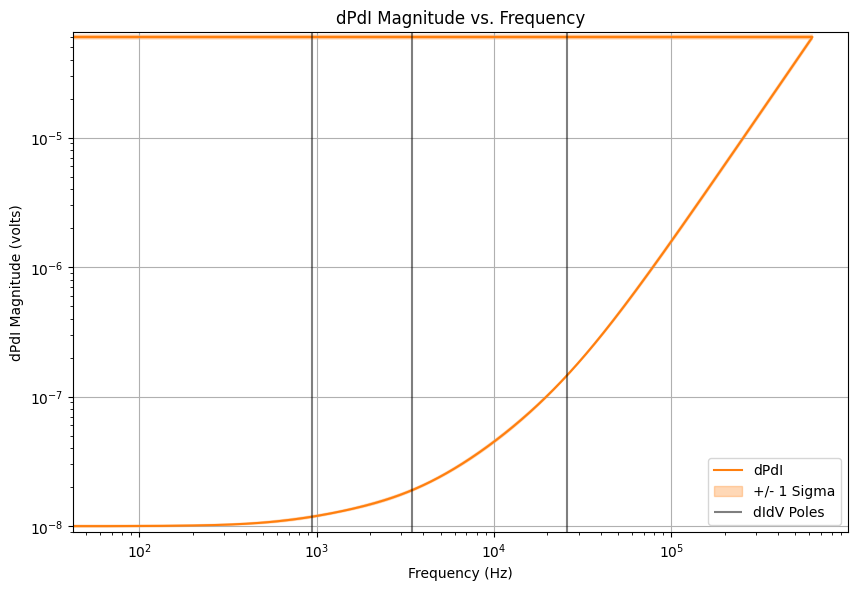

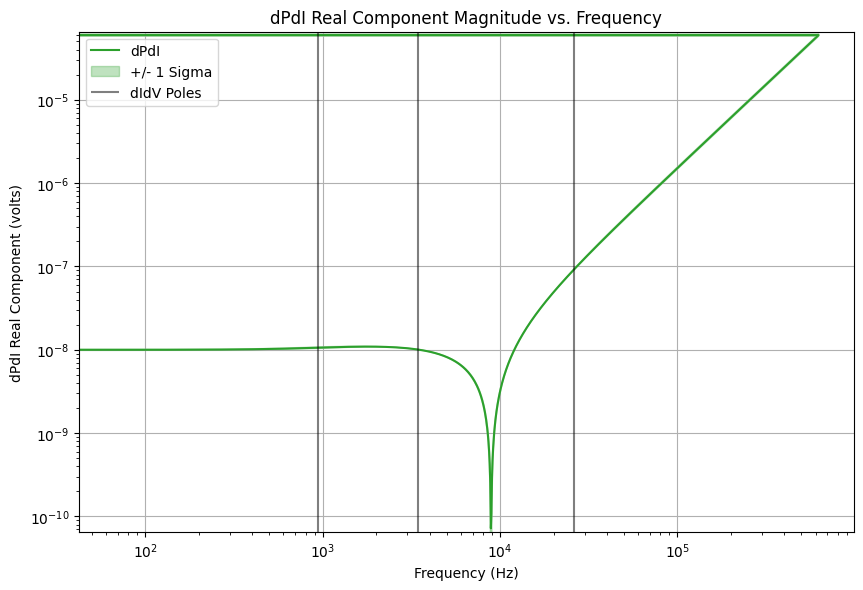

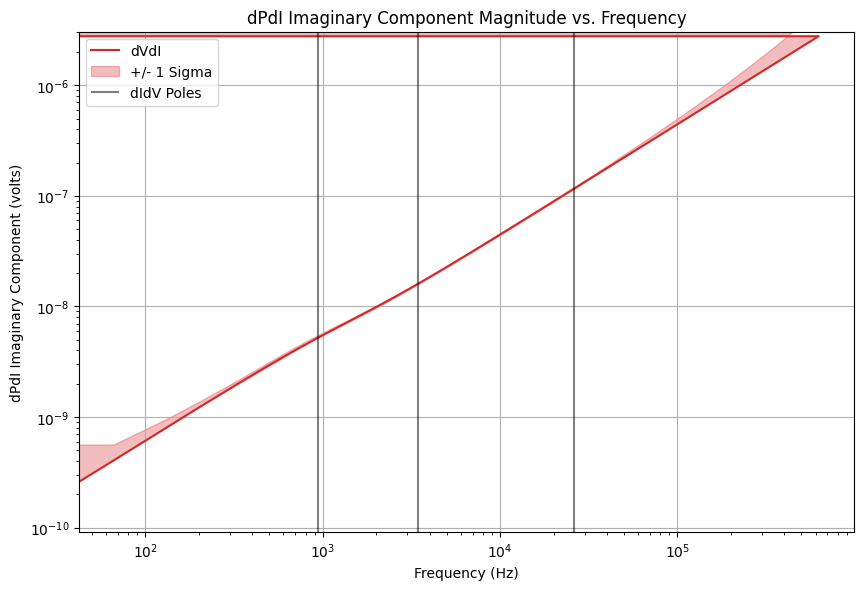

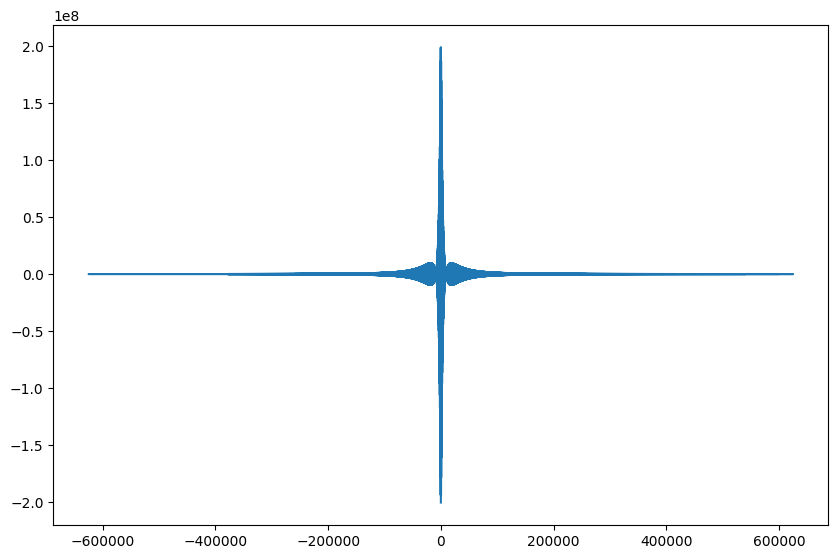

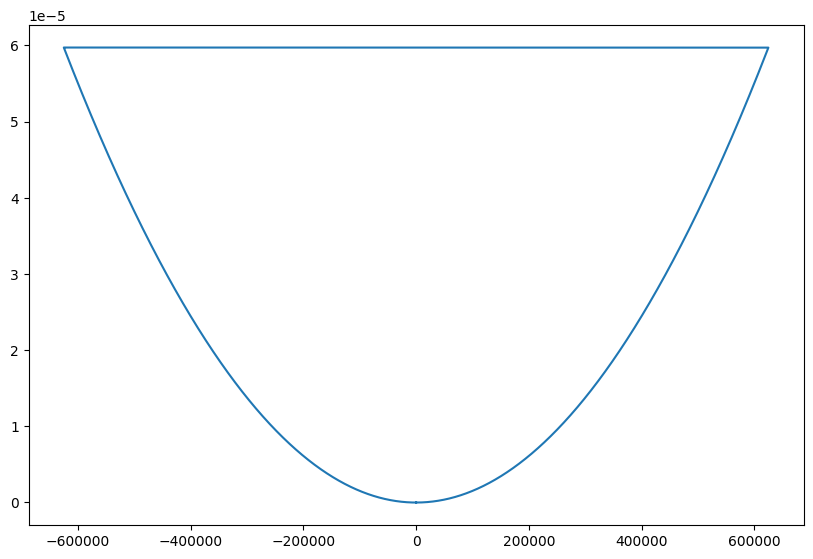

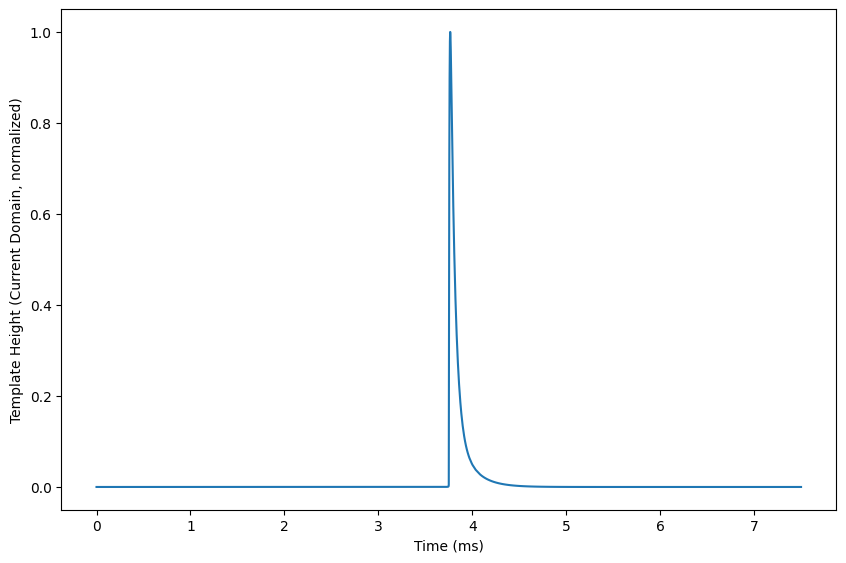

INFO: Saving filter/TES data to file ~/processing/run58/filterdata/noise_20250206_090218_pre.hdf5! (overwrite=True)


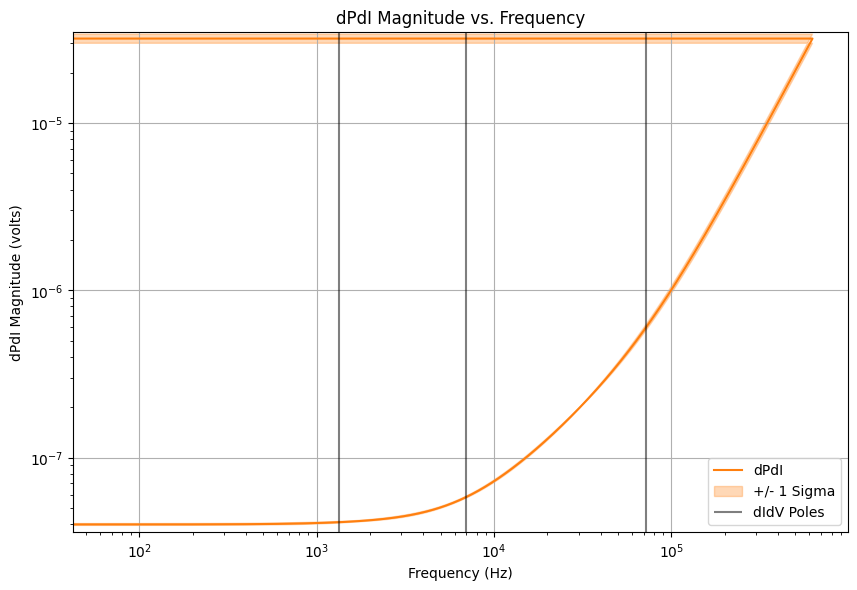

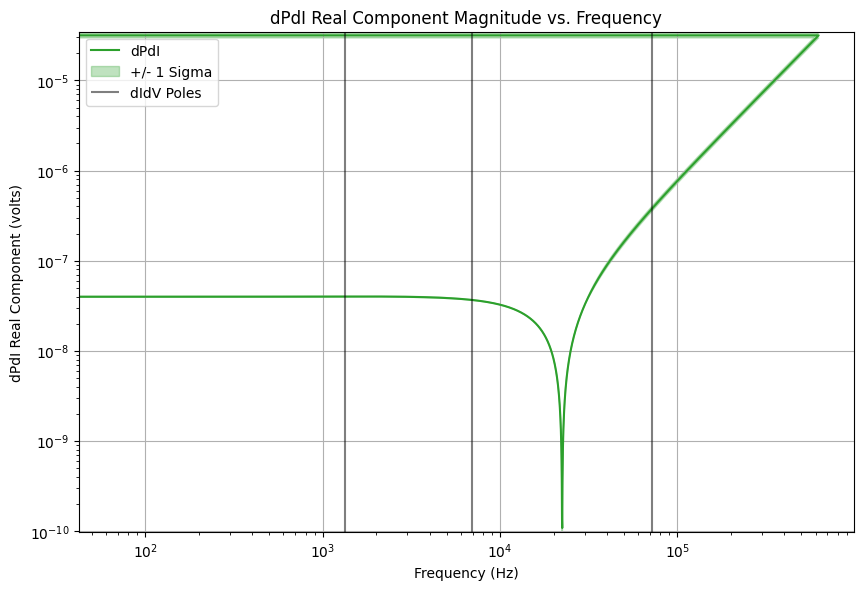

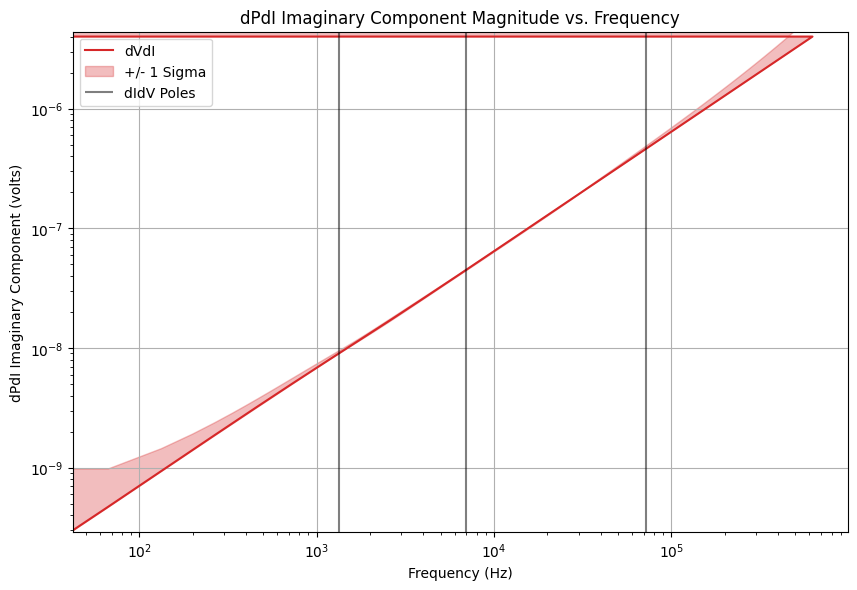

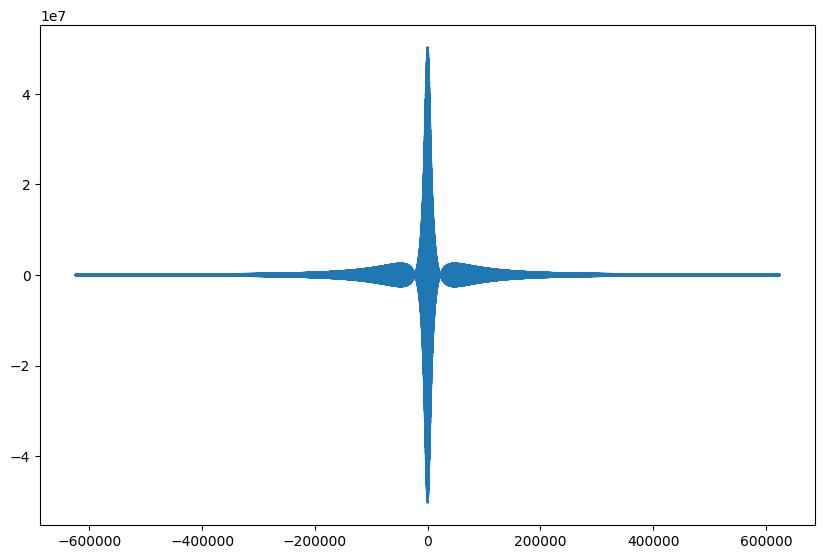

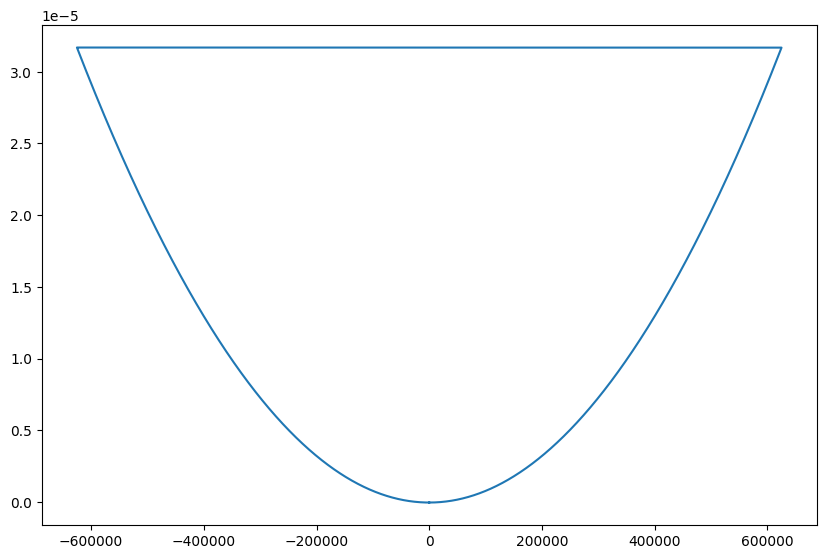

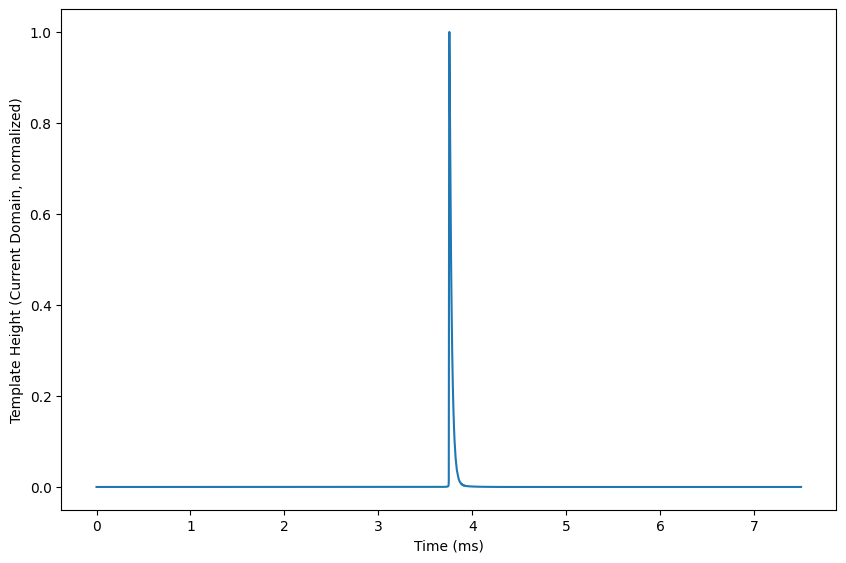

INFO: Saving filter/TES data to file ~/processing/run58/filterdata/noise_20250206_090218_pre.hdf5! (overwrite=True)


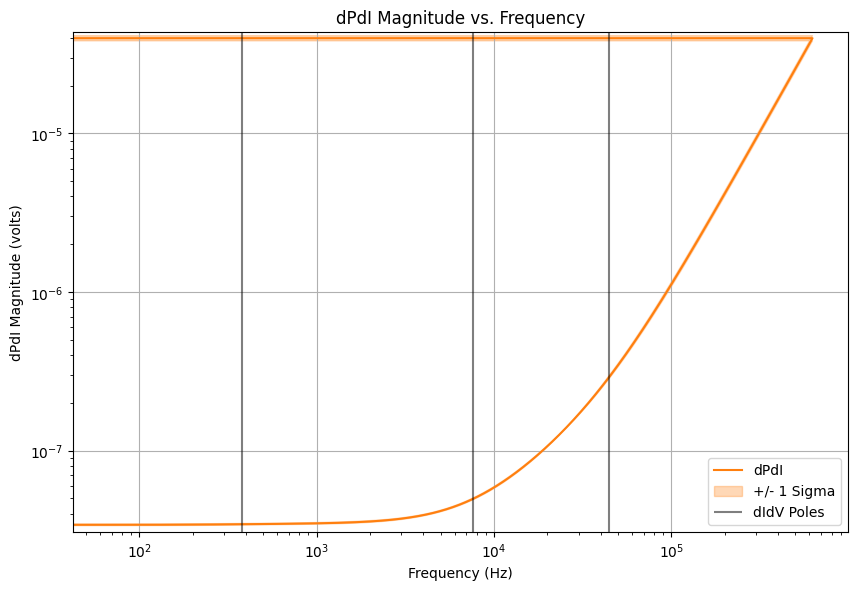

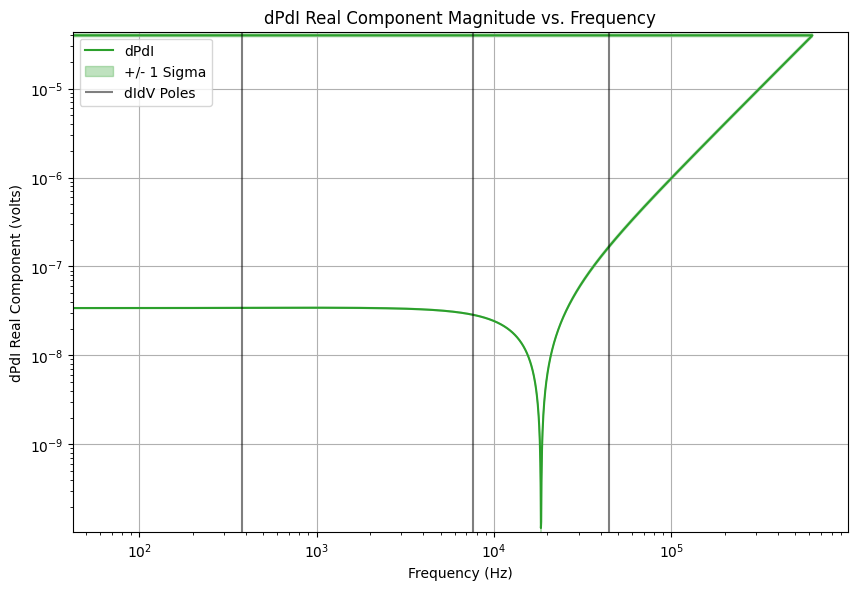

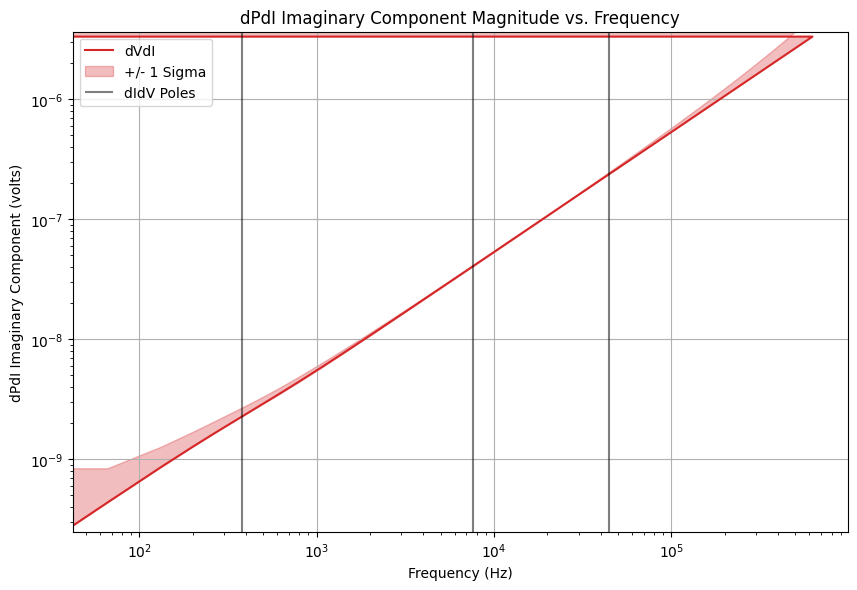

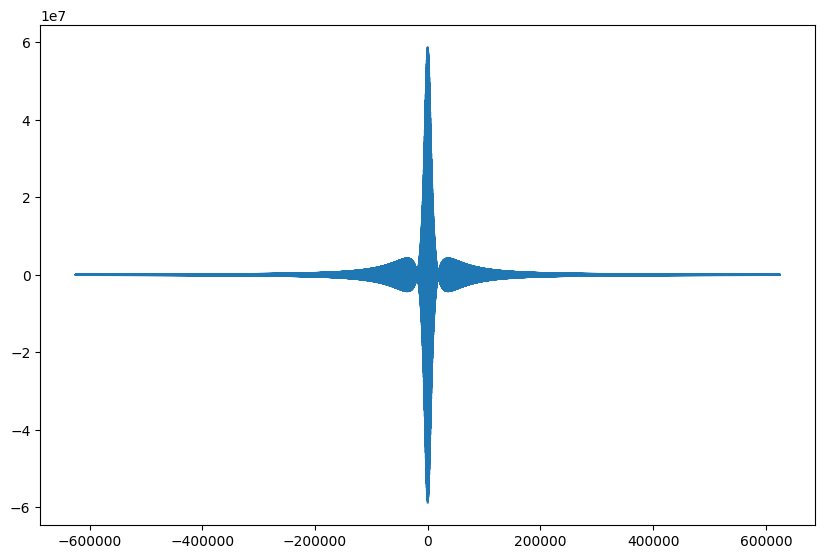

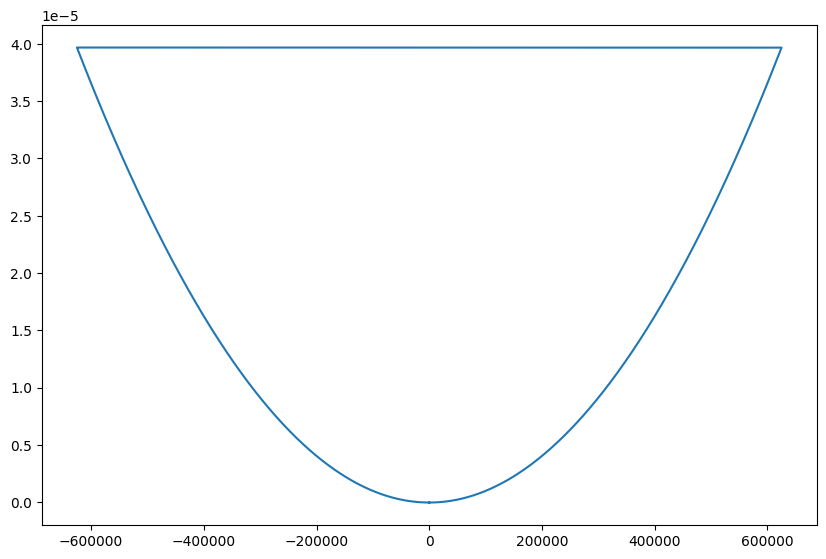

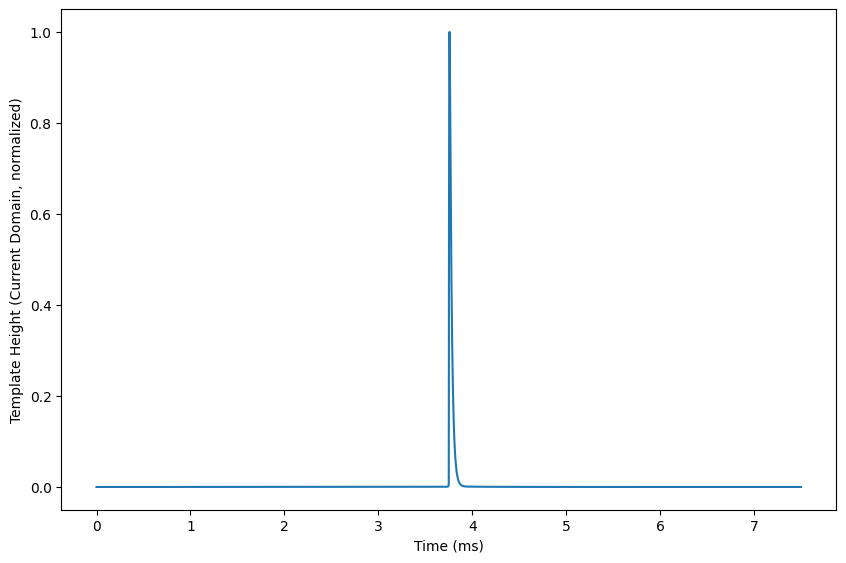

INFO: Saving filter/TES data to file ~/processing/run58/filterdata/noise_20250206_090218_pre.hdf5! (overwrite=True)
INFO: Loading filter data from file ~/processing/run58/filterdata/noise_20250206_202247_post.hdf5
INFO: Loading filter data from file ./didvnoise_20250206_202247_post.hdf5


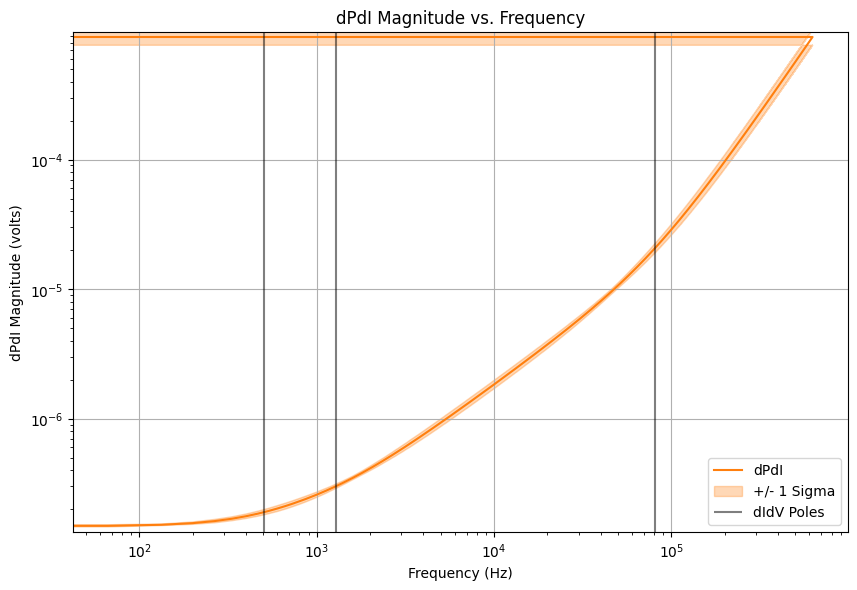

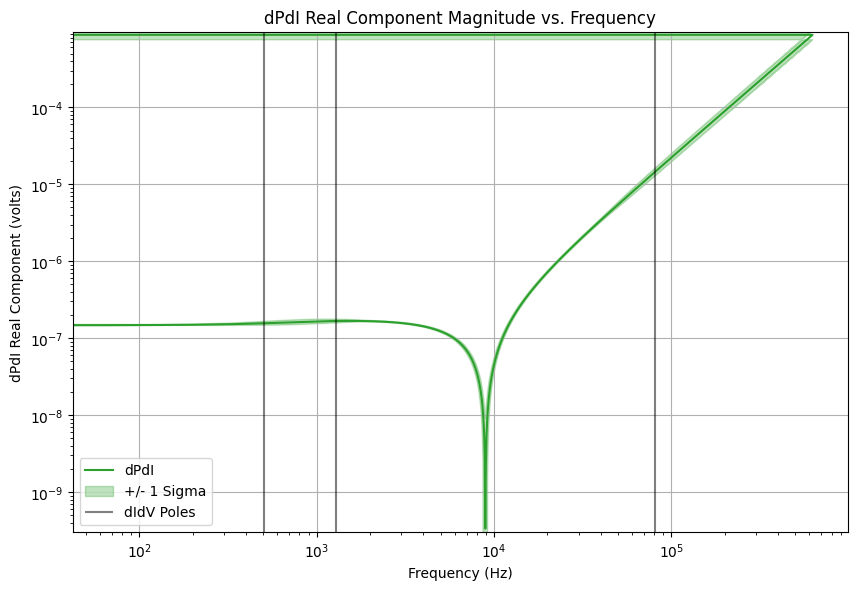

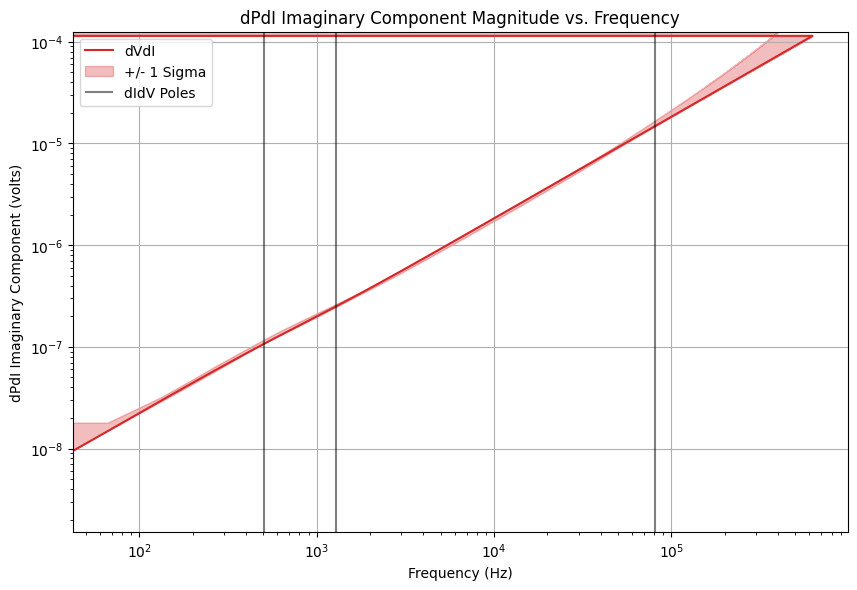

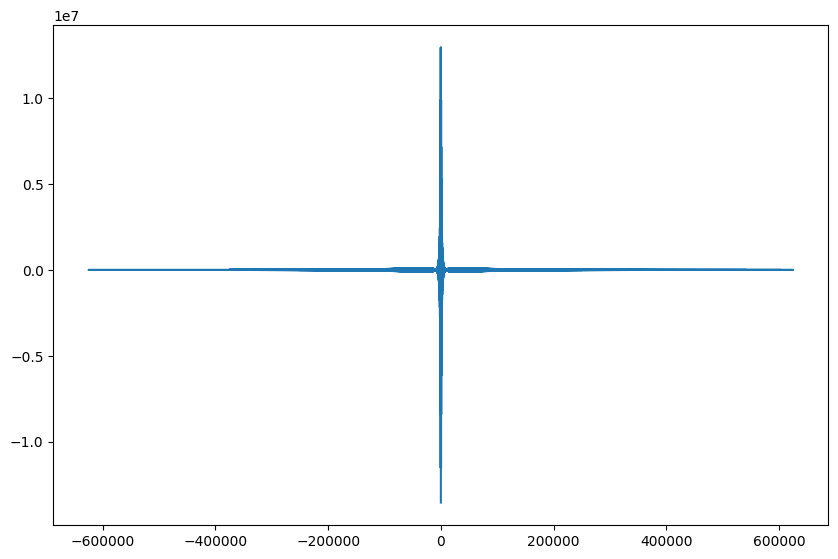

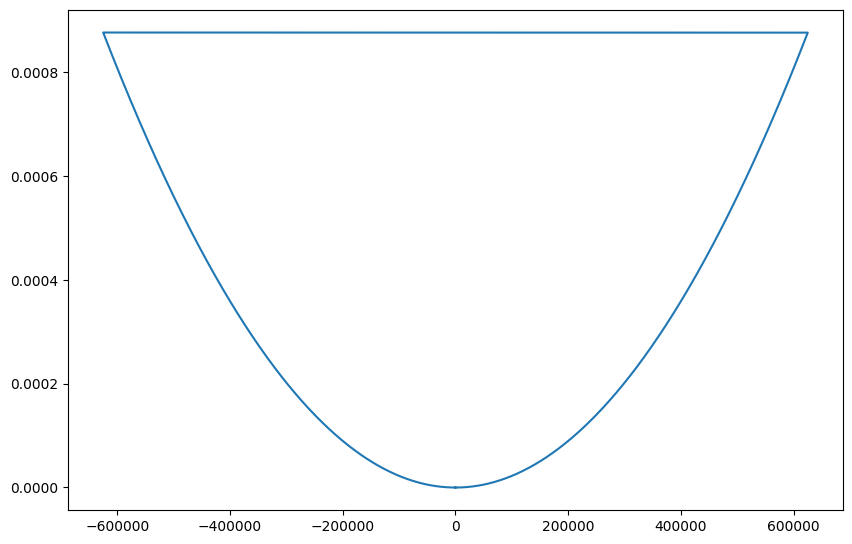

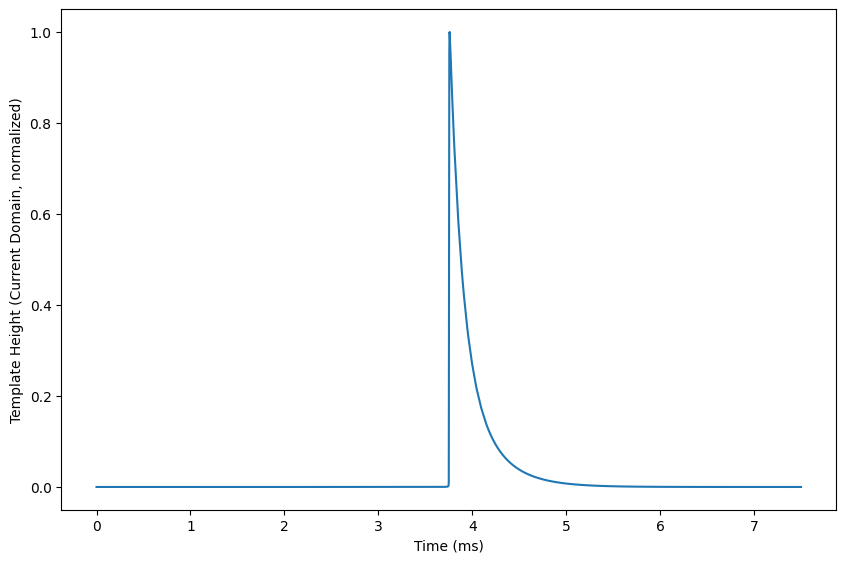

INFO: Saving filter/TES data to file ~/processing/run58/filterdata/noise_20250206_202247_post.hdf5! (overwrite=True)


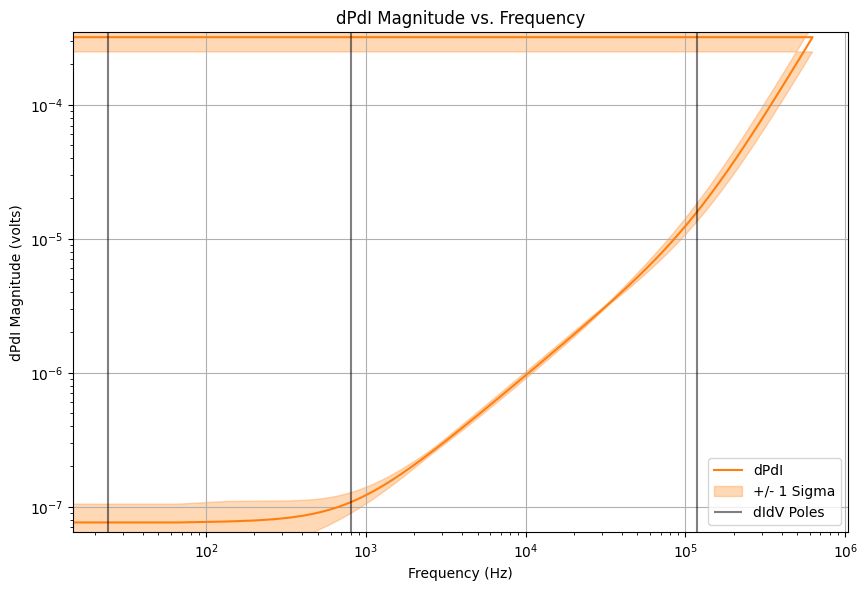

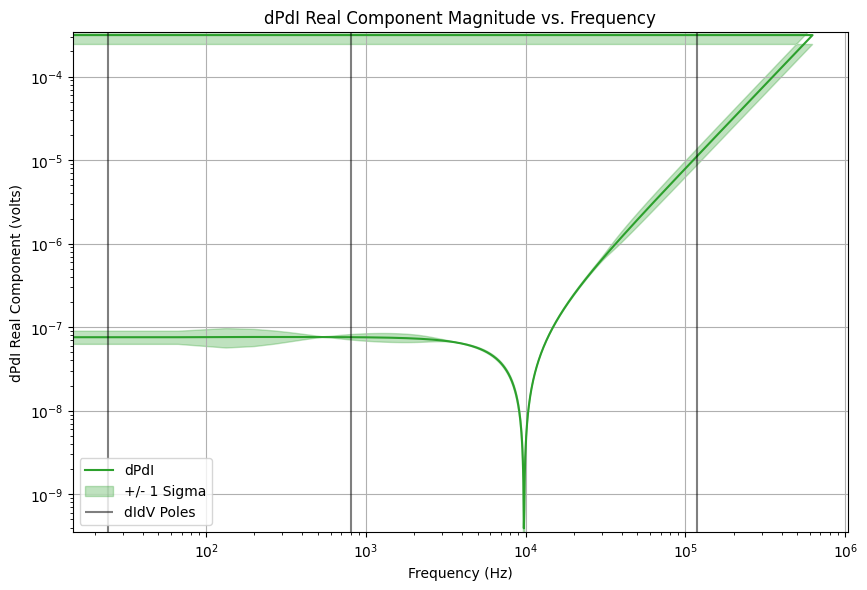

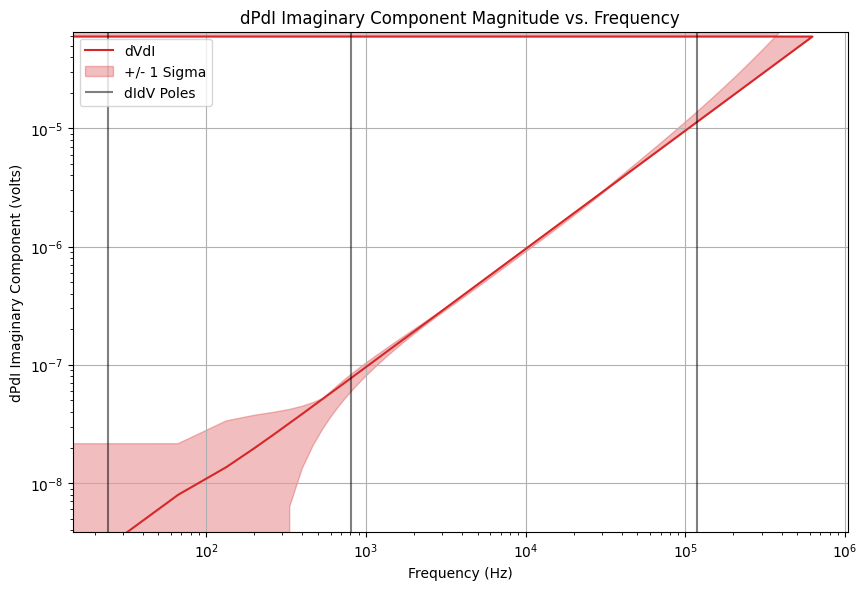

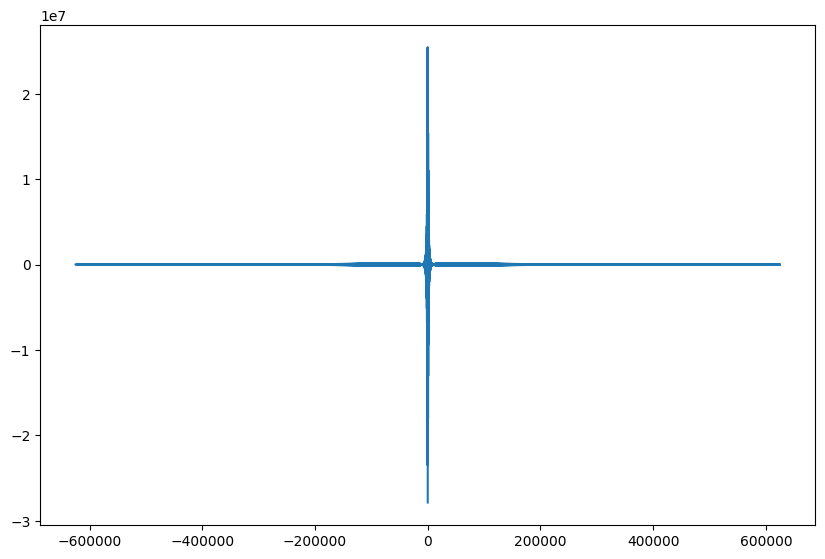

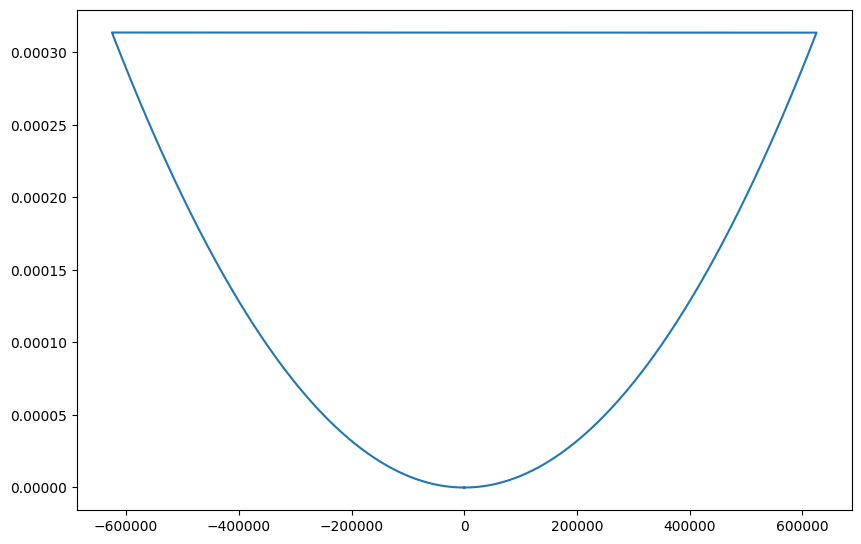

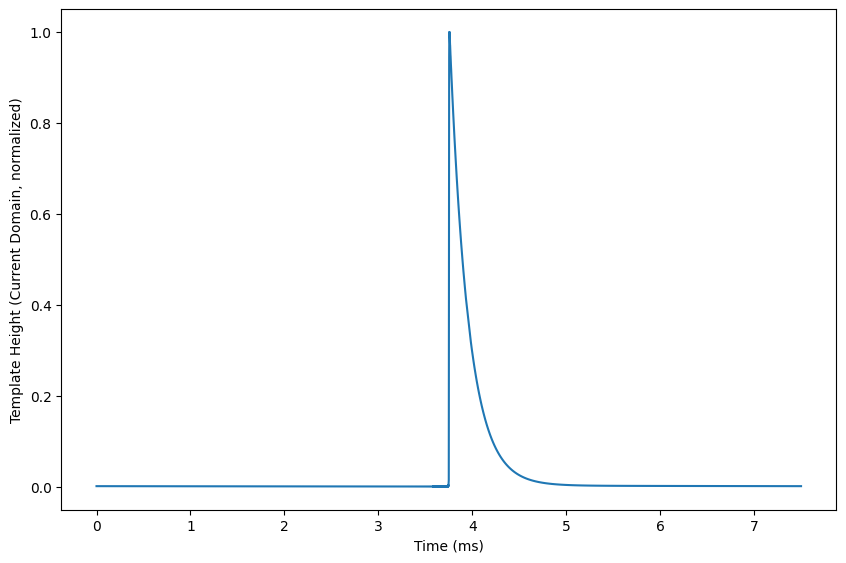

INFO: Saving filter/TES data to file ~/processing/run58/filterdata/noise_20250206_202247_post.hdf5! (overwrite=True)


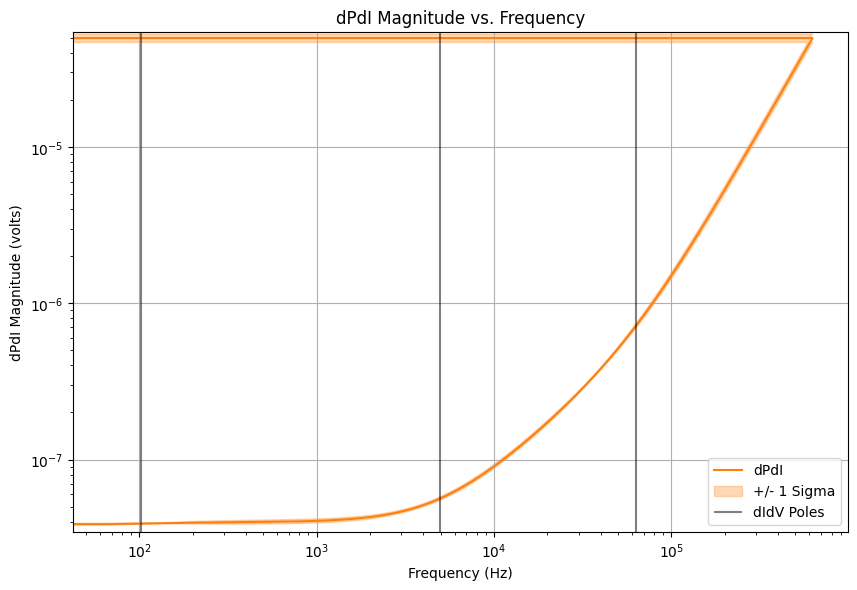

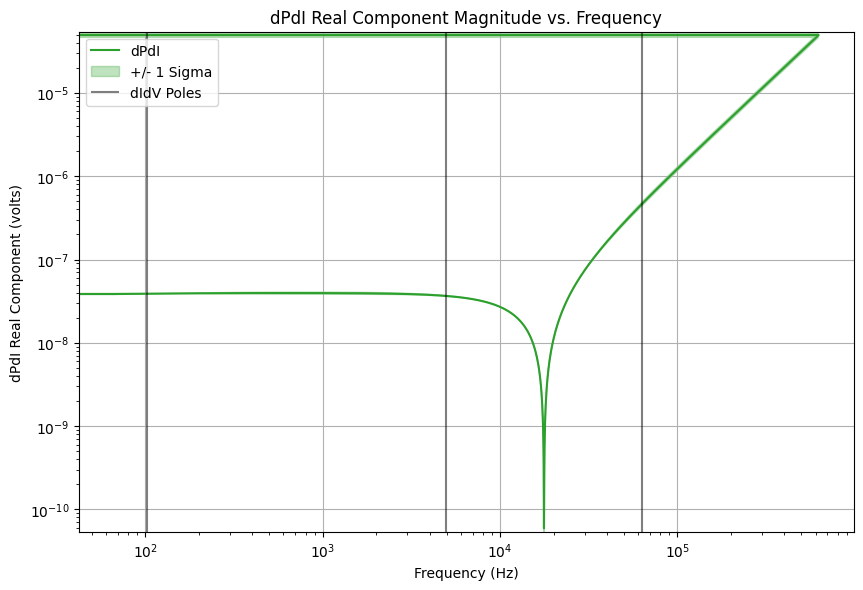

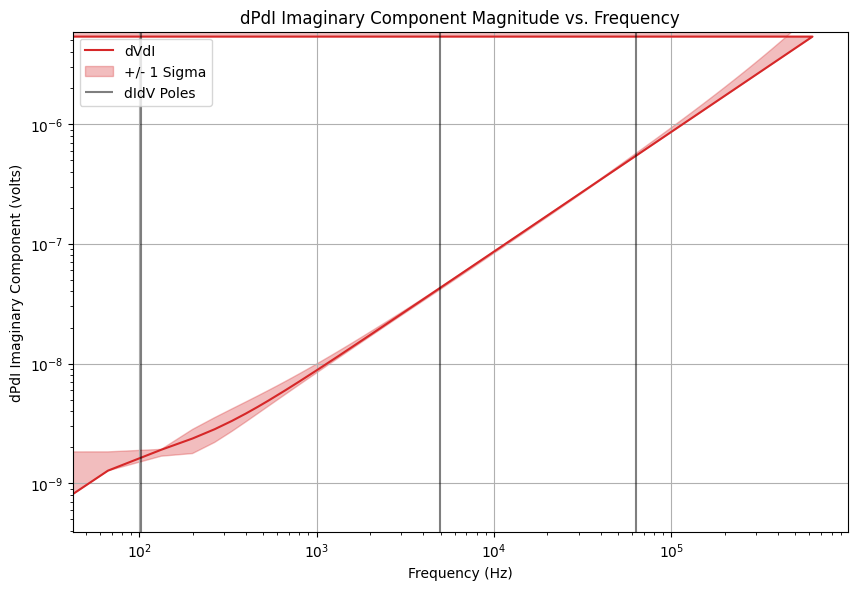

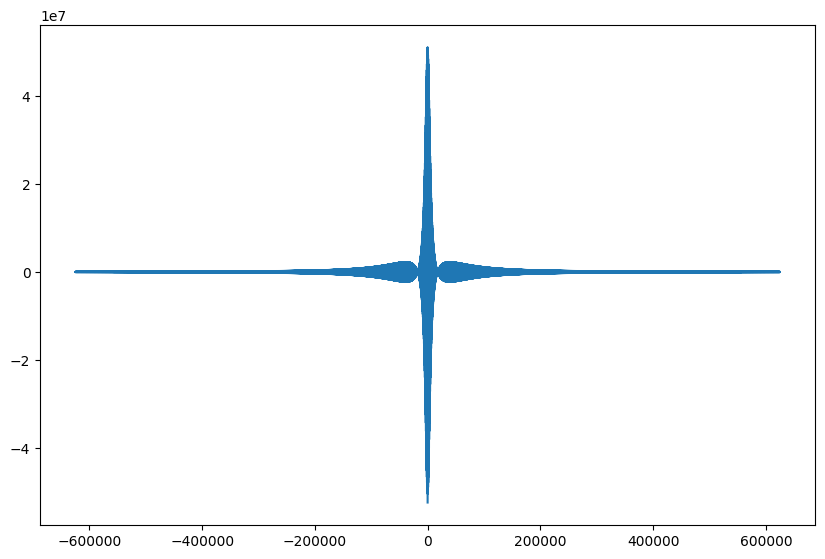

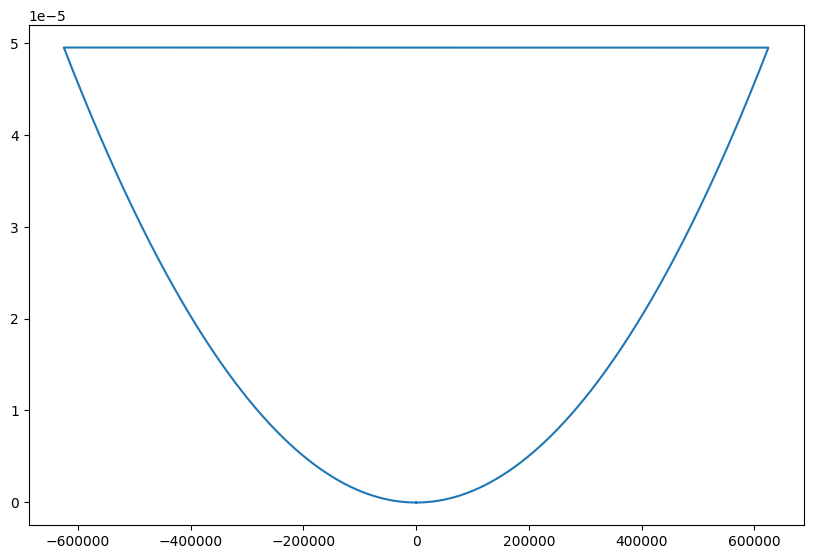

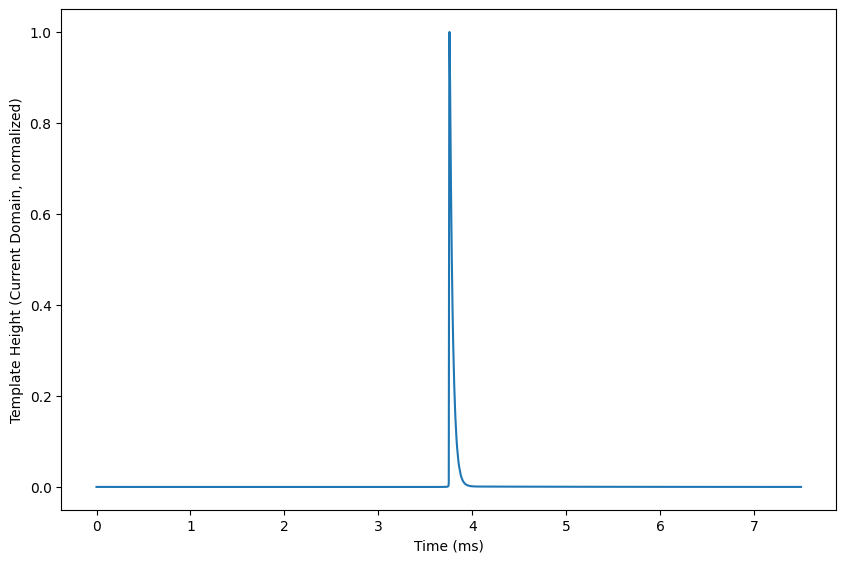

INFO: Saving filter/TES data to file ~/processing/run58/filterdata/noise_20250206_202247_post.hdf5! (overwrite=True)


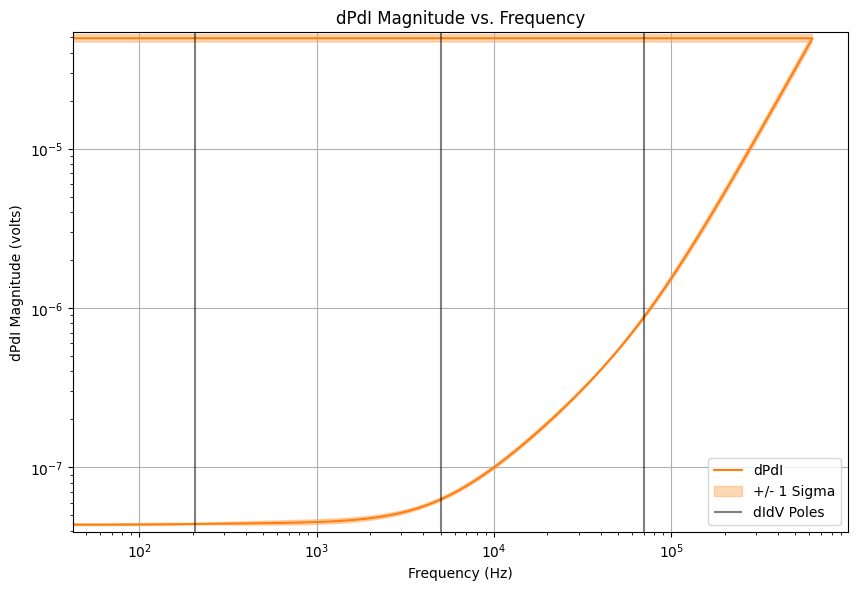

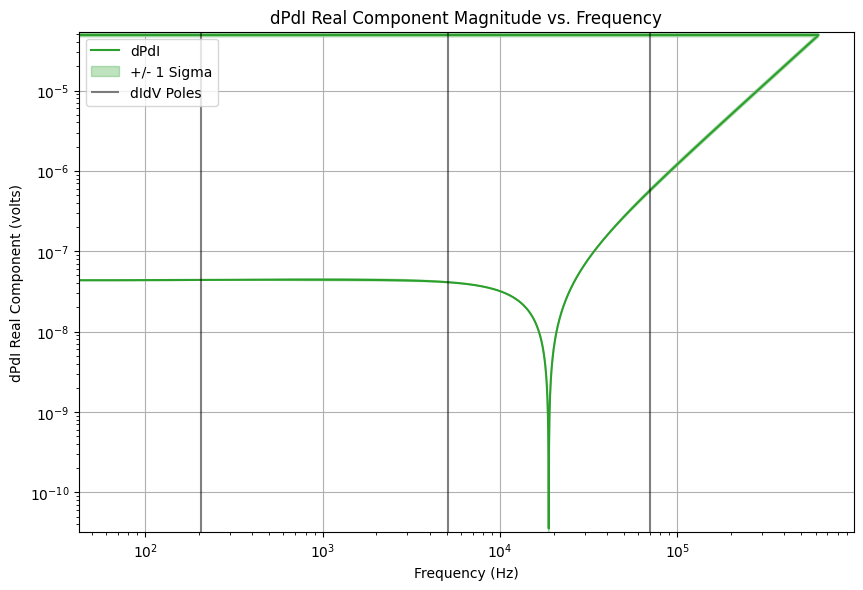

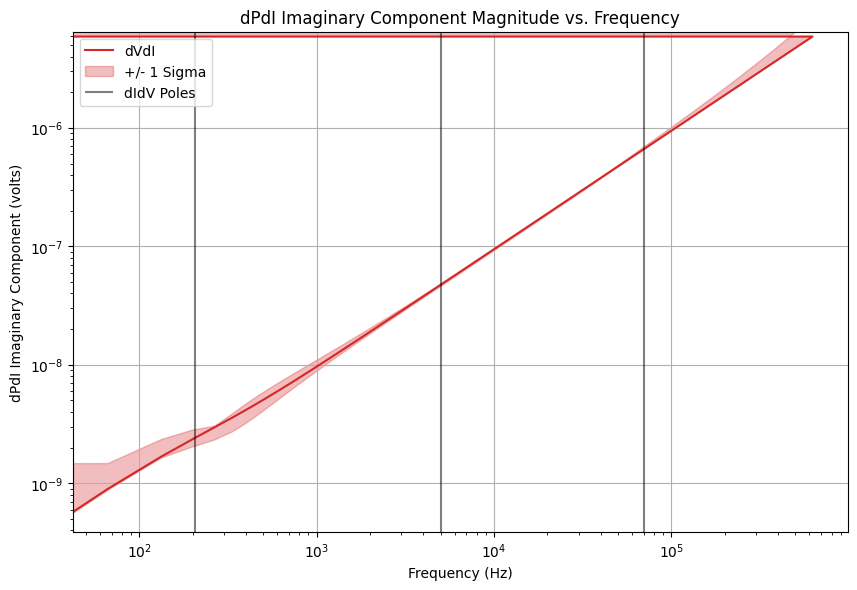

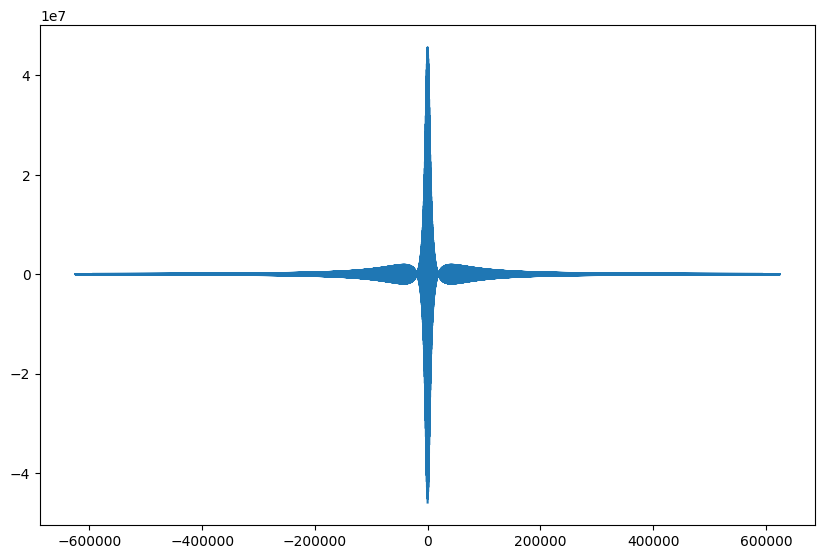

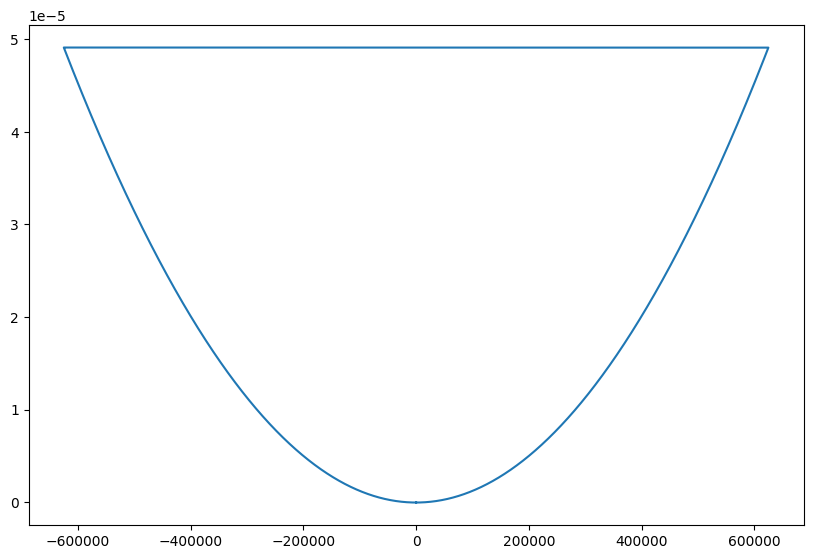

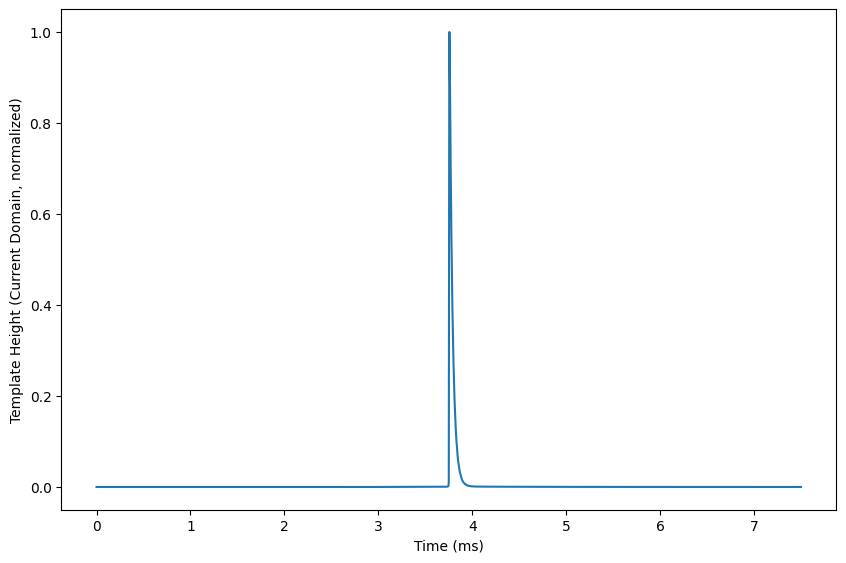

INFO: Saving filter/TES data to file ~/processing/run58/filterdata/noise_20250206_202247_post.hdf5! (overwrite=True)
INFO: Loading filter data from file ~/processing/run58/filterdata/noise_20250207_190322_post.hdf5
INFO: Loading filter data from file ./didvnoise_20250207_190322_post.hdf5


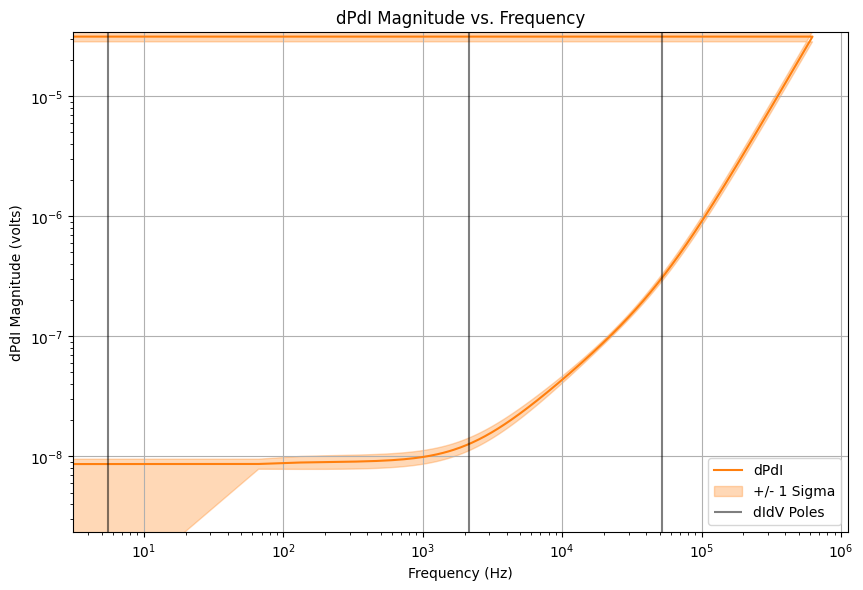

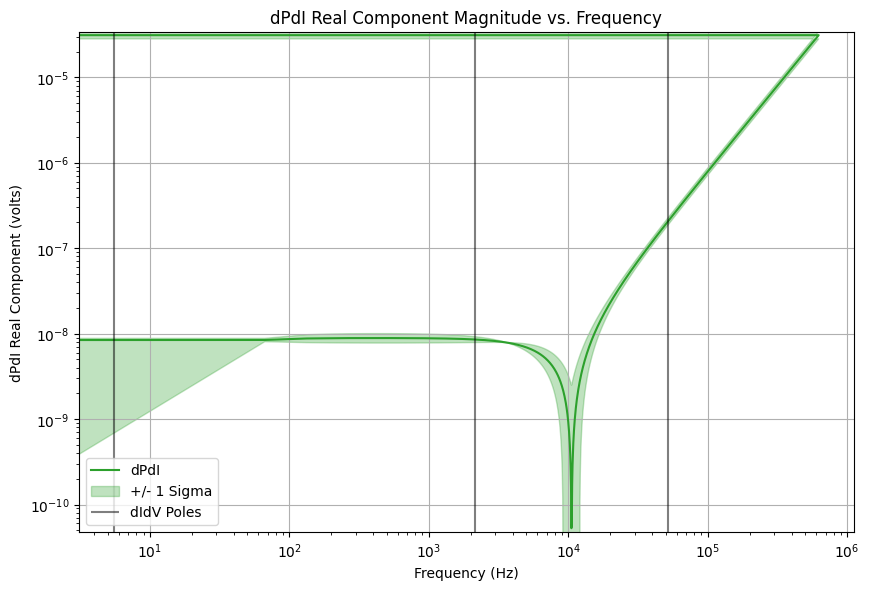

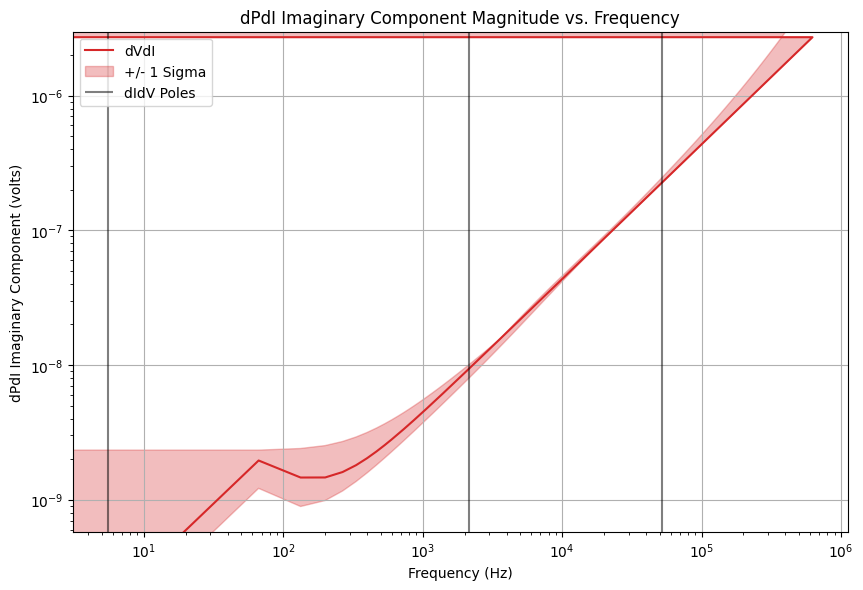

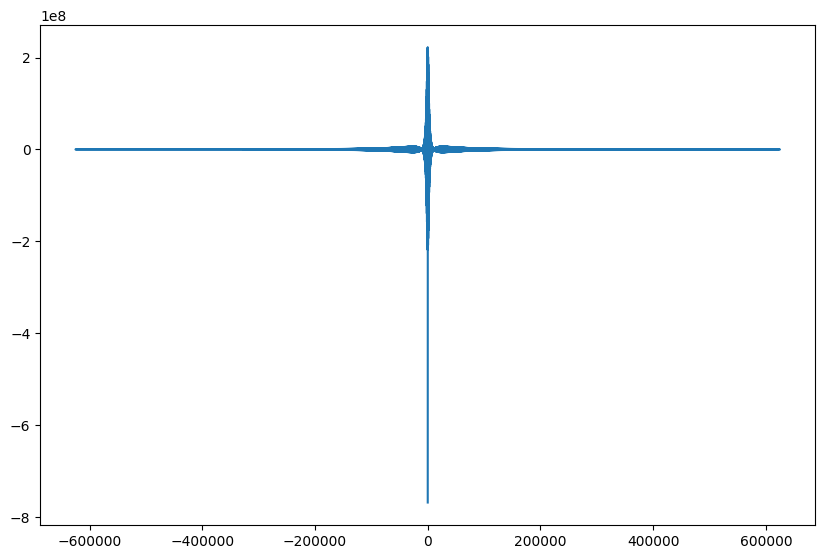

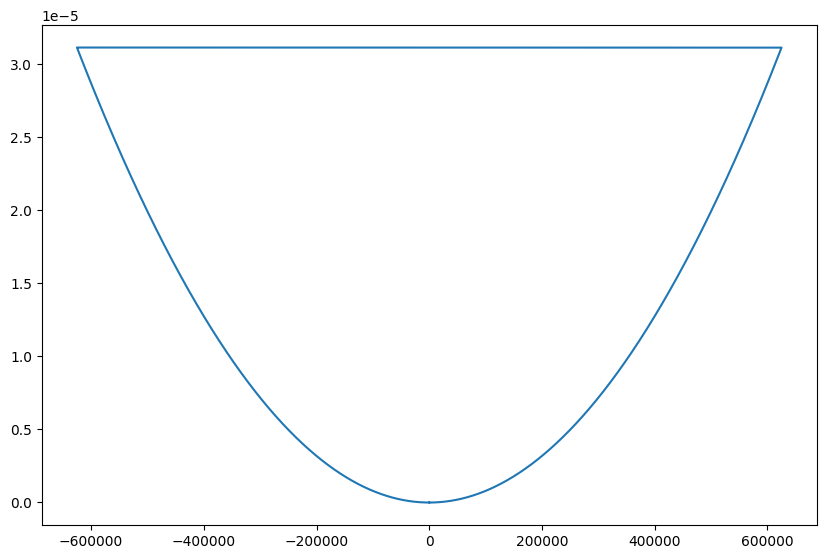

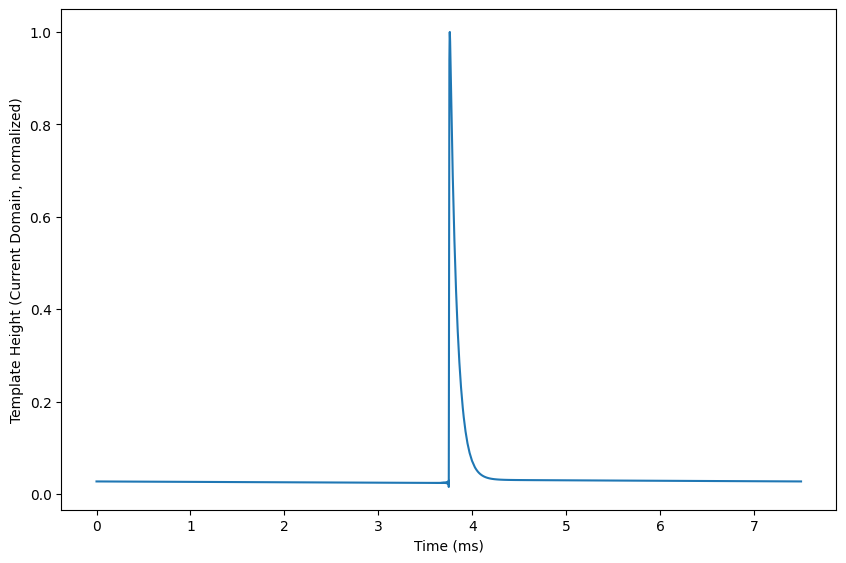

INFO: Saving filter/TES data to file ~/processing/run58/filterdata/noise_20250207_190322_post.hdf5! (overwrite=True)


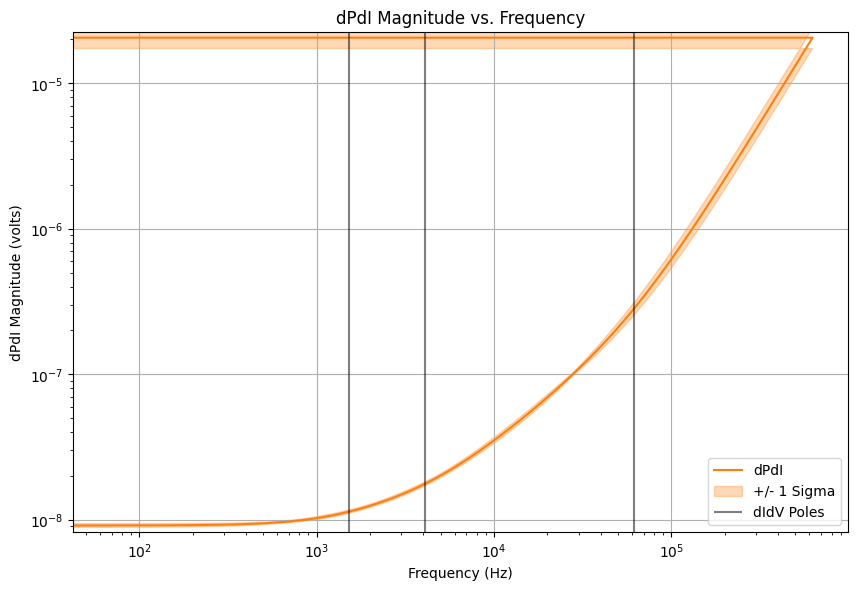

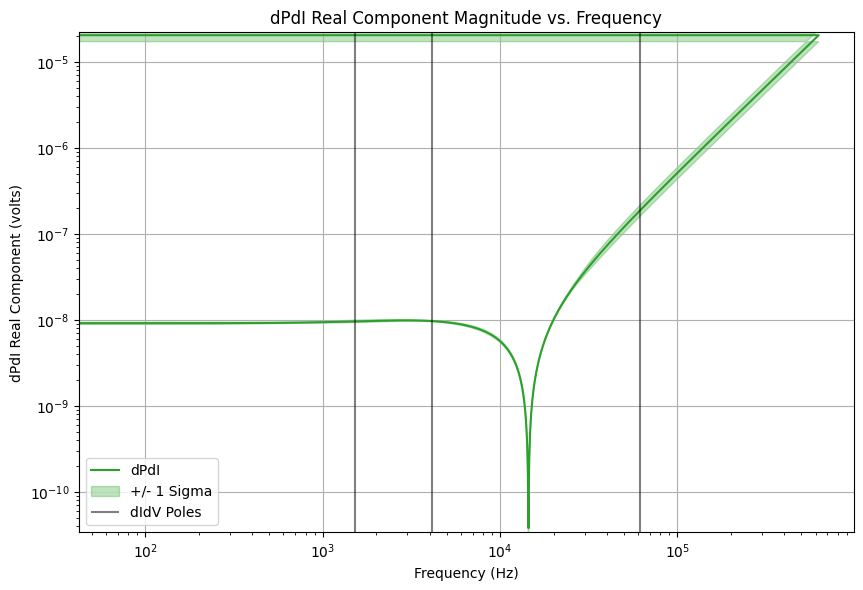

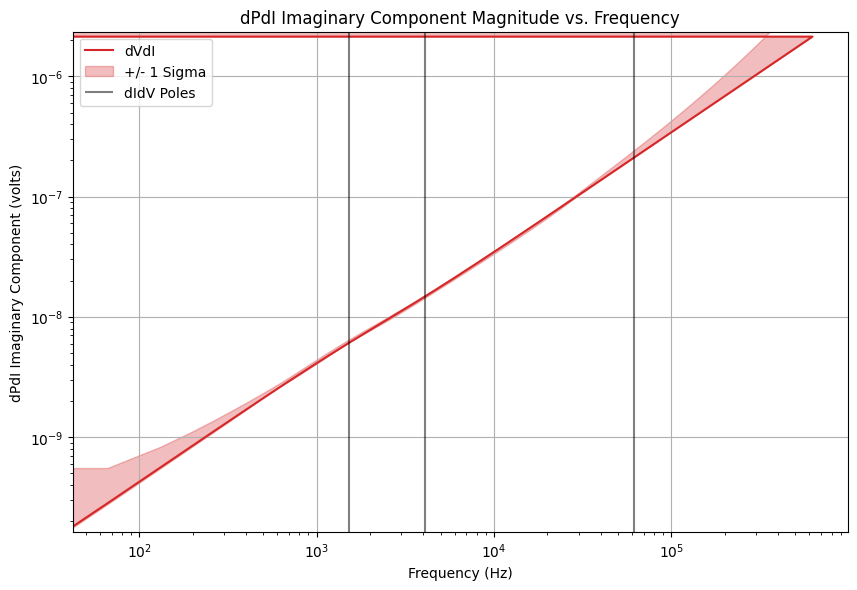

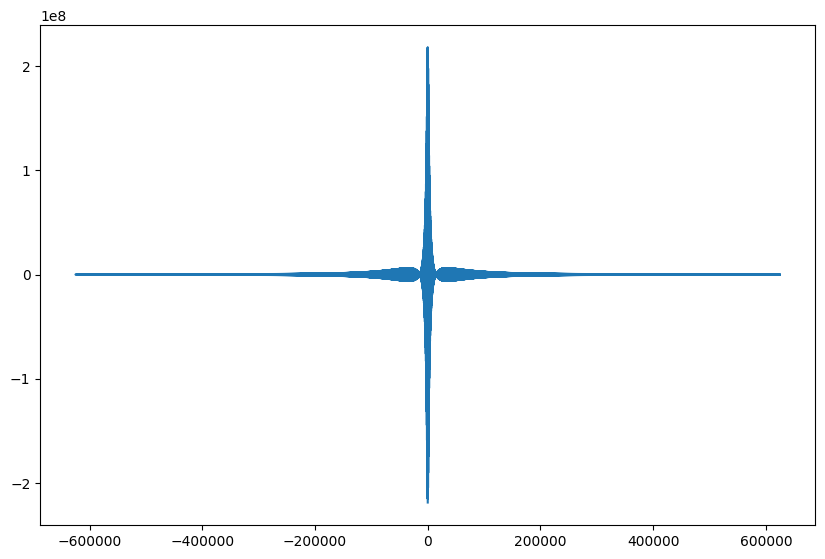

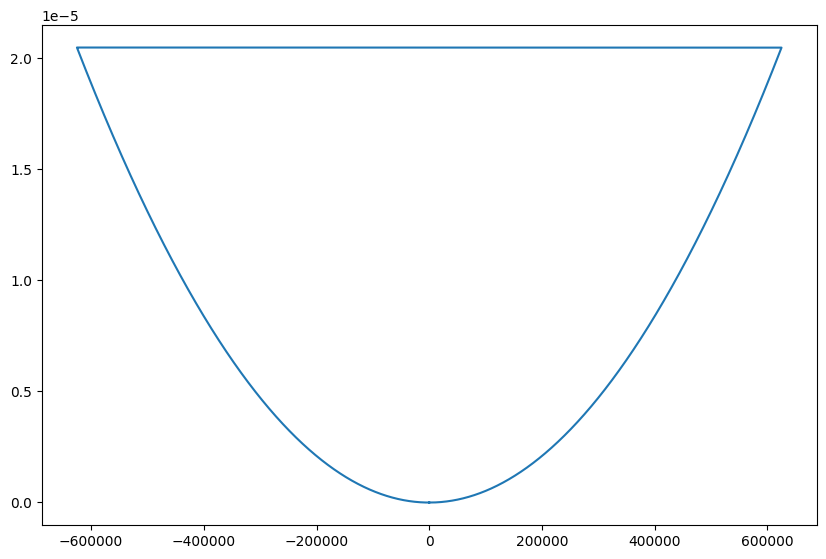

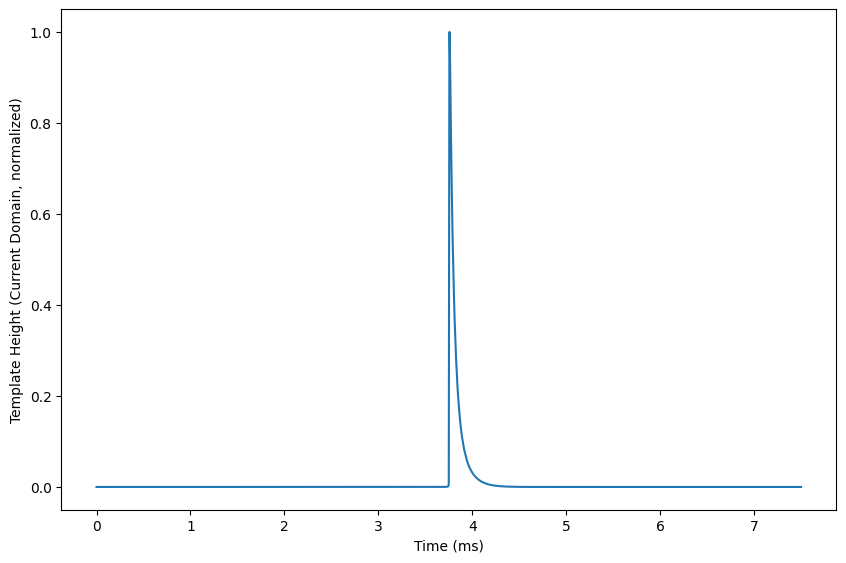

INFO: Saving filter/TES data to file ~/processing/run58/filterdata/noise_20250207_190322_post.hdf5! (overwrite=True)


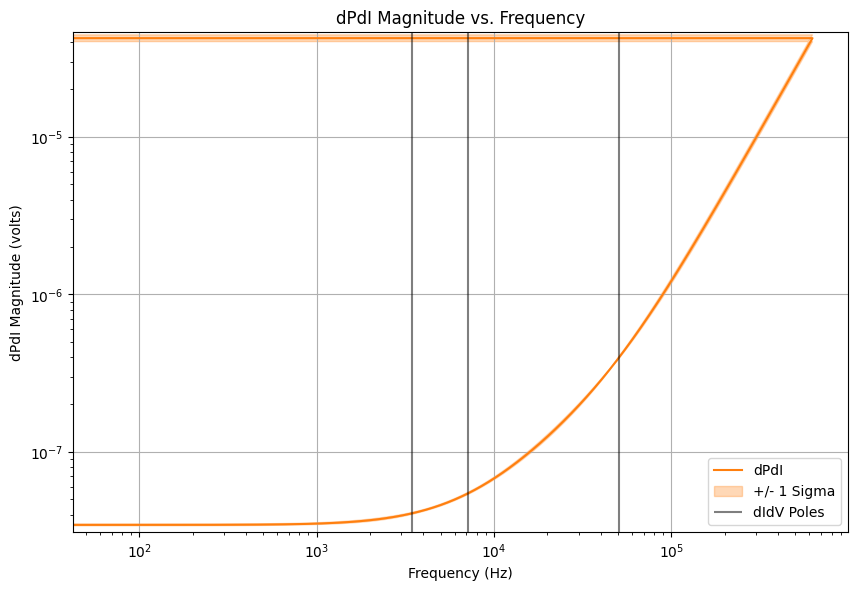

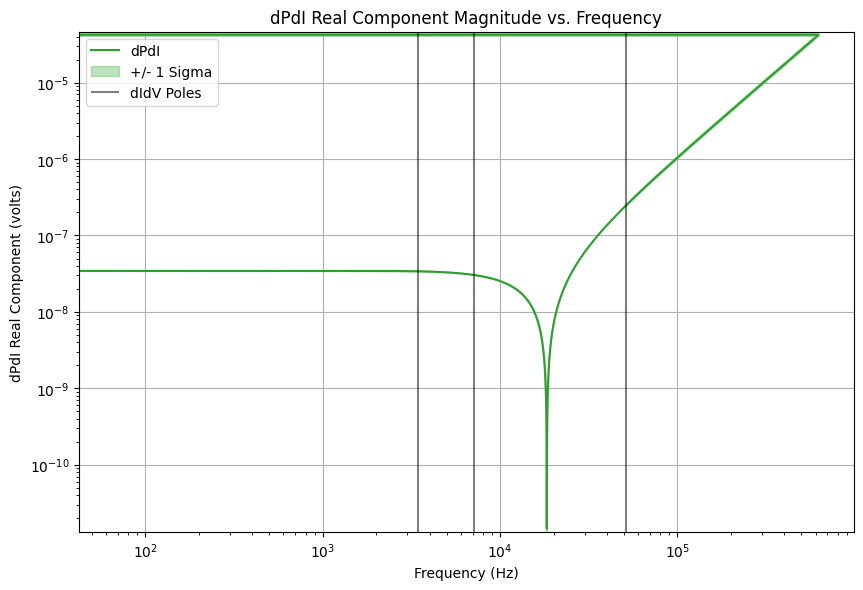

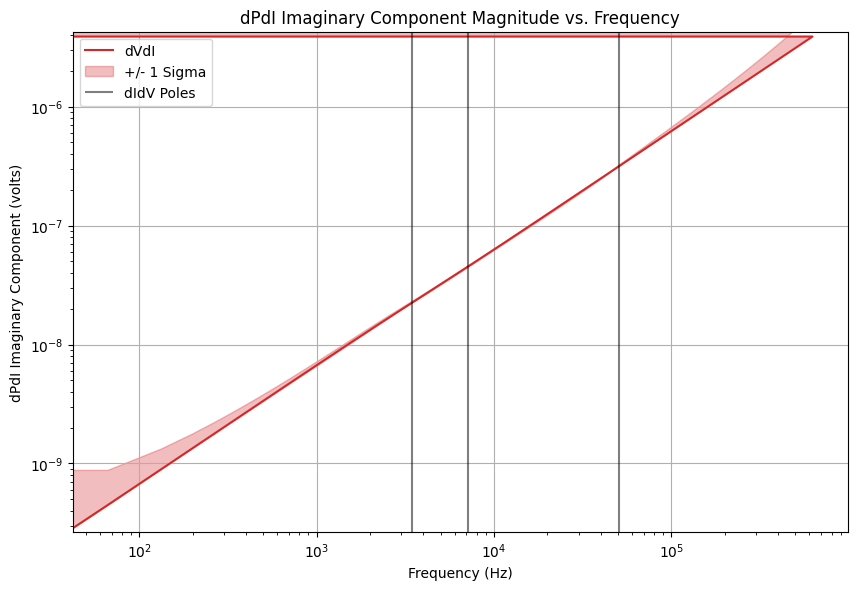

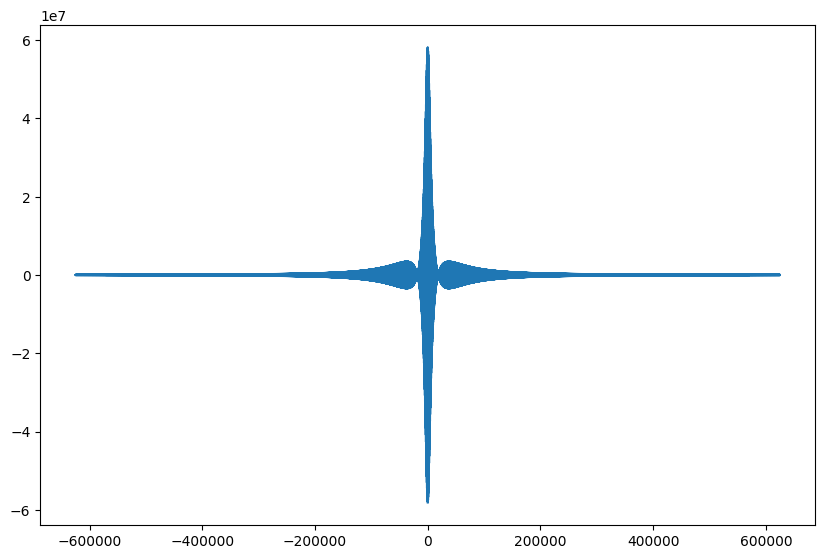

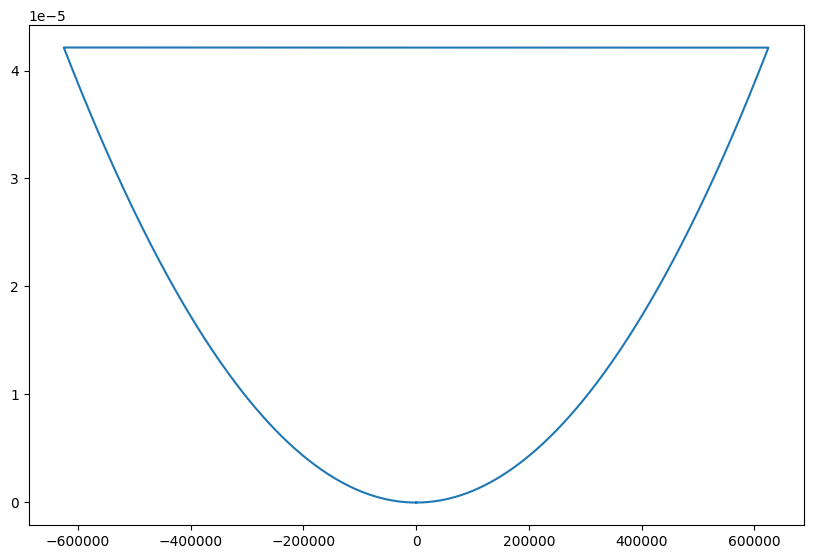

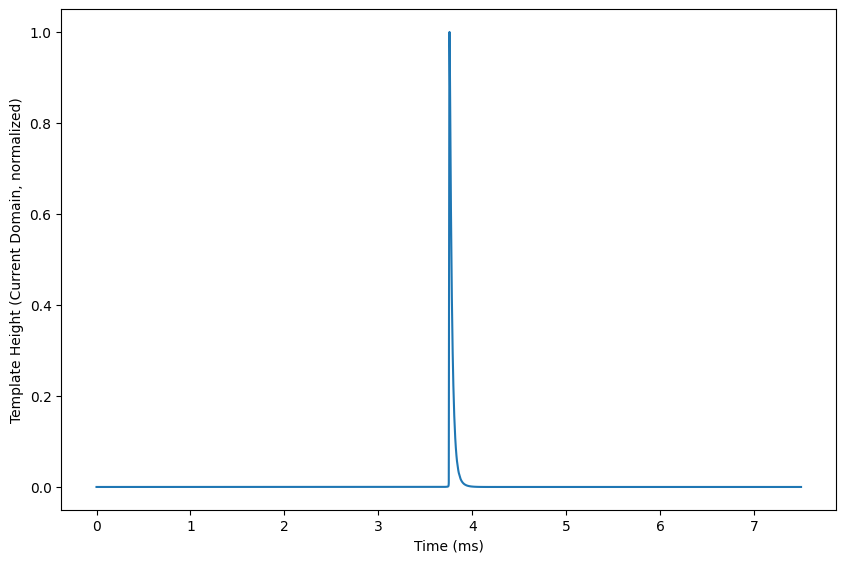

INFO: Saving filter/TES data to file ~/processing/run58/filterdata/noise_20250207_190322_post.hdf5! (overwrite=True)


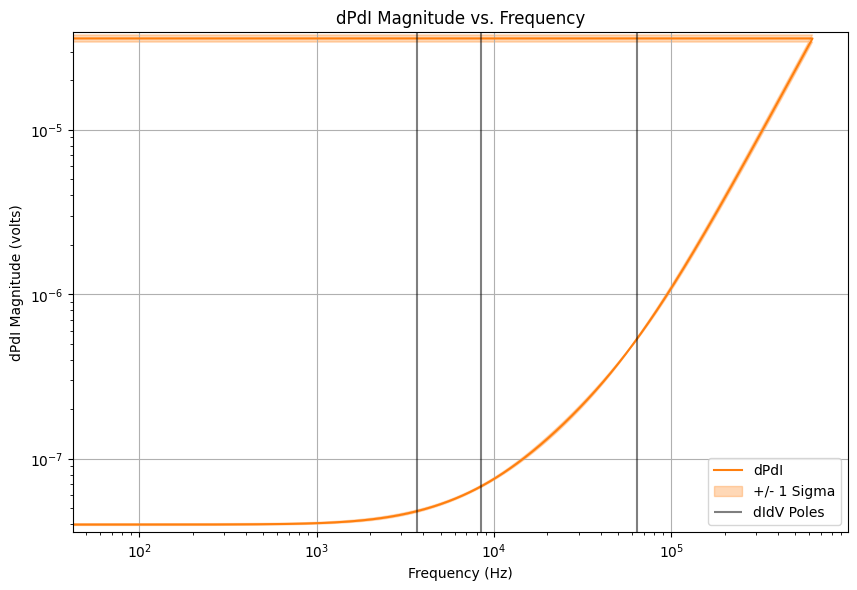

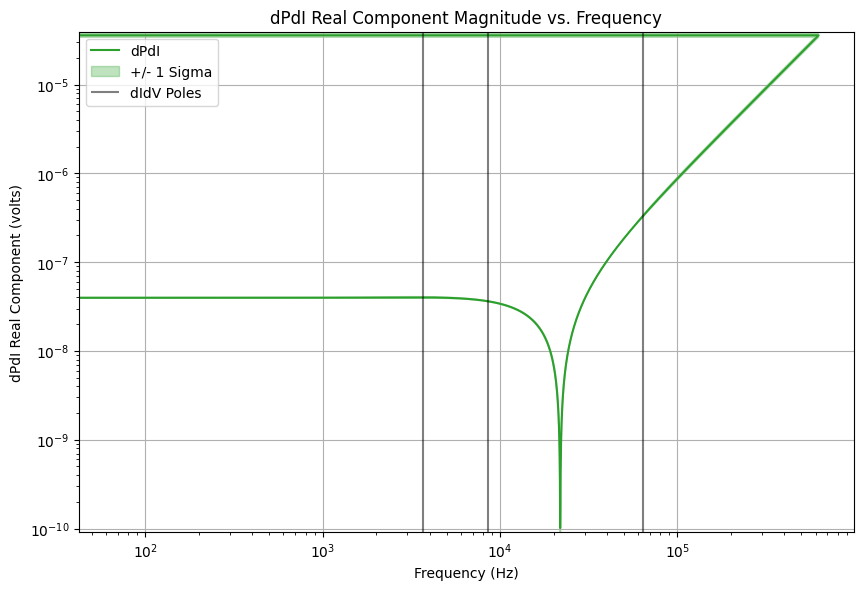

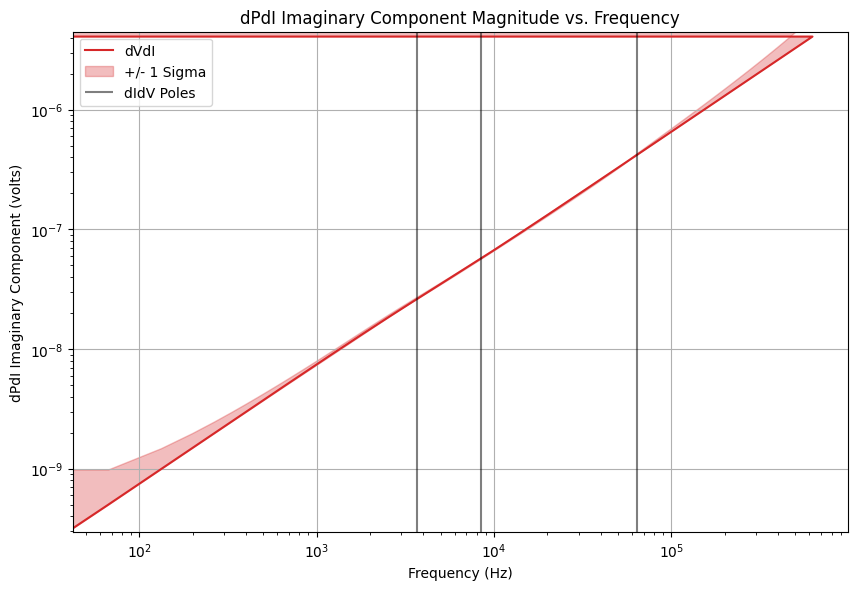

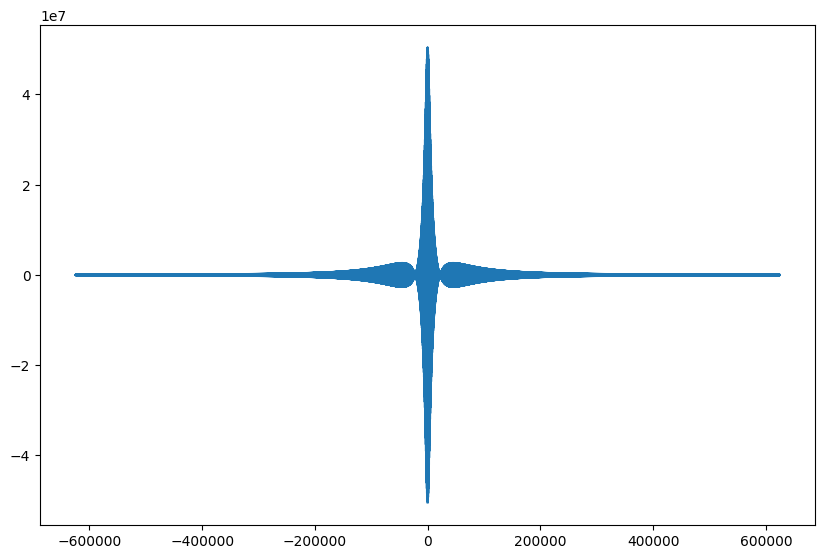

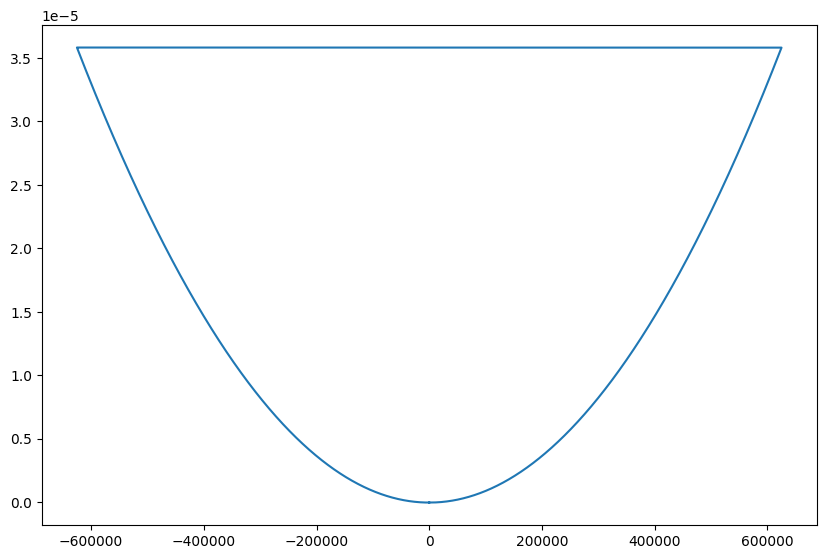

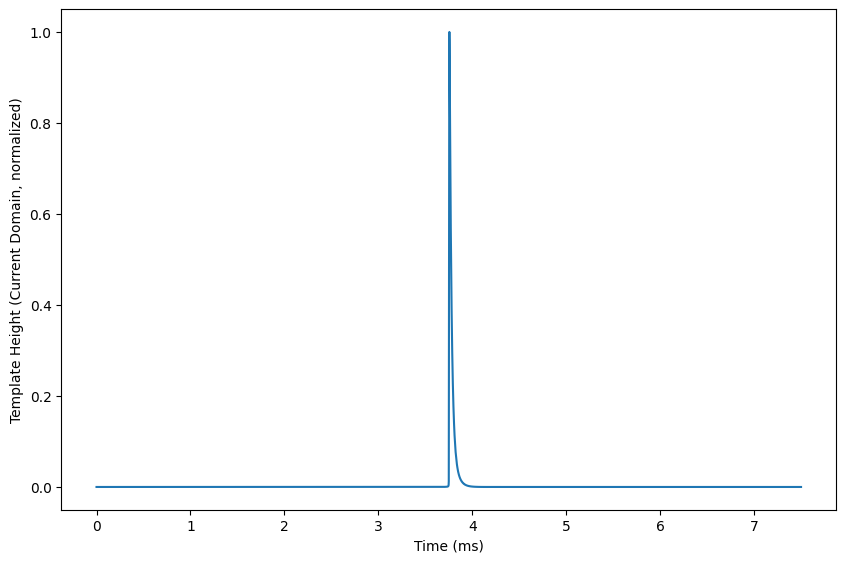

INFO: Saving filter/TES data to file ~/processing/run58/filterdata/noise_20250207_190322_post.hdf5! (overwrite=True)


In [87]:
gen_templates(raw_data_list, noise_raw_list, didv_test_list)

INFO: Loading filter data from file ./didvnoise_20250206_090218_pre.hdf5
INFO: Loading filter data from file ~/processing/run58/filterdata/noise_20250206_090218_pre.hdf5
Calculating dPdI! This may take some time.


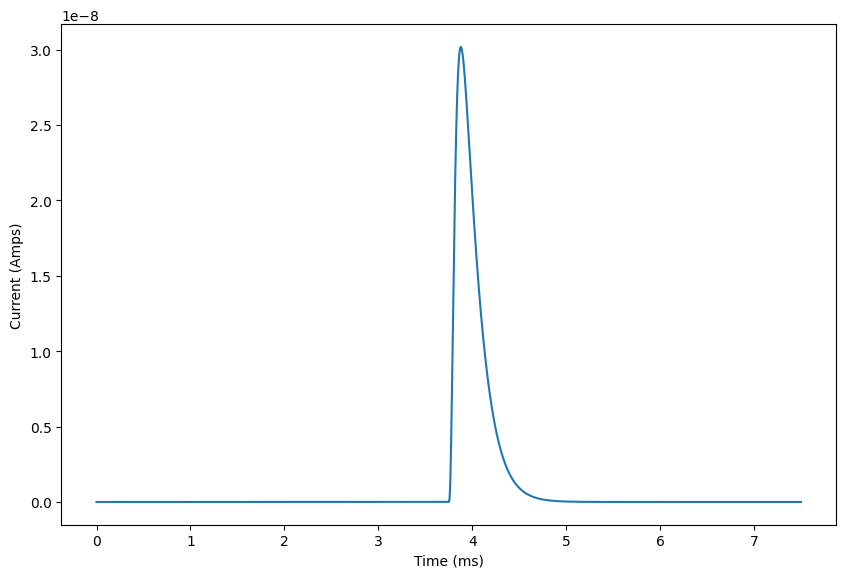

Calculating dPdI! This may take some time.


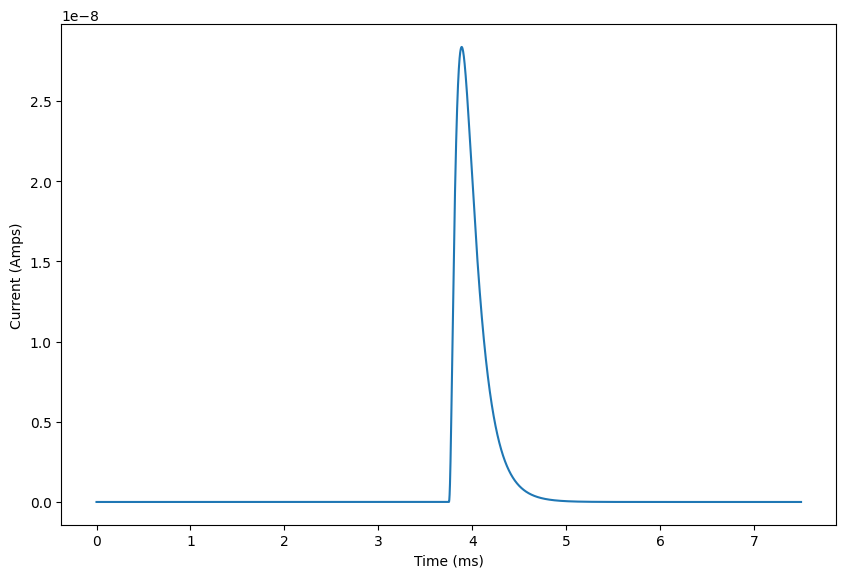

Calculating dPdI! This may take some time.


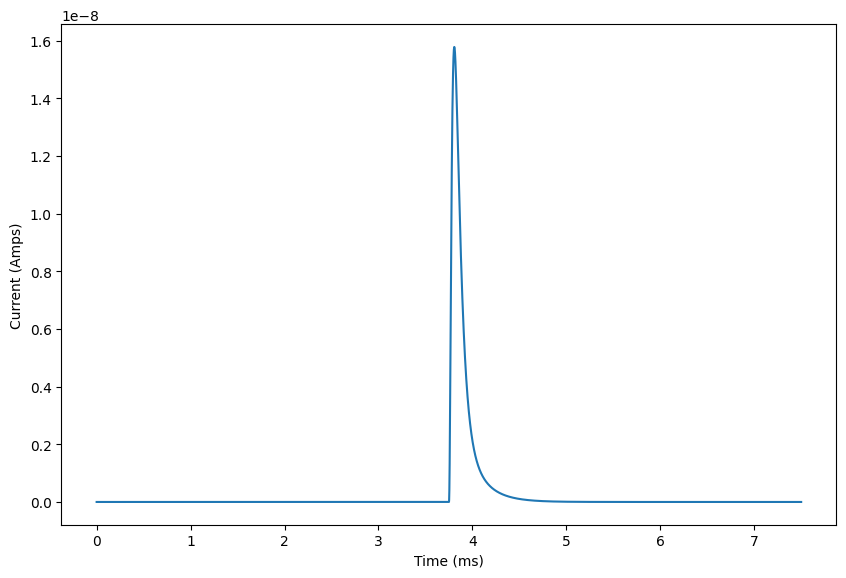

Calculating dPdI! This may take some time.


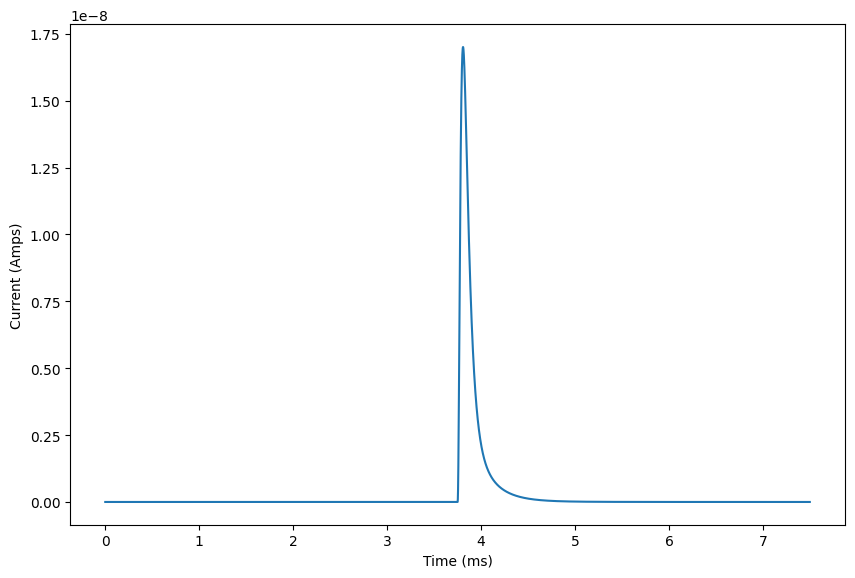

INFO: Saving filter/TES data to file ~/processing/run58/filterdata/noise_20250206_090218_pre.hdf5! (overwrite=True)
INFO: Loading filter data from file ./didvnoise_20250206_202247_post.hdf5
INFO: Loading filter data from file ~/processing/run58/filterdata/noise_20250206_202247_post.hdf5
Calculating dPdI! This may take some time.


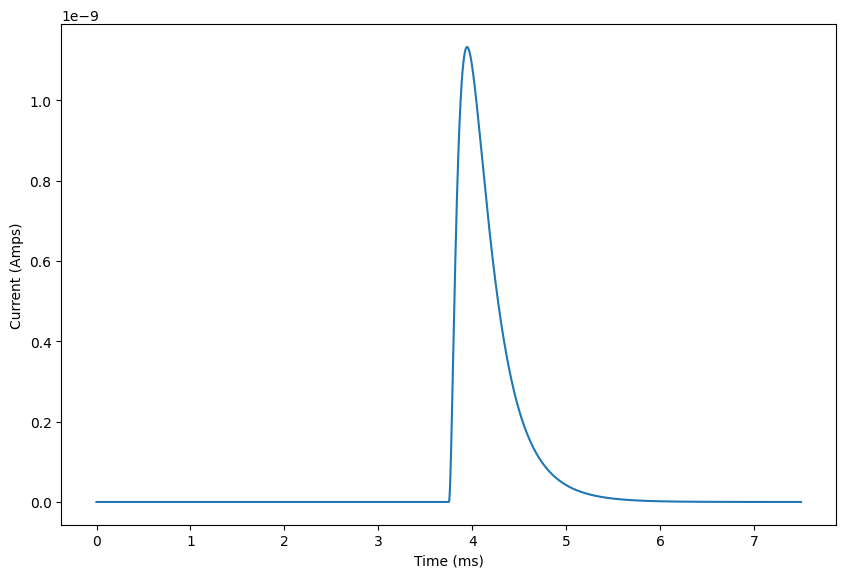

Calculating dPdI! This may take some time.


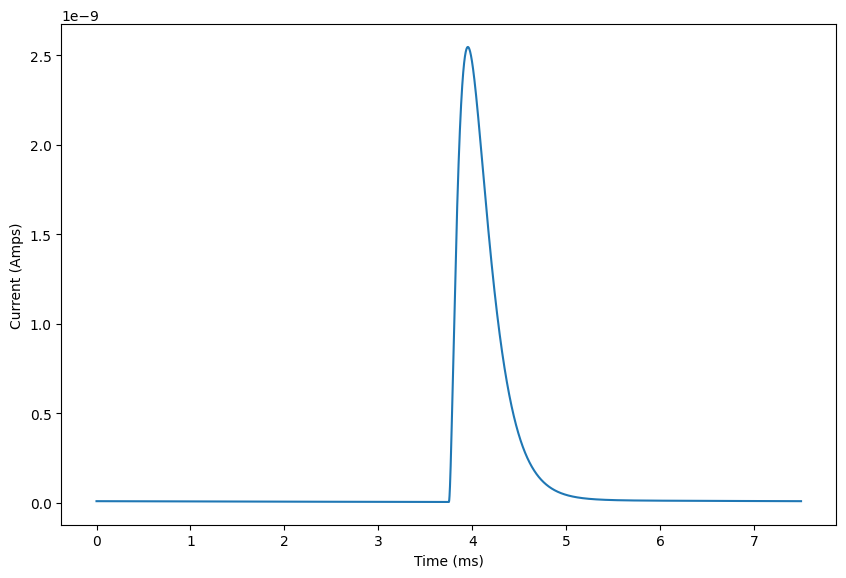

Calculating dPdI! This may take some time.


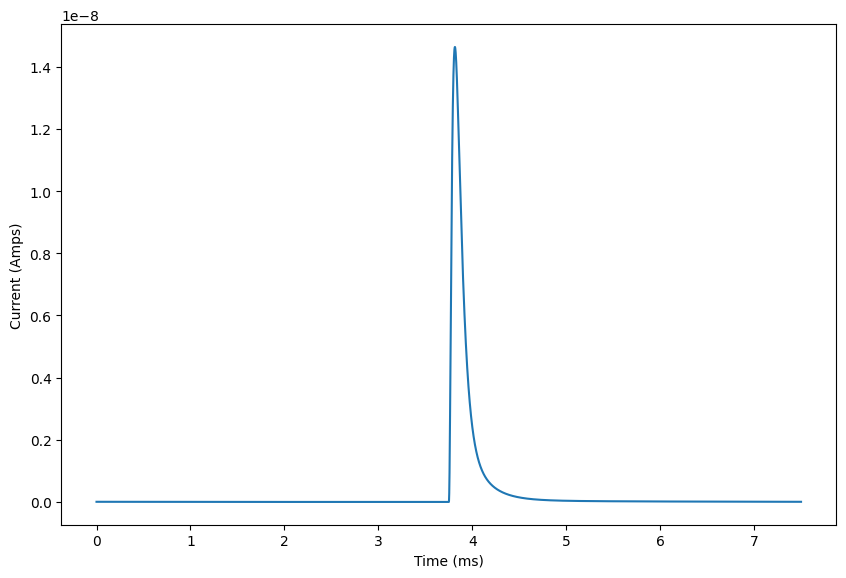

Calculating dPdI! This may take some time.


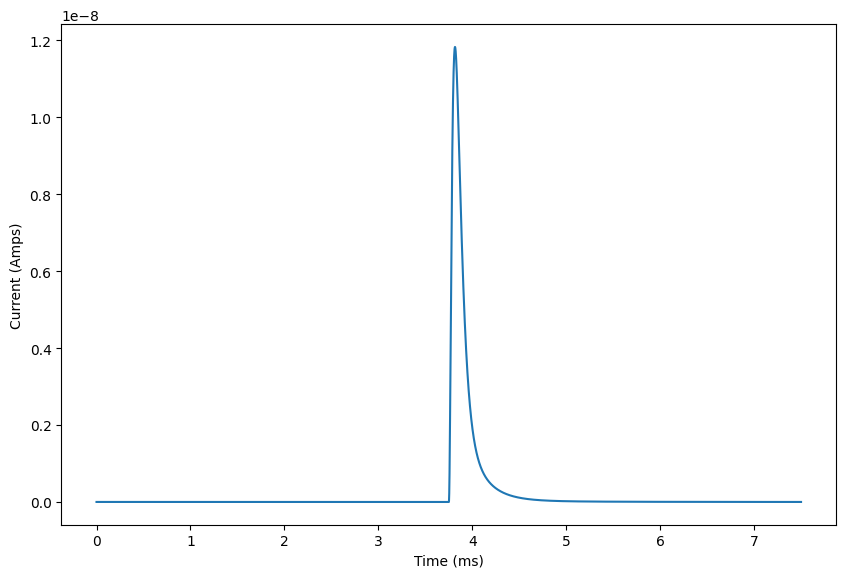

INFO: Saving filter/TES data to file ~/processing/run58/filterdata/noise_20250206_202247_post.hdf5! (overwrite=True)
INFO: Loading filter data from file ./didvnoise_20250207_190322_post.hdf5
INFO: Loading filter data from file ~/processing/run58/filterdata/noise_20250207_190322_post.hdf5
Calculating dPdI! This may take some time.


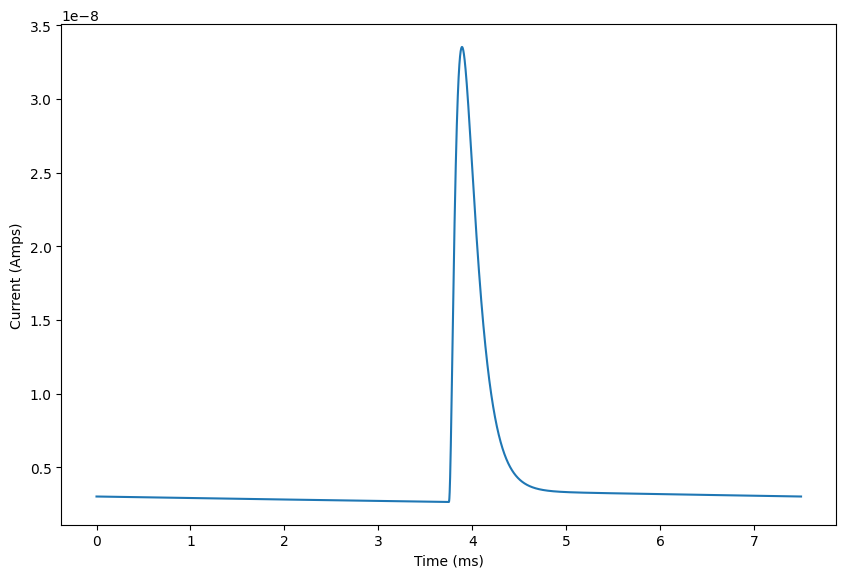

Calculating dPdI! This may take some time.


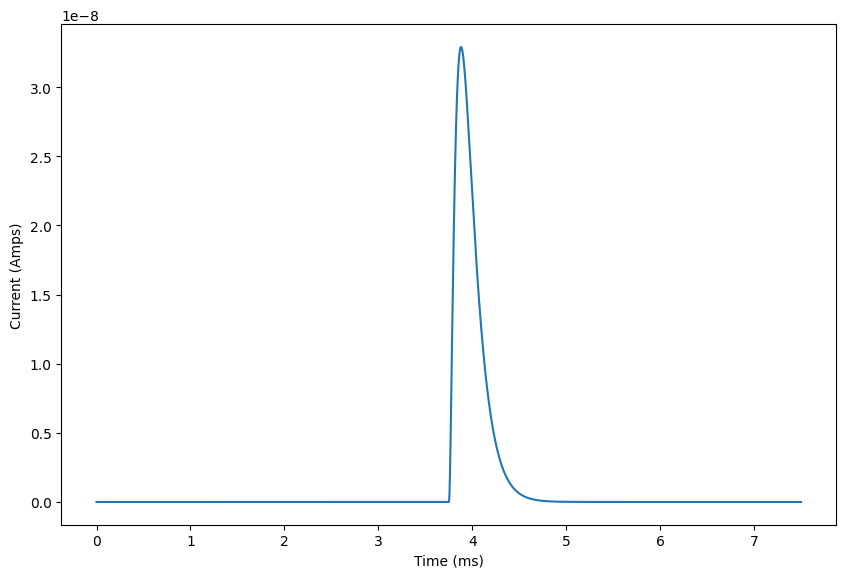

Calculating dPdI! This may take some time.


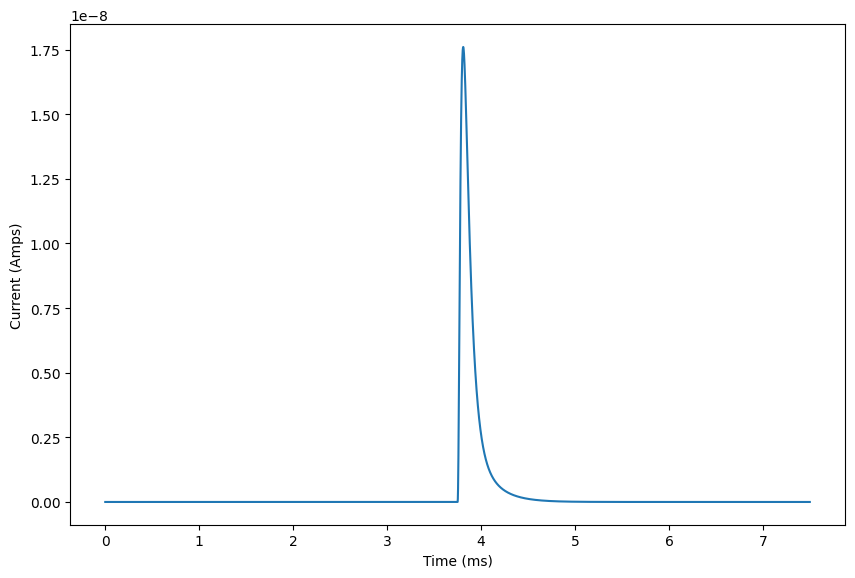

Calculating dPdI! This may take some time.


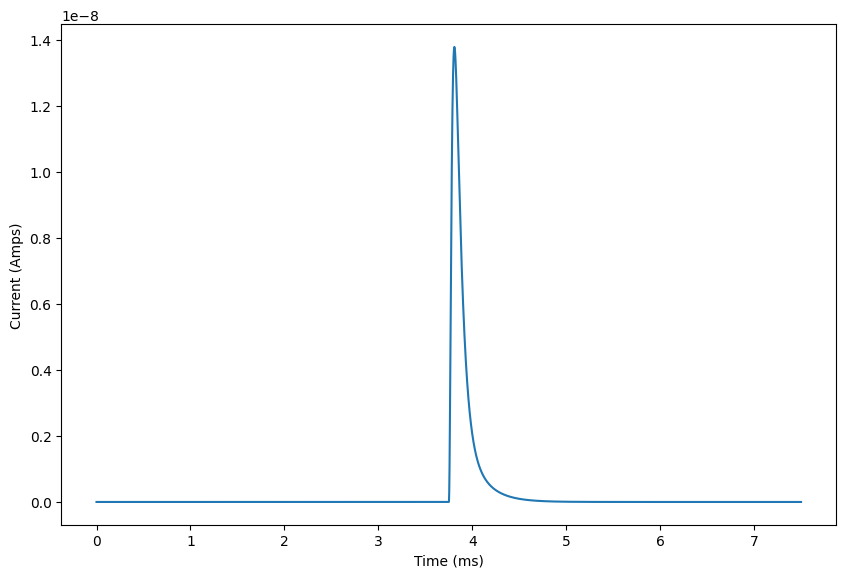

INFO: Saving filter/TES data to file ~/processing/run58/filterdata/noise_20250207_190322_post.hdf5! (overwrite=True)


In [98]:
set_phonon_templates(raw_data_list, noise_raw_list, didv_test_list, cal_path_list)

In [100]:
template_test = Template(verbose=True)
template_test.load_hdf5('~/processing/run58/filterdata/noise_20250206_090218_pre.hdf5')
template_test.describe()

INFO: Loading filter data from file ~/processing/run58/filterdata/noise_20250206_090218_pre.hdf5
List of channels: ['Mv4025pcBF4mmRight', 'Mv4025pcBF4mmLeft', 'Mv4025pcBF1mmRight', 'Mv4025pcBF1mmLeft']

Channel Mv4025pcBF4mmRight:
 * Tag "default":
    psd: pandas.Series (9375,)
    template: pandas.Series (9375,)
 * Tag "phonon":
    template: pandas.Series (9375,)

Channel Mv4025pcBF4mmLeft:
 * Tag "default":
    psd: pandas.Series (9375,)
    template: pandas.Series (9375,)
 * Tag "phonon":
    template: pandas.Series (9375,)

Channel Mv4025pcBF1mmRight:
 * Tag "default":
    psd: pandas.Series (9375,)
    template: pandas.Series (9375,)
 * Tag "phonon":
    template: pandas.Series (9375,)

Channel Mv4025pcBF1mmLeft:
 * Tag "default":
    psd: pandas.Series (9375,)
    template: pandas.Series (9375,)
 * Tag "phonon":
    template: pandas.Series (9375,)


['didvnoise_20250206_090218_pre.hdf5',
 'didvnoise_20250206_202247_post.hdf5',
 'didvnoise_20250207_190322_post.hdf5']